# Triku stability measures

In this notebook we will calculate certain stability and robustness measures, that is, we are goin to test certain parameters in triku and see how different the selected genes are.

The main measurements to take into account will be **PCA number of components**, and **knn**; since those two components end up taking a bunch of computation time. By default PCA components are set to 25 and knn is set to $0.5\sqrt{n_{cells}}$. For large datasets (> 20k cells), the processing can take a couple of minutes (assuming parallel processing, else it takes ~ 4 minutes), mainly because of the calculation of PCA and knn indices. Also, calculation of distances using the **randomized matrix** doubles the time amount, because all steps have to be repeated using the randomized matrix. 

Thus, in this step we are going to see how each of those variables affects the number of selected genes. To do that we will use a set of benchmarking dataset by Mereu et al. The datasets are PBMC from human and colon cells from mouse, with different library preparation methods: Chromium, CEL-seq, SMART-seq2, QUARTZ-seq, InDrop, ddSEQ, and snChromium. The dataset is interesting to study stability across different library preparation methods, but also considering two different organisms and tissues. We will also include artificial datasets to include a ground truth when it is necessary.

There is another dataset, from Ding et al. with a similar benchmark, which is also included here, in this dataset they apply Smart-seq2, CEL-seq2, 10x chromium (V2 and V3), Drop-seq, Seq-well, inDrops, sci-RNAseq. They share 10x, Smart-seq2, CEL-seq (not version), inDrops. We should then have a fair set of datasets to apply comparisons to.

In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
%matplotlib inline

In [4]:
import triku as tk
import scanpy as sc
import pandas as pd
import numpy as np

from bokeh.io import show, output_notebook, reset_output
from bokeh.plotting import figure
from bokeh.models import LinearColorMapper

import matplotlib.pyplot as plt
import matplotlib as mpl

from tqdm.notebook import tqdm
from itertools import product

reset_output()
output_notebook()

Loading BokehJS ...

In [5]:
seed = 1

In [6]:
import sys, os
sys.path.insert(0, os.getcwd() + '/code')

# Selection of palettes for cluster coloring, and scatter values
from triku_nb_code.palettes_and_cmaps import magma, bold_and_vivid
from triku_nb_code.robustness_functions import run_all_batches
from triku_nb_code.robustness_functions import run_batch, random_noise_parameter, plot_scatter_parameter, compare_parameter, \
get_all_pics_dataset, plot_scatter_datasets


ModuleNotFoundError: No module named 'palettes_and_cmaps'

In [7]:
os.makedirs(os.getcwd() + '/exports/robustness/', exist_ok=True)

In [8]:
data_dir = os.path.dirname(os.getcwd()) + '/data/'

# csv generation
To do the analysis across conditions, we will generate all possible combinations, and later on do the analysis.

In [30]:
save_dir = os.getcwd() + '/exports/robustness/'
read_dir = data_dir + 'Mereu_2020/'

lib_preps = ['SingleNuclei', 'Dropseq', 'inDrop', '10X', 'SMARTseq2', 'CELseq2', 'QUARTZseq']
orgs = ['mouse', 'human'] 

run_all_batches(lib_preps, orgs, 'mereu', read_dir, save_dir) # Uncomment to run!

SingleNuclei_mouse.h5ad


100 3 56 0
FILE EXISTS!
100 3 56 1
FILE EXISTS!
100 3 56 2
FILE EXISTS!
100 3 56 3
FILE EXISTS!
100 3 56 4
FILE EXISTS!
100 5 56 0
FILE EXISTS!
100 5 56 1
FILE EXISTS!
100 5 56 2
FILE EXISTS!
100 5 56 3
FILE EXISTS!
100 5 56 4
FILE EXISTS!
100 10 56 0
FILE EXISTS!
100 10 56 1
FILE EXISTS!
100 10 56 2
FILE EXISTS!
100 10 56 3
FILE EXISTS!
100 10 56 4
FILE EXISTS!
100 20 56 0
FILE EXISTS!
100 20 56 1
FILE EXISTS!
100 20 56 2
FILE EXISTS!
100 20 56 3
FILE EXISTS!
100 20 56 4
FILE EXISTS!
100 30 56 0
FILE EXISTS!
100 30 56 1
FILE EXISTS!
100 30 56 2
FILE EXISTS!
100 30 56 3
FILE EXISTS!
100 30 56 4
FILE EXISTS!
100 40 56 0
FILE EXISTS!
100 40 56 1
FILE EXISTS!
100 40 56 2
FILE EXISTS!
100 40 56 3
FILE EXISTS!
100 40 56 4
FILE EXISTS!
100 50 56 0
FILE EXISTS!
100 50 56 1
FILE EXISTS!
100 50 56 2
FILE EXISTS!
100 50 56 3
FILE EXISTS!
100 50 56 4
FILE EXISTS!
100 100 56 0
FILE EXISTS!
100 100 56 1
FILE EXISTS!
100 100 56 2
FILE EXISTS!
100 100 56 3
FILE EXISTS!
100 100 56 4
FILE EXISTS!



100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 6 0
FILE EXISTS!
100 30 6 1
FILE EXISTS!
100 30 6 2
FILE EXISTS!
100 30 6 3
FILE EXISTS!
100 30 6 4
FILE EXISTS!
100 30 12 0
FILE EXISTS!
100 30 12 1
FILE EXISTS!
100 30 12 2
FILE EXISTS!
100 30 12 3
FILE EXISTS!
100 30 12 4
FILE EXISTS!
100 30 28 0
FILE EXISTS!
100 30 28 1
FILE EXISTS!
100 30 28 2
FILE EXISTS!
100 30 28 3
FILE EXISTS!
100 30 28 4
FILE EXISTS!
100 30 56 0
FILE EXISTS!
100 30 56 1
FILE EXISTS!
100 30 56 2
FILE EXISTS!
100 30 56 3
FILE EXISTS!
100 30 56 4
FILE EXISTS!
100 30 83 0
FILE EXISTS!
100 30 83 1
FILE EXISTS!
100 30 83 2
FILE EXISTS!
100 30 83 3
FILE EXISTS!
100 30 83 4
FILE EXISTS!
100 30 111 0
FILE EXISTS!
100 30 111 1
FILE EXISTS!
100 30 111 2
FILE EXISTS!
100 30 111 3
FILE EXISTS!
100 30 111 4
FILE EXISTS!
100 30 221 0
FILE EXISTS!
100 30 221 1
FILE EXISTS!
100 30 221 2
FILE EXISTS!
100 30 221 3
FILE EXISTS!
100 30 221 4
FILE EXISTS!


10 30 56 0
FILE EXISTS!
10 30 56 1
FILE EXISTS!
10 30 56 2
FILE EXISTS!
10 30 56 3
FILE EXISTS!
10 30 56 4
FILE EXISTS!
20 30 56 0
FILE EXISTS!
20 30 56 1
FILE EXISTS!
20 30 56 2
FILE EXISTS!
20 30 56 3
FILE EXISTS!
20 30 56 4
FILE EXISTS!
30 30 56 0
FILE EXISTS!
30 30 56 1
FILE EXISTS!
30 30 56 2
FILE EXISTS!
30 30 56 3
FILE EXISTS!
30 30 56 4
FILE EXISTS!
50 30 56 0
FILE EXISTS!
50 30 56 1
FILE EXISTS!
50 30 56 2
FILE EXISTS!
50 30 56 3
FILE EXISTS!
50 30 56 4
FILE EXISTS!
100 30 56 0
FILE EXISTS!
100 30 56 1
FILE EXISTS!
100 30 56 2
FILE EXISTS!
100 30 56 3
FILE EXISTS!
100 30 56 4
FILE EXISTS!
200 30 56 0
FILE EXISTS!
200 30 56 1
FILE EXISTS!
200 30 56 2
FILE EXISTS!
200 30 56 3
FILE EXISTS!
200 30 56 4
FILE EXISTS!
500 30 56 0
FILE EXISTS!
500 30 56 1
FILE EXISTS!
500 30 56 2
FILE EXISTS!
500 30 56 3
FILE EXISTS!
500 30 56 4
FILE EXISTS!
1000 30 56 0
FILE EXISTS!
1000 30 56 1
FILE EXISTS!
1000 30 56 2
FILE EXISTS!
1000 30 56 3
FILE EXISTS!
1000 30 56 4
FILE EXISTS!

SingleNuclei_h

100 3 39 0
FILE EXISTS!
100 3 39 1
FILE EXISTS!
100 3 39 2
FILE EXISTS!
100 3 39 3
FILE EXISTS!
100 3 39 4
FILE EXISTS!
100 5 39 0
FILE EXISTS!
100 5 39 1
FILE EXISTS!
100 5 39 2
FILE EXISTS!
100 5 39 3
FILE EXISTS!
100 5 39 4
FILE EXISTS!
100 10 39 0
FILE EXISTS!
100 10 39 1
FILE EXISTS!
100 10 39 2
FILE EXISTS!
100 10 39 3
FILE EXISTS!
100 10 39 4
FILE EXISTS!
100 20 39 0
FILE EXISTS!
100 20 39 1
FILE EXISTS!
100 20 39 2
FILE EXISTS!
100 20 39 3
FILE EXISTS!
100 20 39 4
FILE EXISTS!
100 30 39 0
FILE EXISTS!
100 30 39 1
FILE EXISTS!
100 30 39 2
FILE EXISTS!
100 30 39 3
FILE EXISTS!
100 30 39 4
FILE EXISTS!
100 40 39 0
FILE EXISTS!
100 40 39 1
FILE EXISTS!
100 40 39 2
FILE EXISTS!
100 40 39 3
FILE EXISTS!
100 40 39 4
FILE EXISTS!
100 50 39 0
FILE EXISTS!
100 50 39 1
FILE EXISTS!
100 50 39 2
FILE EXISTS!
100 50 39 3
FILE EXISTS!
100 50 39 4
FILE EXISTS!
100 100 39 0
FILE EXISTS!
100 100 39 1
FILE EXISTS!
100 100 39 2
FILE EXISTS!
100 100 39 3
FILE EXISTS!
100 100 39 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 8 0
FILE EXISTS!
100 30 8 1
FILE EXISTS!
100 30 8 2
FILE EXISTS!
100 30 8 3
FILE EXISTS!
100 30 8 4
FILE EXISTS!
100 30 20 0
FILE EXISTS!
100 30 20 1
FILE EXISTS!
100 30 20 2
FILE EXISTS!
100 30 20 3
FILE EXISTS!
100 30 20 4
FILE EXISTS!
100 30 39 0
FILE EXISTS!
100 30 39 1
FILE EXISTS!
100 30 39 2
FILE EXISTS!
100 30 39 3
FILE EXISTS!
100 30 39 4
FILE EXISTS!
100 30 58 0
FILE EXISTS!
100 30 58 1
FILE EXISTS!
100 30 58 2
FILE EXISTS!
100 30 58 3
FILE EXISTS!
100 30 58 4
FILE EXISTS!
100 30 77 0
FILE EXISTS!
100 30 77 1
FILE EXISTS!
100 30 77 2
FILE EXISTS!
100 30 77 3
FILE EXISTS!
100 30 77 4
FILE EXISTS!
100 30 153 0
FILE EXISTS!
100 30 153 1
FILE EXISTS!
100 30 153 2
FILE EXISTS!
100 30 153 3
FILE EXISTS!
100 30 153 4
FILE EXISTS!



10 30 39 0
FILE EXISTS!
10 30 39 1
FILE EXISTS!
10 30 39 2
FILE EXISTS!
10 30 39 3
FILE EXISTS!
10 30 39 4
FILE EXISTS!
20 30 39 0
FILE EXISTS!
20 30 39 1
FILE EXISTS!
20 30 39 2
FILE EXISTS!
20 30 39 3
FILE EXISTS!
20 30 39 4
FILE EXISTS!
30 30 39 0
FILE EXISTS!
30 30 39 1
FILE EXISTS!
30 30 39 2
FILE EXISTS!
30 30 39 3
FILE EXISTS!
30 30 39 4
FILE EXISTS!
50 30 39 0
FILE EXISTS!
50 30 39 1
FILE EXISTS!
50 30 39 2
FILE EXISTS!
50 30 39 3
FILE EXISTS!
50 30 39 4
FILE EXISTS!
100 30 39 0
FILE EXISTS!
100 30 39 1
FILE EXISTS!
100 30 39 2
FILE EXISTS!
100 30 39 3
FILE EXISTS!
100 30 39 4
FILE EXISTS!
200 30 39 0
FILE EXISTS!
200 30 39 1
FILE EXISTS!
200 30 39 2
FILE EXISTS!
200 30 39 3
FILE EXISTS!
200 30 39 4
FILE EXISTS!
500 30 39 0
FILE EXISTS!
500 30 39 1
FILE EXISTS!
500 30 39 2
FILE EXISTS!
500 30 39 3
FILE EXISTS!
500 30 39 4
FILE EXISTS!
1000 30 39 0
FILE EXISTS!
1000 30 39 1
FILE EXISTS!
1000 30 39 2
FILE EXISTS!
1000 30 39 3
FILE EXISTS!
1000 30 39 4
FILE EXISTS!

Dropseq_mouse.

100 3 17 0
FILE EXISTS!
100 3 17 1
FILE EXISTS!
100 3 17 2
FILE EXISTS!
100 3 17 3
FILE EXISTS!
100 3 17 4
FILE EXISTS!
100 5 17 0
FILE EXISTS!
100 5 17 1
FILE EXISTS!
100 5 17 2
FILE EXISTS!
100 5 17 3
FILE EXISTS!
100 5 17 4
FILE EXISTS!
100 10 17 0
FILE EXISTS!
100 10 17 1
FILE EXISTS!
100 10 17 2
FILE EXISTS!
100 10 17 3
FILE EXISTS!
100 10 17 4
FILE EXISTS!
100 20 17 0
FILE EXISTS!
100 20 17 1
FILE EXISTS!
100 20 17 2
FILE EXISTS!
100 20 17 3
FILE EXISTS!
100 20 17 4
FILE EXISTS!
100 30 17 0
FILE EXISTS!
100 30 17 1
FILE EXISTS!
100 30 17 2
FILE EXISTS!
100 30 17 3
FILE EXISTS!
100 30 17 4
FILE EXISTS!
100 40 17 0
FILE EXISTS!
100 40 17 1
FILE EXISTS!
100 40 17 2
FILE EXISTS!
100 40 17 3
FILE EXISTS!
100 40 17 4
FILE EXISTS!
100 50 17 0
FILE EXISTS!
100 50 17 1
FILE EXISTS!
100 50 17 2
FILE EXISTS!
100 50 17 3
FILE EXISTS!
100 50 17 4
FILE EXISTS!
100 100 17 0
FILE EXISTS!
100 100 17 1
FILE EXISTS!
100 100 17 2
FILE EXISTS!
100 100 17 3
FILE EXISTS!
100 100 17 4
FILE EXISTS!



100 30 1 0
FILE EXISTS!
100 30 1 1
FILE EXISTS!
100 30 1 2
FILE EXISTS!
100 30 1 3
FILE EXISTS!
100 30 1 4
FILE EXISTS!
100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 9 0
FILE EXISTS!
100 30 9 1
FILE EXISTS!
100 30 9 2
FILE EXISTS!
100 30 9 3
FILE EXISTS!
100 30 9 4
FILE EXISTS!
100 30 17 0
FILE EXISTS!
100 30 17 1
FILE EXISTS!
100 30 17 2
FILE EXISTS!
100 30 17 3
FILE EXISTS!
100 30 17 4
FILE EXISTS!
100 30 25 0
FILE EXISTS!
100 30 25 1
FILE EXISTS!
100 30 25 2
FILE EXISTS!
100 30 25 3
FILE EXISTS!
100 30 25 4
FILE EXISTS!
100 30 33 0
FILE EXISTS!
100 30 33 1
FILE EXISTS!
100 30 33 2
FILE EXISTS!
100 30 33 3
FILE EXISTS!
100 30 33 4
FILE EXISTS!
100 30 65 0
FILE EXISTS!
100 30 65 1
FILE EXISTS!
100 30 65 2
FILE EXISTS!
100 30 65 3
FILE EXISTS!
100 30 65 4
FILE EXISTS!



10 30 17 0
FILE EXISTS!
10 30 17 1
FILE EXISTS!
10 30 17 2
FILE EXISTS!
10 30 17 3
FILE EXISTS!
10 30 17 4
FILE EXISTS!
20 30 17 0
FILE EXISTS!
20 30 17 1
FILE EXISTS!
20 30 17 2
FILE EXISTS!
20 30 17 3
FILE EXISTS!
20 30 17 4
FILE EXISTS!
30 30 17 0
FILE EXISTS!
30 30 17 1
FILE EXISTS!
30 30 17 2
FILE EXISTS!
30 30 17 3
FILE EXISTS!
30 30 17 4
FILE EXISTS!
50 30 17 0
FILE EXISTS!
50 30 17 1
FILE EXISTS!
50 30 17 2
FILE EXISTS!
50 30 17 3
FILE EXISTS!
50 30 17 4
FILE EXISTS!
100 30 17 0
FILE EXISTS!
100 30 17 1
FILE EXISTS!
100 30 17 2
FILE EXISTS!
100 30 17 3
FILE EXISTS!
100 30 17 4
FILE EXISTS!
200 30 17 0
FILE EXISTS!
200 30 17 1
FILE EXISTS!
200 30 17 2
FILE EXISTS!
200 30 17 3
FILE EXISTS!
200 30 17 4
FILE EXISTS!
500 30 17 0
FILE EXISTS!
500 30 17 1
FILE EXISTS!
500 30 17 2
FILE EXISTS!
500 30 17 3
FILE EXISTS!
500 30 17 4
FILE EXISTS!
1000 30 17 0
FILE EXISTS!
1000 30 17 1
FILE EXISTS!
1000 30 17 2
FILE EXISTS!
1000 30 17 3
FILE EXISTS!
1000 30 17 4
FILE EXISTS!

Dropseq_human.

100 3 48 0
FILE EXISTS!
100 3 48 1
FILE EXISTS!
100 3 48 2
FILE EXISTS!
100 3 48 3
FILE EXISTS!
100 3 48 4
FILE EXISTS!
100 5 48 0
FILE EXISTS!
100 5 48 1
FILE EXISTS!
100 5 48 2
FILE EXISTS!
100 5 48 3
FILE EXISTS!
100 5 48 4
FILE EXISTS!
100 10 48 0
FILE EXISTS!
100 10 48 1
FILE EXISTS!
100 10 48 2
FILE EXISTS!
100 10 48 3
FILE EXISTS!
100 10 48 4
FILE EXISTS!
100 20 48 0
FILE EXISTS!
100 20 48 1
FILE EXISTS!
100 20 48 2
FILE EXISTS!
100 20 48 3
FILE EXISTS!
100 20 48 4
FILE EXISTS!
100 30 48 0
FILE EXISTS!
100 30 48 1
FILE EXISTS!
100 30 48 2
FILE EXISTS!
100 30 48 3
FILE EXISTS!
100 30 48 4
FILE EXISTS!
100 40 48 0
FILE EXISTS!
100 40 48 1
FILE EXISTS!
100 40 48 2
FILE EXISTS!
100 40 48 3
FILE EXISTS!
100 40 48 4
FILE EXISTS!
100 50 48 0
FILE EXISTS!
100 50 48 1
FILE EXISTS!
100 50 48 2
FILE EXISTS!
100 50 48 3
FILE EXISTS!
100 50 48 4
FILE EXISTS!
100 100 48 0
FILE EXISTS!
100 100 48 1
FILE EXISTS!
100 100 48 2
FILE EXISTS!
100 100 48 3
FILE EXISTS!
100 100 48 4
FILE EXISTS!



100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 10 0
FILE EXISTS!
100 30 10 1
FILE EXISTS!
100 30 10 2
FILE EXISTS!
100 30 10 3
FILE EXISTS!
100 30 10 4
FILE EXISTS!
100 30 24 0
FILE EXISTS!
100 30 24 1
FILE EXISTS!
100 30 24 2
FILE EXISTS!
100 30 24 3
FILE EXISTS!
100 30 24 4
FILE EXISTS!
100 30 48 0
FILE EXISTS!
100 30 48 1
FILE EXISTS!
100 30 48 2
FILE EXISTS!
100 30 48 3
FILE EXISTS!
100 30 48 4
FILE EXISTS!
100 30 71 0
FILE EXISTS!
100 30 71 1
FILE EXISTS!
100 30 71 2
FILE EXISTS!
100 30 71 3
FILE EXISTS!
100 30 71 4
FILE EXISTS!
100 30 95 0
FILE EXISTS!
100 30 95 1
FILE EXISTS!
100 30 95 2
FILE EXISTS!
100 30 95 3
FILE EXISTS!
100 30 95 4
FILE EXISTS!
100 30 189 0
FILE EXISTS!
100 30 189 1
FILE EXISTS!
100 30 189 2
FILE EXISTS!
100 30 189 3
FILE EXISTS!
100 30 189 4
FILE EXISTS!



10 30 48 0
FILE EXISTS!
10 30 48 1
FILE EXISTS!
10 30 48 2
FILE EXISTS!
10 30 48 3
FILE EXISTS!
10 30 48 4
FILE EXISTS!
20 30 48 0
FILE EXISTS!
20 30 48 1
FILE EXISTS!
20 30 48 2
FILE EXISTS!
20 30 48 3
FILE EXISTS!
20 30 48 4
FILE EXISTS!
30 30 48 0
FILE EXISTS!
30 30 48 1
FILE EXISTS!
30 30 48 2
FILE EXISTS!
30 30 48 3
FILE EXISTS!
30 30 48 4
FILE EXISTS!
50 30 48 0
FILE EXISTS!
50 30 48 1
FILE EXISTS!
50 30 48 2
FILE EXISTS!
50 30 48 3
FILE EXISTS!
50 30 48 4
FILE EXISTS!
100 30 48 0
FILE EXISTS!
100 30 48 1
FILE EXISTS!
100 30 48 2
FILE EXISTS!
100 30 48 3
FILE EXISTS!
100 30 48 4
FILE EXISTS!
200 30 48 0
FILE EXISTS!
200 30 48 1
FILE EXISTS!
200 30 48 2
FILE EXISTS!
200 30 48 3
FILE EXISTS!
200 30 48 4
FILE EXISTS!
500 30 48 0
FILE EXISTS!
500 30 48 1
FILE EXISTS!
500 30 48 2
FILE EXISTS!
500 30 48 3
FILE EXISTS!
500 30 48 4
FILE EXISTS!
1000 30 48 0
FILE EXISTS!
1000 30 48 1
FILE EXISTS!
1000 30 48 2
FILE EXISTS!
1000 30 48 3
FILE EXISTS!
1000 30 48 4
FILE EXISTS!

inDrop_mouse.h

100 3 10 0
FILE EXISTS!
100 3 10 1
FILE EXISTS!
100 3 10 2
FILE EXISTS!
100 3 10 3
FILE EXISTS!
100 3 10 4
FILE EXISTS!
100 5 10 0
FILE EXISTS!
100 5 10 1
FILE EXISTS!
100 5 10 2
FILE EXISTS!
100 5 10 3
FILE EXISTS!
100 5 10 4
FILE EXISTS!
100 10 10 0
FILE EXISTS!
100 10 10 1
FILE EXISTS!
100 10 10 2
FILE EXISTS!
100 10 10 3
FILE EXISTS!
100 10 10 4
FILE EXISTS!
100 20 10 0
FILE EXISTS!
100 20 10 1
FILE EXISTS!
100 20 10 2
FILE EXISTS!
100 20 10 3
FILE EXISTS!
100 20 10 4
FILE EXISTS!
100 30 10 0
FILE EXISTS!
100 30 10 1
FILE EXISTS!
100 30 10 2
FILE EXISTS!
100 30 10 3
FILE EXISTS!
100 30 10 4
FILE EXISTS!
100 40 10 0
FILE EXISTS!
100 40 10 1
FILE EXISTS!
100 40 10 2
FILE EXISTS!
100 40 10 3
FILE EXISTS!
100 40 10 4
FILE EXISTS!
100 50 10 0
FILE EXISTS!
100 50 10 1
FILE EXISTS!
100 50 10 2
FILE EXISTS!
100 50 10 3
FILE EXISTS!
100 50 10 4
FILE EXISTS!
100 100 10 0
FILE EXISTS!
100 100 10 1
FILE EXISTS!
100 100 10 2
FILE EXISTS!
100 100 10 3
FILE EXISTS!
100 100 10 4
FILE EXISTS!



100 30 1 0
FILE EXISTS!
100 30 1 1
FILE EXISTS!
100 30 1 2
FILE EXISTS!
100 30 1 3
FILE EXISTS!
100 30 1 4
FILE EXISTS!
100 30 1 0
FILE EXISTS!
100 30 1 1
FILE EXISTS!
100 30 1 2
FILE EXISTS!
100 30 1 3
FILE EXISTS!
100 30 1 4
FILE EXISTS!
100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 10 0
FILE EXISTS!
100 30 10 1
FILE EXISTS!
100 30 10 2
FILE EXISTS!
100 30 10 3
FILE EXISTS!
100 30 10 4
FILE EXISTS!
100 30 14 0
FILE EXISTS!
100 30 14 1
FILE EXISTS!
100 30 14 2
FILE EXISTS!
100 30 14 3
FILE EXISTS!
100 30 14 4
FILE EXISTS!
100 30 19 0
FILE EXISTS!
100 30 19 1
FILE EXISTS!
100 30 19 2
FILE EXISTS!
100 30 19 3
FILE EXISTS!
100 30 19 4
FILE EXISTS!
100 30 37 0
FILE EXISTS!
100 30 37 1
FILE EXISTS!
100 30 37 2
FILE EXISTS!
100 30 37 3
FILE EXISTS!
100 30 37 4
FILE EXISTS!



10 30 10 0
FILE EXISTS!
10 30 10 1
FILE EXISTS!
10 30 10 2
FILE EXISTS!
10 30 10 3
FILE EXISTS!
10 30 10 4
FILE EXISTS!
20 30 10 0
FILE EXISTS!
20 30 10 1
FILE EXISTS!
20 30 10 2
FILE EXISTS!
20 30 10 3
FILE EXISTS!
20 30 10 4
FILE EXISTS!
30 30 10 0
FILE EXISTS!
30 30 10 1
FILE EXISTS!
30 30 10 2
FILE EXISTS!
30 30 10 3
FILE EXISTS!
30 30 10 4
FILE EXISTS!
50 30 10 0
FILE EXISTS!
50 30 10 1
FILE EXISTS!
50 30 10 2
FILE EXISTS!
50 30 10 3
FILE EXISTS!
50 30 10 4
FILE EXISTS!
100 30 10 0
FILE EXISTS!
100 30 10 1
FILE EXISTS!
100 30 10 2
FILE EXISTS!
100 30 10 3
FILE EXISTS!
100 30 10 4
FILE EXISTS!
200 30 10 0
FILE EXISTS!
200 30 10 1
FILE EXISTS!
200 30 10 2
FILE EXISTS!
200 30 10 3
FILE EXISTS!
200 30 10 4
FILE EXISTS!
500 30 10 0
FILE EXISTS!
500 30 10 1
FILE EXISTS!
500 30 10 2
FILE EXISTS!
500 30 10 3
FILE EXISTS!
500 30 10 4
FILE EXISTS!
1000 30 10 0
FILE EXISTS!
1000 30 10 1
FILE EXISTS!
1000 30 10 2
FILE EXISTS!
1000 30 10 3
FILE EXISTS!
1000 30 10 4
FILE EXISTS!

inDrop_human.h

100 3 27 0
FILE EXISTS!
100 3 27 1
FILE EXISTS!
100 3 27 2
FILE EXISTS!
100 3 27 3
FILE EXISTS!
100 3 27 4
FILE EXISTS!
100 5 27 0
FILE EXISTS!
100 5 27 1
FILE EXISTS!
100 5 27 2
FILE EXISTS!
100 5 27 3
FILE EXISTS!
100 5 27 4
FILE EXISTS!
100 10 27 0
FILE EXISTS!
100 10 27 1
FILE EXISTS!
100 10 27 2
FILE EXISTS!
100 10 27 3
FILE EXISTS!
100 10 27 4
FILE EXISTS!
100 20 27 0
FILE EXISTS!
100 20 27 1
FILE EXISTS!
100 20 27 2
FILE EXISTS!
100 20 27 3
FILE EXISTS!
100 20 27 4
FILE EXISTS!
100 30 27 0
FILE EXISTS!
100 30 27 1
FILE EXISTS!
100 30 27 2
FILE EXISTS!
100 30 27 3
FILE EXISTS!
100 30 27 4
FILE EXISTS!
100 40 27 0
FILE EXISTS!
100 40 27 1
FILE EXISTS!
100 40 27 2
FILE EXISTS!
100 40 27 3
FILE EXISTS!
100 40 27 4
FILE EXISTS!
100 50 27 0
FILE EXISTS!
100 50 27 1
FILE EXISTS!
100 50 27 2
FILE EXISTS!
100 50 27 3
FILE EXISTS!
100 50 27 4
FILE EXISTS!
100 100 27 0
FILE EXISTS!
100 100 27 1
FILE EXISTS!
100 100 27 2
FILE EXISTS!
100 100 27 3
FILE EXISTS!
100 100 27 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 6 0
FILE EXISTS!
100 30 6 1
FILE EXISTS!
100 30 6 2
FILE EXISTS!
100 30 6 3
FILE EXISTS!
100 30 6 4
FILE EXISTS!
100 30 14 0
FILE EXISTS!
100 30 14 1
FILE EXISTS!
100 30 14 2
FILE EXISTS!
100 30 14 3
FILE EXISTS!
100 30 14 4
FILE EXISTS!
100 30 27 0
FILE EXISTS!
100 30 27 1
FILE EXISTS!
100 30 27 2
FILE EXISTS!
100 30 27 3
FILE EXISTS!
100 30 27 4
FILE EXISTS!
100 30 40 0
FILE EXISTS!
100 30 40 1
FILE EXISTS!
100 30 40 2
FILE EXISTS!
100 30 40 3
FILE EXISTS!
100 30 40 4
FILE EXISTS!
100 30 53 0
FILE EXISTS!
100 30 53 1
FILE EXISTS!
100 30 53 2
FILE EXISTS!
100 30 53 3
FILE EXISTS!
100 30 53 4
FILE EXISTS!
100 30 105 0
FILE EXISTS!
100 30 105 1
FILE EXISTS!
100 30 105 2
FILE EXISTS!
100 30 105 3
FILE EXISTS!
100 30 105 4
FILE EXISTS!



10 30 27 0
FILE EXISTS!
10 30 27 1
FILE EXISTS!
10 30 27 2
FILE EXISTS!
10 30 27 3
FILE EXISTS!
10 30 27 4
FILE EXISTS!
20 30 27 0
FILE EXISTS!
20 30 27 1
FILE EXISTS!
20 30 27 2
FILE EXISTS!
20 30 27 3
FILE EXISTS!
20 30 27 4
FILE EXISTS!
30 30 27 0
FILE EXISTS!
30 30 27 1
FILE EXISTS!
30 30 27 2
FILE EXISTS!
30 30 27 3
FILE EXISTS!
30 30 27 4
FILE EXISTS!
50 30 27 0
FILE EXISTS!
50 30 27 1
FILE EXISTS!
50 30 27 2
FILE EXISTS!
50 30 27 3
FILE EXISTS!
50 30 27 4
FILE EXISTS!
100 30 27 0
FILE EXISTS!
100 30 27 1
FILE EXISTS!
100 30 27 2
FILE EXISTS!
100 30 27 3
FILE EXISTS!
100 30 27 4
FILE EXISTS!
200 30 27 0
FILE EXISTS!
200 30 27 1
FILE EXISTS!
200 30 27 2
FILE EXISTS!
200 30 27 3
FILE EXISTS!
200 30 27 4
FILE EXISTS!
500 30 27 0
FILE EXISTS!
500 30 27 1
FILE EXISTS!
500 30 27 2
FILE EXISTS!
500 30 27 3
FILE EXISTS!
500 30 27 4
FILE EXISTS!
1000 30 27 0
FILE EXISTS!
1000 30 27 1
FILE EXISTS!
1000 30 27 2
FILE EXISTS!
1000 30 27 3
FILE EXISTS!
1000 30 27 4
FILE EXISTS!

10X_mouse.h5ad

100 3 47 0
FILE EXISTS!
100 3 47 1
FILE EXISTS!
100 3 47 2
FILE EXISTS!
100 3 47 3
FILE EXISTS!
100 3 47 4
FILE EXISTS!
100 5 47 0
FILE EXISTS!
100 5 47 1
FILE EXISTS!
100 5 47 2
FILE EXISTS!
100 5 47 3
FILE EXISTS!
100 5 47 4
FILE EXISTS!
100 10 47 0
FILE EXISTS!
100 10 47 1
FILE EXISTS!
100 10 47 2
FILE EXISTS!
100 10 47 3
FILE EXISTS!
100 10 47 4
FILE EXISTS!
100 20 47 0
FILE EXISTS!
100 20 47 1
FILE EXISTS!
100 20 47 2
FILE EXISTS!
100 20 47 3
FILE EXISTS!
100 20 47 4
FILE EXISTS!
100 30 47 0
FILE EXISTS!
100 30 47 1
FILE EXISTS!
100 30 47 2
FILE EXISTS!
100 30 47 3
FILE EXISTS!
100 30 47 4
FILE EXISTS!
100 40 47 0
FILE EXISTS!
100 40 47 1
FILE EXISTS!
100 40 47 2
FILE EXISTS!
100 40 47 3
FILE EXISTS!
100 40 47 4
FILE EXISTS!
100 50 47 0
FILE EXISTS!
100 50 47 1
FILE EXISTS!
100 50 47 2
FILE EXISTS!
100 50 47 3
FILE EXISTS!
100 50 47 4
FILE EXISTS!
100 100 47 0
FILE EXISTS!
100 100 47 1
FILE EXISTS!
100 100 47 2
FILE EXISTS!
100 100 47 3
FILE EXISTS!
100 100 47 4
FILE EXISTS!



100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 10 0
FILE EXISTS!
100 30 10 1
FILE EXISTS!
100 30 10 2
FILE EXISTS!
100 30 10 3
FILE EXISTS!
100 30 10 4
FILE EXISTS!
100 30 24 0
FILE EXISTS!
100 30 24 1
FILE EXISTS!
100 30 24 2
FILE EXISTS!
100 30 24 3
FILE EXISTS!
100 30 24 4
FILE EXISTS!
100 30 47 0
FILE EXISTS!
100 30 47 1
FILE EXISTS!
100 30 47 2
FILE EXISTS!
100 30 47 3
FILE EXISTS!
100 30 47 4
FILE EXISTS!
100 30 70 0
FILE EXISTS!
100 30 70 1
FILE EXISTS!
100 30 70 2
FILE EXISTS!
100 30 70 3
FILE EXISTS!
100 30 70 4
FILE EXISTS!
100 30 93 0
FILE EXISTS!
100 30 93 1
FILE EXISTS!
100 30 93 2
FILE EXISTS!
100 30 93 3
FILE EXISTS!
100 30 93 4
FILE EXISTS!
100 30 185 0
FILE EXISTS!
100 30 185 1
FILE EXISTS!
100 30 185 2
FILE EXISTS!
100 30 185 3
FILE EXISTS!
100 30 185 4
FILE EXISTS!



10 30 47 0
FILE EXISTS!
10 30 47 1
FILE EXISTS!
10 30 47 2
FILE EXISTS!
10 30 47 3
FILE EXISTS!
10 30 47 4
FILE EXISTS!
20 30 47 0
FILE EXISTS!
20 30 47 1
FILE EXISTS!
20 30 47 2
FILE EXISTS!
20 30 47 3
FILE EXISTS!
20 30 47 4
FILE EXISTS!
30 30 47 0
FILE EXISTS!
30 30 47 1
FILE EXISTS!
30 30 47 2
FILE EXISTS!
30 30 47 3
FILE EXISTS!
30 30 47 4
FILE EXISTS!
50 30 47 0
FILE EXISTS!
50 30 47 1
FILE EXISTS!
50 30 47 2
FILE EXISTS!
50 30 47 3
FILE EXISTS!
50 30 47 4
FILE EXISTS!
100 30 47 0
FILE EXISTS!
100 30 47 1
FILE EXISTS!
100 30 47 2
FILE EXISTS!
100 30 47 3
FILE EXISTS!
100 30 47 4
FILE EXISTS!
200 30 47 0
FILE EXISTS!
200 30 47 1
FILE EXISTS!
200 30 47 2
FILE EXISTS!
200 30 47 3
FILE EXISTS!
200 30 47 4
FILE EXISTS!
500 30 47 0
FILE EXISTS!
500 30 47 1
FILE EXISTS!
500 30 47 2
FILE EXISTS!
500 30 47 3
FILE EXISTS!
500 30 47 4
FILE EXISTS!
1000 30 47 0
FILE EXISTS!
1000 30 47 1
FILE EXISTS!
1000 30 47 2
FILE EXISTS!
1000 30 47 3
FILE EXISTS!
1000 30 47 4
FILE EXISTS!

10X_human.h5ad

100 3 41 0
FILE EXISTS!
100 3 41 1
FILE EXISTS!
100 3 41 2
FILE EXISTS!
100 3 41 3
FILE EXISTS!
100 3 41 4
FILE EXISTS!
100 5 41 0
FILE EXISTS!
100 5 41 1
FILE EXISTS!
100 5 41 2
FILE EXISTS!
100 5 41 3
FILE EXISTS!
100 5 41 4
FILE EXISTS!
100 10 41 0
FILE EXISTS!
100 10 41 1
FILE EXISTS!
100 10 41 2
FILE EXISTS!
100 10 41 3
FILE EXISTS!
100 10 41 4
FILE EXISTS!
100 20 41 0
FILE EXISTS!
100 20 41 1
FILE EXISTS!
100 20 41 2
FILE EXISTS!
100 20 41 3
FILE EXISTS!
100 20 41 4
FILE EXISTS!
100 30 41 0
FILE EXISTS!
100 30 41 1
FILE EXISTS!
100 30 41 2
FILE EXISTS!
100 30 41 3
FILE EXISTS!
100 30 41 4
FILE EXISTS!
100 40 41 0
FILE EXISTS!
100 40 41 1
FILE EXISTS!
100 40 41 2
FILE EXISTS!
100 40 41 3
FILE EXISTS!
100 40 41 4
FILE EXISTS!
100 50 41 0
FILE EXISTS!
100 50 41 1
FILE EXISTS!
100 50 41 2
FILE EXISTS!
100 50 41 3
FILE EXISTS!
100 50 41 4
FILE EXISTS!
100 100 41 0
FILE EXISTS!
100 100 41 1
FILE EXISTS!
100 100 41 2
FILE EXISTS!
100 100 41 3
FILE EXISTS!
100 100 41 4
FILE EXISTS!



100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 9 0
FILE EXISTS!
100 30 9 1
FILE EXISTS!
100 30 9 2
FILE EXISTS!
100 30 9 3
FILE EXISTS!
100 30 9 4
FILE EXISTS!
100 30 21 0
FILE EXISTS!
100 30 21 1
FILE EXISTS!
100 30 21 2
FILE EXISTS!
100 30 21 3
FILE EXISTS!
100 30 21 4
FILE EXISTS!
100 30 41 0
FILE EXISTS!
100 30 41 1
FILE EXISTS!
100 30 41 2
FILE EXISTS!
100 30 41 3
FILE EXISTS!
100 30 41 4
FILE EXISTS!
100 30 61 0
FILE EXISTS!
100 30 61 1
FILE EXISTS!
100 30 61 2
FILE EXISTS!
100 30 61 3
FILE EXISTS!
100 30 61 4
FILE EXISTS!
100 30 81 0
FILE EXISTS!
100 30 81 1
FILE EXISTS!
100 30 81 2
FILE EXISTS!
100 30 81 3
FILE EXISTS!
100 30 81 4
FILE EXISTS!
100 30 161 0
FILE EXISTS!
100 30 161 1
FILE EXISTS!
100 30 161 2
FILE EXISTS!
100 30 161 3
FILE EXISTS!
100 30 161 4
FILE EXISTS!



10 30 41 0
FILE EXISTS!
10 30 41 1
FILE EXISTS!
10 30 41 2
FILE EXISTS!
10 30 41 3
FILE EXISTS!
10 30 41 4
FILE EXISTS!
20 30 41 0
FILE EXISTS!
20 30 41 1
FILE EXISTS!
20 30 41 2
FILE EXISTS!
20 30 41 3
FILE EXISTS!
20 30 41 4
FILE EXISTS!
30 30 41 0
FILE EXISTS!
30 30 41 1
FILE EXISTS!
30 30 41 2
FILE EXISTS!
30 30 41 3
FILE EXISTS!
30 30 41 4
FILE EXISTS!
50 30 41 0
FILE EXISTS!
50 30 41 1
FILE EXISTS!
50 30 41 2
FILE EXISTS!
50 30 41 3
FILE EXISTS!
50 30 41 4
FILE EXISTS!
100 30 41 0
FILE EXISTS!
100 30 41 1
FILE EXISTS!
100 30 41 2
FILE EXISTS!
100 30 41 3
FILE EXISTS!
100 30 41 4
FILE EXISTS!
200 30 41 0
FILE EXISTS!
200 30 41 1
FILE EXISTS!
200 30 41 2
FILE EXISTS!
200 30 41 3
FILE EXISTS!
200 30 41 4
FILE EXISTS!
500 30 41 0
FILE EXISTS!
500 30 41 1
FILE EXISTS!
500 30 41 2
FILE EXISTS!
500 30 41 3
FILE EXISTS!
500 30 41 4
FILE EXISTS!
1000 30 41 0
FILE EXISTS!
1000 30 41 1
FILE EXISTS!
1000 30 41 2
FILE EXISTS!
1000 30 41 3
FILE EXISTS!
1000 30 41 4
FILE EXISTS!

SMARTseq2_mous

100 3 18 0
FILE EXISTS!
100 3 18 1
FILE EXISTS!
100 3 18 2
FILE EXISTS!
100 3 18 3
FILE EXISTS!
100 3 18 4
FILE EXISTS!
100 5 18 0
FILE EXISTS!
100 5 18 1
FILE EXISTS!
100 5 18 2
FILE EXISTS!
100 5 18 3
FILE EXISTS!
100 5 18 4
FILE EXISTS!
100 10 18 0
FILE EXISTS!
100 10 18 1
FILE EXISTS!
100 10 18 2
FILE EXISTS!
100 10 18 3
FILE EXISTS!
100 10 18 4
FILE EXISTS!
100 20 18 0
FILE EXISTS!
100 20 18 1
FILE EXISTS!
100 20 18 2
FILE EXISTS!
100 20 18 3
FILE EXISTS!
100 20 18 4
FILE EXISTS!
100 30 18 0
FILE EXISTS!
100 30 18 1
FILE EXISTS!
100 30 18 2
FILE EXISTS!
100 30 18 3
FILE EXISTS!
100 30 18 4
FILE EXISTS!
100 40 18 0
FILE EXISTS!
100 40 18 1
FILE EXISTS!
100 40 18 2
FILE EXISTS!
100 40 18 3
FILE EXISTS!
100 40 18 4
FILE EXISTS!
100 50 18 0
FILE EXISTS!
100 50 18 1
FILE EXISTS!
100 50 18 2
FILE EXISTS!
100 50 18 3
FILE EXISTS!
100 50 18 4
FILE EXISTS!
100 100 18 0
FILE EXISTS!
100 100 18 1
FILE EXISTS!
100 100 18 2
FILE EXISTS!
100 100 18 3
FILE EXISTS!
100 100 18 4
FILE EXISTS!



100 30 1 0
FILE EXISTS!
100 30 1 1
FILE EXISTS!
100 30 1 2
FILE EXISTS!
100 30 1 3
FILE EXISTS!
100 30 1 4
FILE EXISTS!
100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 9 0
FILE EXISTS!
100 30 9 1
FILE EXISTS!
100 30 9 2
FILE EXISTS!
100 30 9 3
FILE EXISTS!
100 30 9 4
FILE EXISTS!
100 30 18 0
FILE EXISTS!
100 30 18 1
FILE EXISTS!
100 30 18 2
FILE EXISTS!
100 30 18 3
FILE EXISTS!
100 30 18 4
FILE EXISTS!
100 30 26 0
FILE EXISTS!
100 30 26 1
FILE EXISTS!
100 30 26 2
FILE EXISTS!
100 30 26 3
FILE EXISTS!
100 30 26 4
FILE EXISTS!
100 30 35 0
FILE EXISTS!
100 30 35 1
FILE EXISTS!
100 30 35 2
FILE EXISTS!
100 30 35 3
FILE EXISTS!
100 30 35 4
FILE EXISTS!
100 30 69 0
FILE EXISTS!
100 30 69 1
FILE EXISTS!
100 30 69 2
FILE EXISTS!
100 30 69 3
FILE EXISTS!
100 30 69 4
FILE EXISTS!



10 30 18 0
FILE EXISTS!
10 30 18 1
FILE EXISTS!
10 30 18 2
FILE EXISTS!
10 30 18 3
FILE EXISTS!
10 30 18 4
FILE EXISTS!
20 30 18 0
FILE EXISTS!
20 30 18 1
FILE EXISTS!
20 30 18 2
FILE EXISTS!
20 30 18 3
FILE EXISTS!
20 30 18 4
FILE EXISTS!
30 30 18 0
FILE EXISTS!
30 30 18 1
FILE EXISTS!
30 30 18 2
FILE EXISTS!
30 30 18 3
FILE EXISTS!
30 30 18 4
FILE EXISTS!
50 30 18 0
FILE EXISTS!
50 30 18 1
FILE EXISTS!
50 30 18 2
FILE EXISTS!
50 30 18 3
FILE EXISTS!
50 30 18 4
FILE EXISTS!
100 30 18 0
FILE EXISTS!
100 30 18 1
FILE EXISTS!
100 30 18 2
FILE EXISTS!
100 30 18 3
FILE EXISTS!
100 30 18 4
FILE EXISTS!
200 30 18 0
FILE EXISTS!
200 30 18 1
FILE EXISTS!
200 30 18 2
FILE EXISTS!
200 30 18 3
FILE EXISTS!
200 30 18 4
FILE EXISTS!
500 30 18 0
FILE EXISTS!
500 30 18 1
FILE EXISTS!
500 30 18 2
FILE EXISTS!
500 30 18 3
FILE EXISTS!
500 30 18 4
FILE EXISTS!
1000 30 18 0
FILE EXISTS!
1000 30 18 1
FILE EXISTS!
1000 30 18 2
FILE EXISTS!
1000 30 18 3
FILE EXISTS!
1000 30 18 4
FILE EXISTS!

SMARTseq2_huma

100 3 28 0
FILE EXISTS!
100 3 28 1
FILE EXISTS!
100 3 28 2
FILE EXISTS!
100 3 28 3
FILE EXISTS!
100 3 28 4
FILE EXISTS!
100 5 28 0
FILE EXISTS!
100 5 28 1
FILE EXISTS!
100 5 28 2
FILE EXISTS!
100 5 28 3
FILE EXISTS!
100 5 28 4
FILE EXISTS!
100 10 28 0
FILE EXISTS!
100 10 28 1
FILE EXISTS!
100 10 28 2
FILE EXISTS!
100 10 28 3
FILE EXISTS!
100 10 28 4
FILE EXISTS!
100 20 28 0
FILE EXISTS!
100 20 28 1
FILE EXISTS!
100 20 28 2
FILE EXISTS!
100 20 28 3
FILE EXISTS!
100 20 28 4
FILE EXISTS!
100 30 28 0
FILE EXISTS!
100 30 28 1
FILE EXISTS!
100 30 28 2
FILE EXISTS!
100 30 28 3
FILE EXISTS!
100 30 28 4
FILE EXISTS!
100 40 28 0
FILE EXISTS!
100 40 28 1
FILE EXISTS!
100 40 28 2
FILE EXISTS!
100 40 28 3
FILE EXISTS!
100 40 28 4
FILE EXISTS!
100 50 28 0
FILE EXISTS!
100 50 28 1
FILE EXISTS!
100 50 28 2
FILE EXISTS!
100 50 28 3
FILE EXISTS!
100 50 28 4
FILE EXISTS!
100 100 28 0
FILE EXISTS!
100 100 28 1
FILE EXISTS!
100 100 28 2
FILE EXISTS!
100 100 28 3
FILE EXISTS!
100 100 28 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 6 0
FILE EXISTS!
100 30 6 1
FILE EXISTS!
100 30 6 2
FILE EXISTS!
100 30 6 3
FILE EXISTS!
100 30 6 4
FILE EXISTS!
100 30 14 0
FILE EXISTS!
100 30 14 1
FILE EXISTS!
100 30 14 2
FILE EXISTS!
100 30 14 3
FILE EXISTS!
100 30 14 4
FILE EXISTS!
100 30 28 0
FILE EXISTS!
100 30 28 1
FILE EXISTS!
100 30 28 2
FILE EXISTS!
100 30 28 3
FILE EXISTS!
100 30 28 4
FILE EXISTS!
100 30 41 0
FILE EXISTS!
100 30 41 1
FILE EXISTS!
100 30 41 2
FILE EXISTS!
100 30 41 3
FILE EXISTS!
100 30 41 4
FILE EXISTS!
100 30 55 0
FILE EXISTS!
100 30 55 1
FILE EXISTS!
100 30 55 2
FILE EXISTS!
100 30 55 3
FILE EXISTS!
100 30 55 4
FILE EXISTS!
100 30 109 0
FILE EXISTS!
100 30 109 1
FILE EXISTS!
100 30 109 2
FILE EXISTS!
100 30 109 3
FILE EXISTS!
100 30 109 4
FILE EXISTS!



10 30 28 0
FILE EXISTS!
10 30 28 1
FILE EXISTS!
10 30 28 2
FILE EXISTS!
10 30 28 3
FILE EXISTS!
10 30 28 4
FILE EXISTS!
20 30 28 0
FILE EXISTS!
20 30 28 1
FILE EXISTS!
20 30 28 2
FILE EXISTS!
20 30 28 3
FILE EXISTS!
20 30 28 4
FILE EXISTS!
30 30 28 0
FILE EXISTS!
30 30 28 1
FILE EXISTS!
30 30 28 2
FILE EXISTS!
30 30 28 3
FILE EXISTS!
30 30 28 4
FILE EXISTS!
50 30 28 0
FILE EXISTS!
50 30 28 1
FILE EXISTS!
50 30 28 2
FILE EXISTS!
50 30 28 3
FILE EXISTS!
50 30 28 4
FILE EXISTS!
100 30 28 0
FILE EXISTS!
100 30 28 1
FILE EXISTS!
100 30 28 2
FILE EXISTS!
100 30 28 3
FILE EXISTS!
100 30 28 4
FILE EXISTS!
200 30 28 0
FILE EXISTS!
200 30 28 1
FILE EXISTS!
200 30 28 2
FILE EXISTS!
200 30 28 3
FILE EXISTS!
200 30 28 4
FILE EXISTS!
500 30 28 0
FILE EXISTS!
500 30 28 1
FILE EXISTS!
500 30 28 2
FILE EXISTS!
500 30 28 3
FILE EXISTS!
500 30 28 4
FILE EXISTS!
1000 30 28 0
FILE EXISTS!
1000 30 28 1
FILE EXISTS!
1000 30 28 2
FILE EXISTS!
1000 30 28 3
FILE EXISTS!
1000 30 28 4
FILE EXISTS!

CELseq2_mouse.


2020-05-18 18:28:34,233 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:28:34,234 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:28:34,254 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:28:34,254 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:28:34,255 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:28:34,288 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:28:34,289 - triku - INFO - Checking zero-count genes.

2020-05-18 18:28:34,296 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 3 14 0



2020-05-18 18:28:35,796 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.15912698412698 | 52.2810445105189

2020-05-18 18:28:35,797 - triku - INFO - Calculating knn expression

2020-05-18 18:28:35,800 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:28:35,862 - triku - TRIKU - knn_expression: [[10.  0.  3. ...  0.  0.  0.]
 [17.  0.  2. ...  1.  1.  2.]
 [29.  0.  5. ...  1.  0.  0.]
 ...
 [13.  0.  2. ...  0.  0.  0.]
 [ 9.  0.  5. ...  0.  1.  0.]
 [22.  3.  0. ...  0.  0.  0.]] | (180, 20676)

2020-05-18 18:28:35,888 - triku - INFO - Parallel emd calculation

2020-05-18 18:28:35,889 - triku - TRIKU - min_knn set to 6
2020-05-18 18:28:35,893	INFO resource_spec.py:212 -- Starting Ray with 248.34 GiB memory available for workers and up to 110.43 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:28:39,519	INFO services.py:1148 -- View the Ray dashboard at localhost:

[0.22128435 0.         0.32990537 1.27494104 1.09819702]



2020-05-18 18:29:14,808 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:29:14,809 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:29:14,828 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:29:14,828 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:29:14,829 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:29:14,866 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:29:14,867 - triku - INFO - Checking zero-count genes.

2020-05-18 18:29:14,879 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 3 14 1



2020-05-18 18:29:16,318 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.15912698412698 | 52.2810445105189

2020-05-18 18:29:16,320 - triku - INFO - Calculating knn expression

2020-05-18 18:29:16,323 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:29:16,392 - triku - TRIKU - knn_expression: [[10.  0.  3. ...  0.  0.  0.]
 [17.  0.  2. ...  1.  1.  2.]
 [29.  0.  5. ...  1.  0.  0.]
 ...
 [13.  0.  2. ...  0.  0.  0.]
 [ 9.  0.  5. ...  0.  1.  0.]
 [22.  3.  0. ...  0.  0.  0.]] | (180, 20676)

2020-05-18 18:29:16,417 - triku - INFO - Parallel emd calculation

2020-05-18 18:29:16,418 - triku - TRIKU - min_knn set to 6
2020-05-18 18:29:16,422	INFO resource_spec.py:212 -- Starting Ray with 248.49 GiB memory available for workers and up to 110.5 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:29:20,077	INFO services.py:1148 -- View the Ray dashboard at localhost:8

[0.22128435 0.         0.32990537 1.27494104 1.09819702]



2020-05-18 18:29:51,912 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:29:51,913 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:29:51,932 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:29:51,933 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:29:51,933 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:29:51,966 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:29:51,967 - triku - INFO - Checking zero-count genes.

2020-05-18 18:29:51,976 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 3 14 2



2020-05-18 18:29:52,124 - triku - TRIKU - Calculating knn indices

2020-05-18 18:29:53,410 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.15912698412698 | 52.2810445105189

2020-05-18 18:29:53,411 - triku - INFO - Calculating knn expression

2020-05-18 18:29:53,413 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:29:53,476 - triku - TRIKU - knn_expression: [[10.  0.  3. ...  0.  0.  0.]
 [17.  0.  2. ...  1.  1.  2.]
 [29.  0.  5. ...  1.  0.  0.]
 ...
 [13.  0.  2. ...  0.  0.  0.]
 [ 9.  0.  5. ...  0.  1.  0.]
 [22.  3.  0. ...  0.  0.  0.]] | (180, 20676)

2020-05-18 18:29:53,498 - triku - INFO - Parallel emd calculation

2020-05-18 18:29:53,499 - triku - TRIKU - min_knn set to 6
2020-05-18 18:29:53,502	INFO resource_spec.py:212 -- Starting Ray with 248.49 GiB memory available for workers and up to 110.5 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:29:54

[0.22128435 0.         0.32990537 1.27494104 1.09819702]



2020-05-18 18:30:29,640 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:30:29,641 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:30:29,660 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:30:29,661 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:30:29,661 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:30:29,693 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:30:29,694 - triku - INFO - Checking zero-count genes.

2020-05-18 18:30:29,705 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 3 14 3



2020-05-18 18:30:29,851 - triku - TRIKU - Calculating knn indices

2020-05-18 18:30:31,168 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.23214285714286 | 52.26954406418717

2020-05-18 18:30:31,169 - triku - INFO - Calculating knn expression

2020-05-18 18:30:31,171 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:30:31,242 - triku - TRIKU - knn_expression: [[10.  0.  3. ...  0.  0.  0.]
 [17.  0.  2. ...  1.  1.  2.]
 [29.  0.  5. ...  1.  0.  0.]
 ...
 [13.  0.  2. ...  0.  0.  0.]
 [ 9.  0.  5. ...  0.  1.  0.]
 [22.  3.  0. ...  0.  0.  0.]] | (180, 20676)

2020-05-18 18:30:31,264 - triku - INFO - Parallel emd calculation

2020-05-18 18:30:31,265 - triku - TRIKU - min_knn set to 6
2020-05-18 18:30:31,268	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.51 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:30:

[0.22128435 0.         0.32990537 1.27494104 1.09819702]



2020-05-18 18:31:09,575 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:31:09,577 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:31:09,600 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:31:09,601 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:31:09,602 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:31:09,636 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:31:09,637 - triku - INFO - Checking zero-count genes.

2020-05-18 18:31:09,646 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 3 14 4



2020-05-18 18:31:11,126 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.23214285714286 | 52.26954406418717

2020-05-18 18:31:11,128 - triku - INFO - Calculating knn expression

2020-05-18 18:31:11,131 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:31:11,200 - triku - TRIKU - knn_expression: [[10.  0.  3. ...  0.  0.  0.]
 [17.  0.  2. ...  1.  1.  2.]
 [29.  0.  5. ...  1.  0.  0.]
 ...
 [13.  0.  2. ...  0.  0.  0.]
 [ 9.  0.  5. ...  0.  1.  0.]
 [22.  3.  0. ...  0.  0.  0.]] | (180, 20676)

2020-05-18 18:31:11,222 - triku - INFO - Parallel emd calculation

2020-05-18 18:31:11,223 - triku - TRIKU - min_knn set to 6
2020-05-18 18:31:11,227	INFO resource_spec.py:212 -- Starting Ray with 248.49 GiB memory available for workers and up to 110.49 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:31:15,093	INFO services.py:1148 -- View the Ray dashboard at localhost

[0.22128435 0.         0.32990537 1.27494104 1.09819702]



2020-05-18 18:31:46,845 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:31:46,846 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:31:46,864 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:31:46,865 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:31:46,866 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:31:46,898 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:31:46,899 - triku - INFO - Checking zero-count genes.

2020-05-18 18:31:46,911 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 5 14 0



2020-05-18 18:31:47,045 - triku - TRIKU - Calculating knn indices

2020-05-18 18:31:48,285 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.11190476190477 | 53.250517706914565

2020-05-18 18:31:48,286 - triku - INFO - Calculating knn expression

2020-05-18 18:31:48,288 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:31:48,356 - triku - TRIKU - knn_expression: [[10.  0.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  1.  1.  0.]
 [18.  0.  3. ...  2.  1.  1.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [14.  0.  5. ...  1.  1.  0.]
 [ 8.  2.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:31:48,377 - triku - INFO - Parallel emd calculation

2020-05-18 18:31:48,378 - triku - TRIKU - min_knn set to 6
2020-05-18 18:31:48,383	INFO resource_spec.py:212 -- Starting Ray with 248.24 GiB memory available for workers and up to 110.4 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:31:

[0.32702034 0.         0.18002939 1.17353416 1.02165499]



2020-05-18 18:32:23,150 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:32:23,150 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:32:23,186 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:32:23,187 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:32:23,188 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:32:23,234 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:32:23,235 - triku - INFO - Checking zero-count genes.

2020-05-18 18:32:23,245 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 5 14 1



2020-05-18 18:32:23,368 - triku - TRIKU - Calculating knn indices

2020-05-18 18:32:24,949 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.175 | 53.27440876225895

2020-05-18 18:32:24,951 - triku - INFO - Calculating knn expression

2020-05-18 18:32:24,954 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:32:25,027 - triku - TRIKU - knn_expression: [[10.  0.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  1.  1.  0.]
 [18.  0.  3. ...  2.  1.  1.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [14.  0.  5. ...  1.  1.  0.]
 [ 8.  2.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:32:25,050 - triku - INFO - Parallel emd calculation

2020-05-18 18:32:25,051 - triku - TRIKU - min_knn set to 6
2020-05-18 18:32:25,055	INFO resource_spec.py:212 -- Starting Ray with 248.39 GiB memory available for workers and up to 110.46 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:32:29,479	INFO

[0.32702034 0.         0.18002939 1.17353416 1.02165499]



2020-05-18 18:33:04,051 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:33:04,053 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:33:04,070 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:33:04,071 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:33:04,072 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:33:04,104 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:33:04,104 - triku - INFO - Checking zero-count genes.

2020-05-18 18:33:04,113 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 5 14 2



2020-05-18 18:33:04,315 - triku - TRIKU - Calculating knn indices

2020-05-18 18:33:05,620 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.11190476190477 | 53.250517706914565

2020-05-18 18:33:05,621 - triku - INFO - Calculating knn expression

2020-05-18 18:33:05,624 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:33:05,691 - triku - TRIKU - knn_expression: [[10.  0.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  1.  1.  0.]
 [18.  0.  3. ...  2.  1.  1.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [14.  0.  5. ...  1.  1.  0.]
 [ 8.  2.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:33:05,713 - triku - INFO - Parallel emd calculation

2020-05-18 18:33:05,714 - triku - TRIKU - min_knn set to 6
2020-05-18 18:33:05,730	INFO resource_spec.py:212 -- Starting Ray with 248.49 GiB memory available for workers and up to 110.49 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:33

[0.32702034 0.         0.18002939 1.17353416 1.02165499]



2020-05-18 18:33:40,724 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:33:40,724 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:33:40,744 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:33:40,745 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:33:40,746 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:33:40,781 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:33:40,782 - triku - INFO - Checking zero-count genes.

2020-05-18 18:33:40,794 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 5 14 3



2020-05-18 18:33:40,944 - triku - TRIKU - Calculating knn indices

2020-05-18 18:33:42,302 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.11190476190477 | 53.250517706914565

2020-05-18 18:33:42,303 - triku - INFO - Calculating knn expression

2020-05-18 18:33:42,306 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:33:42,378 - triku - TRIKU - knn_expression: [[10.  0.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  1.  1.  0.]
 [18.  0.  3. ...  2.  1.  1.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [14.  0.  5. ...  1.  1.  0.]
 [ 8.  2.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:33:42,400 - triku - INFO - Parallel emd calculation

2020-05-18 18:33:42,401 - triku - TRIKU - min_knn set to 6
2020-05-18 18:33:42,404	INFO resource_spec.py:212 -- Starting Ray with 248.44 GiB memory available for workers and up to 110.48 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:33

[0.32702034 0.         0.18002939 1.17353416 1.02165499]



2020-05-18 18:34:23,167 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:34:23,168 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:34:23,186 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:34:23,187 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:34:23,188 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:34:23,222 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:34:23,223 - triku - INFO - Checking zero-count genes.

2020-05-18 18:34:23,231 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 5 14 4



2020-05-18 18:34:24,714 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.15079365079364 | 53.26503326959806

2020-05-18 18:34:24,716 - triku - INFO - Calculating knn expression

2020-05-18 18:34:24,718 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:34:24,788 - triku - TRIKU - knn_expression: [[10.  0.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  1.  1.  0.]
 [18.  0.  3. ...  2.  1.  1.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [14.  0.  5. ...  1.  1.  0.]
 [ 8.  2.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:34:24,811 - triku - INFO - Parallel emd calculation

2020-05-18 18:34:24,812 - triku - TRIKU - min_knn set to 6
2020-05-18 18:34:24,815	INFO resource_spec.py:212 -- Starting Ray with 248.88 GiB memory available for workers and up to 110.66 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:34:28,496	INFO services.py:1148 -- View the Ray dashboard at localhost

[0.32702034 0.         0.18002939 1.17353416 1.02165499]



2020-05-18 18:35:01,394 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:35:01,395 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:35:01,445 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:35:01,446 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:35:01,447 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:35:01,487 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:35:01,488 - triku - INFO - Checking zero-count genes.

2020-05-18 18:35:01,498 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 10 14 0



2020-05-18 18:35:01,647 - triku - TRIKU - Calculating knn indices

2020-05-18 18:35:02,955 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.83412698412698 | 51.94025362337063

2020-05-18 18:35:02,956 - triku - INFO - Calculating knn expression

2020-05-18 18:35:02,959 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:35:03,020 - triku - TRIKU - knn_expression: [[ 8.  0.  1. ...  0.  1.  0.]
 [19.  1.  0. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  2.  3.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [ 9.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:35:03,041 - triku - INFO - Parallel emd calculation

2020-05-18 18:35:03,042 - triku - TRIKU - min_knn set to 6
2020-05-18 18:35:03,046	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.53 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:35:

[0.33679377 0.         0.21404081 0.69273356 0.62510834]



2020-05-18 18:35:42,175 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:35:42,176 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:35:42,194 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:35:42,195 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:35:42,196 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:35:42,229 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:35:42,230 - triku - INFO - Checking zero-count genes.

2020-05-18 18:35:42,240 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 10 14 1



2020-05-18 18:35:42,475 - triku - TRIKU - Calculating knn indices

2020-05-18 18:35:43,803 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.88809523809523 | 51.96616895076547

2020-05-18 18:35:43,804 - triku - INFO - Calculating knn expression

2020-05-18 18:35:43,807 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:35:43,869 - triku - TRIKU - knn_expression: [[ 8.  0.  1. ...  0.  1.  0.]
 [19.  1.  0. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  2.  3.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [ 9.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:35:43,890 - triku - INFO - Parallel emd calculation

2020-05-18 18:35:43,891 - triku - TRIKU - min_knn set to 6
2020-05-18 18:35:43,895	INFO resource_spec.py:212 -- Starting Ray with 248.83 GiB memory available for workers and up to 110.63 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:35:

[0.33679377 0.         0.21404081 0.69273356 0.62510834]



2020-05-18 18:36:27,461 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:36:27,462 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:36:27,481 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:36:27,482 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:36:27,482 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:36:27,514 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:36:27,515 - triku - INFO - Checking zero-count genes.

2020-05-18 18:36:27,524 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 10 14 2



2020-05-18 18:36:27,788 - triku - TRIKU - Calculating knn indices

2020-05-18 18:36:29,028 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.90238095238095 | 51.95777431522047

2020-05-18 18:36:29,031 - triku - INFO - Calculating knn expression

2020-05-18 18:36:29,034 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:36:29,102 - triku - TRIKU - knn_expression: [[ 8.  0.  1. ...  0.  1.  0.]
 [19.  1.  0. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  2.  3.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [ 9.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:36:29,125 - triku - INFO - Parallel emd calculation

2020-05-18 18:36:29,126 - triku - TRIKU - min_knn set to 6
2020-05-18 18:36:29,130	INFO resource_spec.py:212 -- Starting Ray with 247.36 GiB memory available for workers and up to 110.01 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:36:

[0.33263422 0.         0.21404081 0.69273356 0.62510834]



2020-05-18 18:37:09,931 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:37:09,932 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:37:09,951 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:37:09,952 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:37:09,953 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:37:09,985 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:37:09,986 - triku - INFO - Checking zero-count genes.

2020-05-18 18:37:09,997 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 10 14 3



2020-05-18 18:37:10,167 - triku - TRIKU - Calculating knn indices

2020-05-18 18:37:11,502 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.8047619047619 | 51.93653003356537

2020-05-18 18:37:11,503 - triku - INFO - Calculating knn expression

2020-05-18 18:37:11,505 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:37:11,569 - triku - TRIKU - knn_expression: [[ 8.  0.  1. ...  0.  1.  0.]
 [19.  1.  0. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  2.  3.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [ 9.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:37:11,591 - triku - INFO - Parallel emd calculation

2020-05-18 18:37:11,592 - triku - TRIKU - min_knn set to 6
2020-05-18 18:37:11,596	INFO resource_spec.py:212 -- Starting Ray with 248.39 GiB memory available for workers and up to 110.45 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:37:1

[0.34127287 0.         0.21404081 0.69273356 0.62510834]



2020-05-18 18:37:45,746 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:37:45,747 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:37:45,767 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:37:45,768 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:37:45,768 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:37:45,802 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:37:45,803 - triku - INFO - Checking zero-count genes.

2020-05-18 18:37:45,811 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 10 14 4



2020-05-18 18:37:46,003 - triku - TRIKU - Calculating knn indices

2020-05-18 18:37:47,360 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 89.87698412698413 | 51.95887363708598

2020-05-18 18:37:47,361 - triku - INFO - Calculating knn expression

2020-05-18 18:37:47,364 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:37:47,428 - triku - TRIKU - knn_expression: [[ 8.  0.  1. ...  0.  1.  0.]
 [19.  1.  0. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  2.  3.]
 ...
 [20.  1.  5. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [ 9.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:37:47,450 - triku - INFO - Parallel emd calculation

2020-05-18 18:37:47,451 - triku - TRIKU - min_knn set to 6
2020-05-18 18:37:47,454	INFO resource_spec.py:212 -- Starting Ray with 248.63 GiB memory available for workers and up to 110.56 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:37:

[0.33679377 0.         0.21404081 0.69273356 0.62510834]



2020-05-18 18:38:26,567 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:38:26,568 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:38:26,587 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:38:26,588 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:38:26,588 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:38:26,619 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:38:26,620 - triku - INFO - Checking zero-count genes.

2020-05-18 18:38:26,626 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 20 14 0



2020-05-18 18:38:26,897 - triku - TRIKU - Calculating knn indices

2020-05-18 18:38:28,253 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 87.49246031746031 | 51.93160129434155

2020-05-18 18:38:28,255 - triku - INFO - Calculating knn expression

2020-05-18 18:38:28,258 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:38:28,326 - triku - TRIKU - knn_expression: [[ 8.  0.  0. ...  0.  1.  0.]
 [21.  1.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  0.  0.]
 ...
 [21.  1.  7. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [10.  0.  4. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:38:28,349 - triku - INFO - Parallel emd calculation

2020-05-18 18:38:28,350 - triku - TRIKU - min_knn set to 6
2020-05-18 18:38:28,355	INFO resource_spec.py:212 -- Starting Ray with 248.68 GiB memory available for workers and up to 110.58 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:38:

[0.23620181 0.         0.10686658 0.6342156  0.12381568]



2020-05-18 18:39:04,118 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:39:04,119 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:39:04,138 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:39:04,139 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:39:04,140 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:39:04,172 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:39:04,173 - triku - INFO - Checking zero-count genes.

2020-05-18 18:39:04,184 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 20 14 1



2020-05-18 18:39:04,359 - triku - TRIKU - Calculating knn indices

2020-05-18 18:39:05,670 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 87.55079365079365 | 51.86272898816912

2020-05-18 18:39:05,671 - triku - INFO - Calculating knn expression

2020-05-18 18:39:05,674 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:39:05,733 - triku - TRIKU - knn_expression: [[ 8.  0.  0. ...  0.  1.  0.]
 [21.  1.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  0.  0.]
 ...
 [21.  1.  7. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [10.  0.  4. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:39:05,755 - triku - INFO - Parallel emd calculation

2020-05-18 18:39:05,756 - triku - TRIKU - min_knn set to 6
2020-05-18 18:39:05,760	INFO resource_spec.py:212 -- Starting Ray with 248.39 GiB memory available for workers and up to 110.46 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:39:

[0.24410075 0.         0.11870834 0.62561003 0.15486666]



2020-05-18 18:39:41,499 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:39:41,500 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:39:41,517 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:39:41,518 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:39:41,519 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:39:41,550 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:39:41,550 - triku - INFO - Checking zero-count genes.

2020-05-18 18:39:41,564 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 20 14 2



2020-05-18 18:39:41,737 - triku - TRIKU - Calculating knn indices

2020-05-18 18:39:43,081 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 87.55595238095238 | 51.86325927843196

2020-05-18 18:39:43,082 - triku - INFO - Calculating knn expression

2020-05-18 18:39:43,084 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:39:43,177 - triku - TRIKU - knn_expression: [[ 8.  0.  0. ...  0.  1.  0.]
 [21.  1.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  0.  0.]
 ...
 [21.  1.  7. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [10.  0.  4. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:39:43,209 - triku - INFO - Parallel emd calculation

2020-05-18 18:39:43,210 - triku - TRIKU - min_knn set to 6
2020-05-18 18:39:43,213	INFO resource_spec.py:212 -- Starting Ray with 248.49 GiB memory available for workers and up to 110.49 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:39:

[0.24016849 0.         0.14187012 0.6240006  0.14454964]



2020-05-18 18:40:20,661 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:40:20,662 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:40:20,680 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:40:20,681 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:40:20,682 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:40:20,714 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:40:20,715 - triku - INFO - Checking zero-count genes.

2020-05-18 18:40:20,726 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 20 14 3



2020-05-18 18:40:20,908 - triku - TRIKU - Calculating knn indices

2020-05-18 18:40:22,241 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 87.43769841269841 | 51.921033671912184

2020-05-18 18:40:22,243 - triku - INFO - Calculating knn expression

2020-05-18 18:40:22,247 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:40:22,314 - triku - TRIKU - knn_expression: [[ 8.  0.  0. ...  0.  1.  0.]
 [21.  1.  1. ...  0.  0.  0.]
 [13.  0.  2. ...  0.  1.  2.]
 ...
 [21.  1.  7. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [10.  0.  4. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:40:22,336 - triku - INFO - Parallel emd calculation

2020-05-18 18:40:22,337 - triku - TRIKU - min_knn set to 6
2020-05-18 18:40:22,342	INFO resource_spec.py:212 -- Starting Ray with 248.63 GiB memory available for workers and up to 110.55 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:40

[0.24293005 0.         0.09150042 0.62960004 0.14713377]



2020-05-18 18:40:57,501 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:40:57,502 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:40:57,520 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:40:57,521 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:40:57,522 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:40:57,554 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:40:57,555 - triku - INFO - Checking zero-count genes.

2020-05-18 18:40:57,563 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 20 14 4



2020-05-18 18:40:57,756 - triku - TRIKU - Calculating knn indices

2020-05-18 18:40:59,120 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 87.33730158730158 | 51.94225767524077

2020-05-18 18:40:59,122 - triku - INFO - Calculating knn expression

2020-05-18 18:40:59,124 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:40:59,188 - triku - TRIKU - knn_expression: [[ 8.  0.  0. ...  0.  1.  0.]
 [21.  1.  1. ...  0.  0.  0.]
 [12.  0.  2. ...  0.  0.  0.]
 ...
 [17.  1.  4. ...  0.  1.  3.]
 [11.  0.  4. ...  0.  1.  0.]
 [10.  0.  4. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:40:59,211 - triku - INFO - Parallel emd calculation

2020-05-18 18:40:59,212 - triku - TRIKU - min_knn set to 6
2020-05-18 18:40:59,215	INFO resource_spec.py:212 -- Starting Ray with 248.34 GiB memory available for workers and up to 110.44 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:41:

[0.25188827 0.         0.13913444 0.63323172 0.14713377]



2020-05-18 18:41:34,070 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:41:34,071 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:41:34,090 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:41:34,091 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:41:34,091 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:41:34,124 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:41:34,125 - triku - INFO - Checking zero-count genes.

2020-05-18 18:41:34,134 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 14 0



2020-05-18 18:41:34,506 - triku - TRIKU - Calculating knn indices

2020-05-18 18:41:35,886 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 18:41:35,887 - triku - INFO - Calculating knn expression

2020-05-18 18:41:35,891 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:41:35,978 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:41:36,002 - triku - INFO - Parallel emd calculation

2020-05-18 18:41:36,004 - triku - TRIKU - min_knn set to 6
2020-05-18 18:41:36,009	INFO resource_spec.py:212 -- Starting Ray with 248.24 GiB memory available for workers and up to 110.39 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:41

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 18:42:14,429 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:42:14,429 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:42:14,447 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:42:14,448 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:42:14,449 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:42:14,481 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:42:14,482 - triku - INFO - Checking zero-count genes.

2020-05-18 18:42:14,494 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 14 1



2020-05-18 18:42:14,793 - triku - TRIKU - Calculating knn indices

2020-05-18 18:42:16,077 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 18:42:16,079 - triku - INFO - Calculating knn expression

2020-05-18 18:42:16,082 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:42:16,151 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:42:16,174 - triku - INFO - Parallel emd calculation

2020-05-18 18:42:16,175 - triku - TRIKU - min_knn set to 6
2020-05-18 18:42:16,185	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.54 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:42

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 18:42:53,628 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:42:53,629 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:42:53,648 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:42:53,649 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:42:53,650 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:42:53,682 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:42:53,683 - triku - INFO - Checking zero-count genes.

2020-05-18 18:42:53,691 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 14 2



2020-05-18 18:42:53,955 - triku - TRIKU - Calculating knn indices

2020-05-18 18:42:55,372 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 18:42:55,373 - triku - INFO - Calculating knn expression

2020-05-18 18:42:55,375 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:42:55,440 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:42:55,462 - triku - INFO - Parallel emd calculation

2020-05-18 18:42:55,463 - triku - TRIKU - min_knn set to 6
2020-05-18 18:42:55,466	INFO resource_spec.py:212 -- Starting Ray with 248.34 GiB memory available for workers and up to 110.44 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:42

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 18:43:33,469 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:43:33,470 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:43:33,489 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:43:33,489 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:43:33,490 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:43:33,522 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:43:33,523 - triku - INFO - Checking zero-count genes.

2020-05-18 18:43:33,531 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 14 3



2020-05-18 18:43:33,790 - triku - TRIKU - Calculating knn indices

2020-05-18 18:43:35,613 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 18:43:35,615 - triku - INFO - Calculating knn expression

2020-05-18 18:43:35,628 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:43:35,787 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:43:35,809 - triku - INFO - Parallel emd calculation

2020-05-18 18:43:35,810 - triku - TRIKU - min_knn set to 6
2020-05-18 18:43:35,813	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.51 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:43

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 18:44:10,662 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:44:10,663 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:44:10,690 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:44:10,690 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:44:10,691 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:44:10,726 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:44:10,727 - triku - INFO - Checking zero-count genes.

2020-05-18 18:44:10,736 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 14 4



2020-05-18 18:44:11,013 - triku - TRIKU - Calculating knn indices

2020-05-18 18:44:12,363 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 18:44:12,364 - triku - INFO - Calculating knn expression

2020-05-18 18:44:12,367 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:44:12,434 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:44:12,474 - triku - INFO - Parallel emd calculation

2020-05-18 18:44:12,475 - triku - TRIKU - min_knn set to 6
2020-05-18 18:44:12,481	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.53 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:44:

[0.31067503 0.         0.16752027 0.46406542 0.27434317]



2020-05-18 18:44:49,882 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:44:49,882 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:44:49,902 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:44:49,903 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:44:49,904 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:44:49,938 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:44:49,939 - triku - INFO - Checking zero-count genes.

2020-05-18 18:44:49,950 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 40 14 0



2020-05-18 18:44:50,283 - triku - TRIKU - Calculating knn indices

2020-05-18 18:44:51,602 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.23730158730159 | 51.86739844343456

2020-05-18 18:44:51,603 - triku - INFO - Calculating knn expression

2020-05-18 18:44:51,605 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:44:51,674 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  2.  1.  0.]
 [17.  0.  1. ...  0.  0.  0.]
 [15.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  3. ...  0.  0.  0.]
 [ 4.  0.  3. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:44:51,696 - triku - INFO - Parallel emd calculation

2020-05-18 18:44:51,697 - triku - TRIKU - min_knn set to 6
2020-05-18 18:44:51,700	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.54 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:44:

[0.37183349 0.         0.23904143 0.38337523 0.21335877]



2020-05-18 18:45:30,747 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:45:30,748 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:45:30,766 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:45:30,767 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:45:30,768 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:45:30,800 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:45:30,801 - triku - INFO - Checking zero-count genes.

2020-05-18 18:45:30,812 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 40 14 1



2020-05-18 18:45:31,156 - triku - TRIKU - Calculating knn indices

2020-05-18 18:45:32,454 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 85.50119047619047 | 51.820707375222895

2020-05-18 18:45:32,456 - triku - INFO - Calculating knn expression

2020-05-18 18:45:32,459 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:45:32,525 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  2.  1.  0.]
 [24.  0.  1. ...  0.  0.  0.]
 [14.  0.  2. ...  1.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  3. ...  0.  0.  0.]
 [ 4.  0.  3. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:45:32,546 - triku - INFO - Parallel emd calculation

2020-05-18 18:45:32,548 - triku - TRIKU - min_knn set to 6
2020-05-18 18:45:32,555	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.52 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:45

[0.36063572 0.         0.31677848 0.38813723 0.22058913]



2020-05-18 18:46:08,436 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:46:08,437 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:46:08,455 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:46:08,456 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:46:08,457 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:46:08,489 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:46:08,491 - triku - INFO - Checking zero-count genes.

2020-05-18 18:46:08,505 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 40 14 2



2020-05-18 18:46:08,833 - triku - TRIKU - Calculating knn indices

2020-05-18 18:46:10,102 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 85.78492063492064 | 51.73415495091965

2020-05-18 18:46:10,103 - triku - INFO - Calculating knn expression

2020-05-18 18:46:10,105 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:46:10,173 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  2.  1.  0.]
 [23.  0.  1. ...  1.  0.  0.]
 [14.  0.  2. ...  1.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [11.  0.  3. ...  0.  0.  0.]
 [ 4.  0.  3. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:46:10,195 - triku - INFO - Parallel emd calculation

2020-05-18 18:46:10,196 - triku - TRIKU - min_knn set to 6
2020-05-18 18:46:10,200	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.52 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:46:

[0.37667935 0.         0.32299437 0.47775493 0.17395295]



2020-05-18 18:46:48,635 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:46:48,636 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:46:48,655 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:46:48,656 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:46:48,657 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:46:48,688 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:46:48,690 - triku - INFO - Checking zero-count genes.

2020-05-18 18:46:48,701 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 40 14 3



2020-05-18 18:46:49,147 - triku - TRIKU - Calculating knn indices

2020-05-18 18:46:50,481 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.10873015873015 | 51.90076844377326

2020-05-18 18:46:50,482 - triku - INFO - Calculating knn expression

2020-05-18 18:46:50,485 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:46:50,548 - triku - TRIKU - knn_expression: [[ 6.  0.  0. ...  2.  1.  0.]
 [18.  0.  1. ...  0.  0.  0.]
 [13.  0.  2. ...  0.  0.  0.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  3. ...  0.  0.  0.]
 [ 4.  0.  3. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:46:50,570 - triku - INFO - Parallel emd calculation

2020-05-18 18:46:50,571 - triku - TRIKU - min_knn set to 6
2020-05-18 18:46:50,574	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.51 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:46:

[0.40350682 0.         0.29734422 0.42588296 0.19511197]



2020-05-18 18:47:25,864 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:47:25,865 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:47:25,885 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:47:25,886 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:47:25,886 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:47:25,920 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:47:25,921 - triku - INFO - Checking zero-count genes.

2020-05-18 18:47:25,930 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 40 14 4



2020-05-18 18:47:26,392 - triku - TRIKU - Calculating knn indices

2020-05-18 18:47:27,642 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 85.81587301587301 | 51.771225097030175

2020-05-18 18:47:27,643 - triku - INFO - Calculating knn expression

2020-05-18 18:47:27,646 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:47:27,707 - triku - TRIKU - knn_expression: [[ 6.  0.  0. ...  2.  1.  0.]
 [23.  0.  1. ...  0.  0.  0.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [10.  0.  3. ...  0.  0.  0.]
 [ 4.  0.  3. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:47:27,729 - triku - INFO - Parallel emd calculation

2020-05-18 18:47:27,730 - triku - TRIKU - min_knn set to 6
2020-05-18 18:47:27,733	INFO resource_spec.py:212 -- Starting Ray with 248.29 GiB memory available for workers and up to 110.4 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:47:

[0.32960152 0.         0.21960717 0.37621261 0.20677101]



2020-05-18 18:48:02,381 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:48:02,382 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:48:02,400 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:48:02,401 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:48:02,401 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:48:02,434 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:48:02,435 - triku - INFO - Checking zero-count genes.

2020-05-18 18:48:02,445 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 50 14 0



2020-05-18 18:48:02,887 - triku - TRIKU - Calculating knn indices

2020-05-18 18:48:04,210 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.6265873015873 | 51.5227705040886

2020-05-18 18:48:04,211 - triku - INFO - Calculating knn expression

2020-05-18 18:48:04,214 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:48:04,276 - triku - TRIKU - knn_expression: [[ 6.  0.  1. ...  2.  1.  0.]
 [12.  0.  3. ...  1.  0.  0.]
 [14.  0.  1. ...  1.  1.  2.]
 ...
 [17.  0.  3. ...  0.  1.  3.]
 [ 7.  0.  4. ...  0.  1.  0.]
 [ 3.  0.  3. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:48:04,297 - triku - INFO - Parallel emd calculation

2020-05-18 18:48:04,298 - triku - TRIKU - min_knn set to 6
2020-05-18 18:48:04,302	INFO resource_spec.py:212 -- Starting Ray with 248.24 GiB memory available for workers and up to 110.39 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:48:08

[0.60506672 0.         0.22582306 0.40561559 0.33367847]



2020-05-18 18:48:44,484 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:48:44,485 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:48:44,503 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:48:44,504 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:48:44,505 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:48:44,537 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:48:44,538 - triku - INFO - Checking zero-count genes.

2020-05-18 18:48:44,555 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 50 14 1



2020-05-18 18:48:44,961 - triku - TRIKU - Calculating knn indices

2020-05-18 18:48:46,268 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 85.98253968253968 | 51.46019895112819

2020-05-18 18:48:46,269 - triku - INFO - Calculating knn expression

2020-05-18 18:48:46,272 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:48:46,338 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  2.  1.  0.]
 [13.  0.  3. ...  2.  0.  0.]
 [15.  0.  2. ...  1.  1.  2.]
 ...
 [17.  0.  3. ...  0.  1.  3.]
 [ 7.  0.  4. ...  0.  1.  0.]
 [ 4.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:48:46,361 - triku - INFO - Parallel emd calculation

2020-05-18 18:48:46,362 - triku - TRIKU - min_knn set to 6
2020-05-18 18:48:46,365	INFO resource_spec.py:212 -- Starting Ray with 248.63 GiB memory available for workers and up to 110.56 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:48:

[0.56027563 0.         0.27790996 0.34099775 0.3350205 ]



2020-05-18 18:49:27,568 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:49:27,568 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:49:27,592 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:49:27,594 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:49:27,595 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:49:27,630 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:49:27,631 - triku - INFO - Checking zero-count genes.

2020-05-18 18:49:27,643 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 50 14 2



2020-05-18 18:49:28,114 - triku - TRIKU - Calculating knn indices

2020-05-18 18:49:29,410 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.1373015873016 | 51.74347015643307

2020-05-18 18:49:29,411 - triku - INFO - Calculating knn expression

2020-05-18 18:49:29,414 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:49:29,476 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  2.  1.  0.]
 [13.  0.  3. ...  1.  0.  0.]
 [14.  0.  1. ...  0.  1.  2.]
 ...
 [17.  0.  3. ...  0.  1.  3.]
 [ 7.  0.  4. ...  0.  1.  0.]
 [ 5.  0.  1. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:49:29,499 - triku - INFO - Parallel emd calculation

2020-05-18 18:49:29,500 - triku - TRIKU - min_knn set to 6
2020-05-18 18:49:29,510	INFO resource_spec.py:212 -- Starting Ray with 247.31 GiB memory available for workers and up to 110.0 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:49:33

[0.60506672 0.         0.29734422 0.47874597 0.25005935]



2020-05-18 18:50:11,878 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:50:11,879 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:50:11,897 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:50:11,898 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:50:11,899 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:50:11,931 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:50:11,932 - triku - INFO - Checking zero-count genes.

2020-05-18 18:50:11,943 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 50 14 3



2020-05-18 18:50:12,388 - triku - TRIKU - Calculating knn indices

2020-05-18 18:50:13,670 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.01746031746032 | 51.58862474493599

2020-05-18 18:50:13,671 - triku - INFO - Calculating knn expression

2020-05-18 18:50:13,673 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:50:13,740 - triku - TRIKU - knn_expression: [[ 6.  0.  1. ...  2.  1.  0.]
 [13.  0.  3. ...  2.  0.  0.]
 [14.  0.  1. ...  1.  1.  2.]
 ...
 [17.  0.  3. ...  0.  1.  3.]
 [ 7.  0.  4. ...  0.  1.  0.]
 [ 3.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:50:13,769 - triku - INFO - Parallel emd calculation

2020-05-18 18:50:13,770 - triku - TRIKU - min_knn set to 6
2020-05-18 18:50:13,775	INFO resource_spec.py:212 -- Starting Ray with 248.39 GiB memory available for workers and up to 110.44 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:50:

[0.57595251 0.         0.27790996 0.42028352 0.31809328]



2020-05-18 18:50:50,363 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:50:50,364 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:50:50,383 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:50:50,384 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:50:50,384 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:50:50,416 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:50:50,417 - triku - INFO - Checking zero-count genes.

2020-05-18 18:50:50,426 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 50 14 4



2020-05-18 18:50:50,852 - triku - TRIKU - Calculating knn indices

2020-05-18 18:50:52,691 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.15833333333333 | 51.677356133075946

2020-05-18 18:50:52,694 - triku - INFO - Calculating knn expression

2020-05-18 18:50:52,697 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:50:52,767 - triku - TRIKU - knn_expression: [[ 6.  0.  1. ...  2.  1.  0.]
 [13.  0.  3. ...  1.  0.  0.]
 [14.  0.  1. ...  0.  1.  2.]
 ...
 [17.  0.  3. ...  0.  1.  3.]
 [ 7.  0.  4. ...  0.  1.  0.]
 [ 3.  0.  1. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 18:50:52,790 - triku - INFO - Parallel emd calculation

2020-05-18 18:50:52,791 - triku - TRIKU - min_knn set to 6
2020-05-18 18:50:52,796	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.55 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:50

[0.63418093 0.         0.2584757  0.42106173 0.22874708]



2020-05-18 18:51:30,241 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:51:30,242 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:51:30,260 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:51:30,261 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:51:30,261 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:51:30,293 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:51:30,294 - triku - INFO - Checking zero-count genes.

2020-05-18 18:51:30,301 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 100 14 0



2020-05-18 18:51:31,254 - triku - TRIKU - Calculating knn indices

2020-05-18 18:51:32,605 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 84.97103174603174 | 49.689667434278036

2020-05-18 18:51:32,607 - triku - INFO - Calculating knn expression

2020-05-18 18:51:32,610 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:51:32,671 - triku - TRIKU - knn_expression: [[ 6.  0.  1. ...  0.  1.  0.]
 [ 9.  0.  0. ...  1.  0.  0.]
 [11.  0.  3. ...  2.  0.  0.]
 ...
 [10.  0.  3. ...  0.  0.  1.]
 [10.  0.  1. ...  0.  0.  0.]
 [ 5.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:51:32,692 - triku - INFO - Parallel emd calculation

2020-05-18 18:51:32,693 - triku - TRIKU - min_knn set to 6
2020-05-18 18:51:32,698	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.55 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:51

[1.15343799 0.         0.21482992 0.4648382  0.46539018]



2020-05-18 18:52:08,637 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:52:08,638 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:52:08,656 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:52:08,657 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:52:08,658 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:52:08,690 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:52:08,691 - triku - INFO - Checking zero-count genes.

2020-05-18 18:52:08,699 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 100 14 1



2020-05-18 18:52:09,699 - triku - TRIKU - Calculating knn indices

2020-05-18 18:52:11,069 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 84.61865079365079 | 50.13837409519579

2020-05-18 18:52:11,071 - triku - INFO - Calculating knn expression

2020-05-18 18:52:11,073 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:52:11,139 - triku - TRIKU - knn_expression: [[ 6.  0.  2. ...  0.  1.  0.]
 [10.  0.  3. ...  0.  0.  0.]
 [11.  0.  2. ...  1.  0.  0.]
 ...
 [12.  0.  0. ...  0.  0.  1.]
 [ 8.  0.  2. ...  0.  0.  0.]
 [ 6.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:52:11,162 - triku - INFO - Parallel emd calculation

2020-05-18 18:52:11,163 - triku - TRIKU - min_knn set to 6
2020-05-18 18:52:11,167	INFO resource_spec.py:212 -- Starting Ray with 248.34 GiB memory available for workers and up to 110.43 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:52:

[1.10416779 0.         0.37487826 0.55714941 0.47704922]



2020-05-18 18:52:47,458 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:52:47,458 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:52:47,477 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:52:47,478 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:52:47,479 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:52:47,511 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:52:47,512 - triku - INFO - Checking zero-count genes.

2020-05-18 18:52:47,523 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 100 14 2



2020-05-18 18:52:48,519 - triku - TRIKU - Calculating knn indices

2020-05-18 18:52:49,819 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 84.55753968253968 | 49.81835121475179

2020-05-18 18:52:49,820 - triku - INFO - Calculating knn expression

2020-05-18 18:52:49,823 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:52:49,885 - triku - TRIKU - knn_expression: [[ 6.  0.  1. ...  0.  1.  0.]
 [11.  0.  2. ...  0.  0.  0.]
 [12.  0.  1. ...  2.  0.  0.]
 ...
 [12.  0.  2. ...  0.  0.  0.]
 [ 4.  0.  1. ...  0.  3.  0.]
 [ 5.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:52:49,908 - triku - INFO - Parallel emd calculation

2020-05-18 18:52:49,909 - triku - TRIKU - min_knn set to 6
2020-05-18 18:52:49,912	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.54 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:52:

[1.12464335 0.         0.27790996 0.52022493 0.40709496]



2020-05-18 18:53:29,070 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:53:29,071 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:53:29,090 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:53:29,090 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:53:29,091 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:53:29,123 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:53:29,124 - triku - INFO - Checking zero-count genes.

2020-05-18 18:53:29,131 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 100 14 3



2020-05-18 18:53:30,173 - triku - TRIKU - Calculating knn indices

2020-05-18 18:53:31,535 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 85.83650793650794 | 50.12964399288221

2020-05-18 18:53:31,538 - triku - INFO - Calculating knn expression

2020-05-18 18:53:31,541 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:53:31,603 - triku - TRIKU - knn_expression: [[ 6.  0.  1. ...  0.  1.  0.]
 [ 9.  0.  1. ...  2.  0.  0.]
 [11.  0.  2. ...  2.  0.  0.]
 ...
 [10.  0.  2. ...  0.  0.  1.]
 [ 8.  0.  2. ...  0.  0.  0.]
 [ 4.  0.  2. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:53:31,625 - triku - INFO - Parallel emd calculation

2020-05-18 18:53:31,626 - triku - TRIKU - min_knn set to 6
2020-05-18 18:53:31,630	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.52 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:53:

[1.07057448 0.         0.35564701 0.4648382  0.46539018]



2020-05-18 18:54:08,762 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:54:08,763 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:54:08,783 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:54:08,783 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:54:08,784 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:54:08,818 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:54:08,819 - triku - INFO - Checking zero-count genes.

2020-05-18 18:54:08,831 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 100 14 4



2020-05-18 18:54:09,788 - triku - TRIKU - Calculating knn indices

2020-05-18 18:54:11,114 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 84.84007936507936 | 50.02751049515563

2020-05-18 18:54:11,115 - triku - INFO - Calculating knn expression

2020-05-18 18:54:11,117 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 18:54:11,182 - triku - TRIKU - knn_expression: [[ 5.  0.  1. ...  1.  1.  0.]
 [10.  0.  1. ...  1.  0.  0.]
 [11.  0.  3. ...  2.  0.  0.]
 ...
 [ 9.  0.  3. ...  0.  1.  2.]
 [ 7.  0.  1. ...  0.  0.  1.]
 [ 4.  0.  1. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 18:54:11,205 - triku - INFO - Parallel emd calculation

2020-05-18 18:54:11,206 - triku - TRIKU - min_knn set to 6
2020-05-18 18:54:11,210	INFO resource_spec.py:212 -- Starting Ray with 248.29 GiB memory available for workers and up to 110.41 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:54:

[1.20270819 0.         0.21503293 0.36791144 0.46539018]




2020-05-18 18:54:47,436 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:54:47,437 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:54:47,456 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:54:47,457 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:54:47,457 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:54:47,490 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:54:47,491 - triku - INFO - Checking zero-count genes.

2020-05-18 18:54:47,502 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 1 0



2020-05-18 18:54:47,852 - triku - TRIKU - Calculating knn indices

2020-05-18 18:54:49,114 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 1) | 93.7 | 52.56666666666666

2020-05-18 18:54:49,116 - triku - INFO - Calculating knn expression

2020-05-18 18:54:49,117 - triku - TRIKU - sparse_mask sum 180.0 / shape: (180, 180)

2020-05-18 18:54:49,142 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:54:49,164 - triku - INFO - Parallel emd calculation

2020-05-18 18:54:49,166 - triku - TRIKU - min_knn set to 6
2020-05-18 18:54:49,169	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.51 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:54:53,055	INFO services.py:1148 -- View the Ray dashbo

[0.63756171 0.         0.39631411 0.22369461 0.42868723]



2020-05-18 18:55:27,613 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:55:27,615 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:55:27,635 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:55:27,636 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:55:27,637 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:55:27,672 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:55:27,672 - triku - INFO - Checking zero-count genes.

2020-05-18 18:55:27,684 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 1 1



2020-05-18 18:55:27,976 - triku - TRIKU - Calculating knn indices

2020-05-18 18:55:29,250 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 1) | 92.14444444444445 | 49.62303701376142

2020-05-18 18:55:29,251 - triku - INFO - Calculating knn expression

2020-05-18 18:55:29,254 - triku - TRIKU - sparse_mask sum 180.0 / shape: (180, 180)

2020-05-18 18:55:29,283 - triku - TRIKU - knn_expression: [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:55:29,305 - triku - INFO - Parallel emd calculation

2020-05-18 18:55:29,305 - triku - TRIKU - min_knn set to 6
2020-05-18 18:55:29,315	INFO resource_spec.py:212 -- Starting Ray with 248.49 GiB memory available for workers and up to 110.5 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:55:32,921	INFO services.py:1148 -- View th

[0.62417827 0.         0.17182167 0.10863692 0.293698  ]



2020-05-18 18:56:02,942 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:56:02,943 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:56:02,961 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:56:02,962 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:56:02,962 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:56:02,994 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:56:02,995 - triku - INFO - Checking zero-count genes.

2020-05-18 18:56:03,006 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 1 2



2020-05-18 18:56:03,278 - triku - TRIKU - Calculating knn indices

2020-05-18 18:56:04,502 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 1) | 83.5111111111111 | 53.199779540989425

2020-05-18 18:56:04,503 - triku - INFO - Calculating knn expression

2020-05-18 18:56:04,505 - triku - TRIKU - sparse_mask sum 180.0 / shape: (180, 180)

2020-05-18 18:56:04,530 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:56:04,552 - triku - INFO - Parallel emd calculation

2020-05-18 18:56:04,553 - triku - TRIKU - min_knn set to 6
2020-05-18 18:56:04,556	INFO resource_spec.py:212 -- Starting Ray with 248.24 GiB memory available for workers and up to 110.39 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:56:08,142	INFO services.py:1148 -- View t

100 30 1 3



2020-05-18 18:56:18,998 - triku - TRIKU - Calculating knn indices

2020-05-18 18:56:20,317 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 1) | 92.81666666666666 | 53.33077858464514

2020-05-18 18:56:20,318 - triku - INFO - Calculating knn expression

2020-05-18 18:56:20,320 - triku - TRIKU - sparse_mask sum 180.0 / shape: (180, 180)

2020-05-18 18:56:20,347 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:56:20,370 - triku - INFO - Parallel emd calculation

2020-05-18 18:56:20,371 - triku - TRIKU - min_knn set to 6
2020-05-18 18:56:20,984	INFO resource_spec.py:212 -- Starting Ray with 248.24 GiB memory available for workers and up to 110.4 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:56:24,668	INFO services.py:1148 -- View th

[0.6506265  0.         0.20627527 0.24255558 0.4446405 ]



2020-05-18 18:56:58,052 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:56:58,052 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:56:58,071 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:56:58,072 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:56:58,072 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:56:58,104 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:56:58,105 - triku - INFO - Checking zero-count genes.

2020-05-18 18:56:58,117 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 1 4



2020-05-18 18:56:58,391 - triku - TRIKU - Calculating knn indices

2020-05-18 18:56:59,689 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 1) | 91.72777777777777 | 50.1896216092924

2020-05-18 18:56:59,690 - triku - INFO - Calculating knn expression

2020-05-18 18:56:59,692 - triku - TRIKU - sparse_mask sum 180.0 / shape: (180, 180)

2020-05-18 18:56:59,717 - triku - TRIKU - knn_expression: [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:56:59,740 - triku - INFO - Parallel emd calculation

2020-05-18 18:56:59,741 - triku - TRIKU - min_knn set to 6
2020-05-18 18:56:59,745	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.51 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:57:03,420	INFO services.py:1148 -- View th

[0.70226353 0.         0.22772295 0.20213921 0.27425955]



2020-05-18 18:57:34,978 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:57:34,979 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:57:34,997 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:57:34,998 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:57:34,998 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:57:35,030 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:57:35,031 - triku - INFO - Checking zero-count genes.

2020-05-18 18:57:35,042 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 2 0



2020-05-18 18:57:35,276 - triku - TRIKU - Calculating knn indices

2020-05-18 18:57:36,568 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 2) | 89.9888888888889 | 51.91622406326999

2020-05-18 18:57:36,569 - triku - INFO - Calculating knn expression

2020-05-18 18:57:36,571 - triku - TRIKU - sparse_mask sum 360.0 / shape: (180, 180)

2020-05-18 18:57:36,601 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [3. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:57:36,623 - triku - INFO - Parallel emd calculation

2020-05-18 18:57:36,624 - triku - TRIKU - min_knn set to 6
2020-05-18 18:57:36,628	INFO resource_spec.py:212 -- Starting Ray with 249.17 GiB memory available for workers and up to 110.79 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:57:40,444	INFO services.py:1148 -- View th

[0.12287223 0.         0.22704303 0.25028968 0.22029761]



2020-05-18 18:58:11,787 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:58:11,788 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:58:11,807 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:58:11,808 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:58:11,809 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:58:11,841 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:58:11,842 - triku - INFO - Checking zero-count genes.

2020-05-18 18:58:11,851 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 2 1



2020-05-18 18:58:12,168 - triku - TRIKU - Calculating knn indices

2020-05-18 18:58:13,395 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 2) | 92.97777777777777 | 51.04071964351987

2020-05-18 18:58:13,396 - triku - INFO - Calculating knn expression

2020-05-18 18:58:13,397 - triku - TRIKU - sparse_mask sum 360.0 / shape: (180, 180)

2020-05-18 18:58:13,426 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [3. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:58:13,447 - triku - INFO - Parallel emd calculation

2020-05-18 18:58:13,448 - triku - TRIKU - min_knn set to 6
2020-05-18 18:58:13,452	INFO resource_spec.py:212 -- Starting Ray with 249.17 GiB memory available for workers and up to 110.79 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:58:17,077	INFO services.py:1148 -- View t

[0.17345544 0.         0.23919071 0.25595995 0.20532671]



2020-05-18 18:58:50,536 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:58:50,537 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:58:50,556 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:58:50,556 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:58:50,557 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:58:50,589 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:58:50,590 - triku - INFO - Checking zero-count genes.

2020-05-18 18:58:50,599 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 2 2



2020-05-18 18:58:50,837 - triku - TRIKU - Calculating knn indices

2020-05-18 18:58:52,127 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 2) | 91.48333333333333 | 51.588271169154545

2020-05-18 18:58:52,128 - triku - INFO - Calculating knn expression

2020-05-18 18:58:52,130 - triku - TRIKU - sparse_mask sum 360.0 / shape: (180, 180)

2020-05-18 18:58:52,159 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [4. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:58:52,181 - triku - INFO - Parallel emd calculation

2020-05-18 18:58:52,182 - triku - TRIKU - min_knn set to 6
2020-05-18 18:58:52,185	INFO resource_spec.py:212 -- Starting Ray with 249.27 GiB memory available for workers and up to 110.84 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:58:55,941	INFO services.py:1148 -- View 

[0.2056566  0.         0.10340952 0.20666564 0.15933521]



2020-05-18 18:59:28,468 - triku - TRIKU - Number of processors set to 25

2020-05-18 18:59:28,469 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 18:59:28,489 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 18:59:28,490 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 18:59:28,491 - triku - INFO - Checking integrity of matrix.

2020-05-18 18:59:28,525 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 18:59:28,526 - triku - INFO - Checking zero-count genes.

2020-05-18 18:59:28,534 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 2 3



2020-05-18 18:59:28,867 - triku - TRIKU - Calculating knn indices

2020-05-18 18:59:30,167 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 2) | 90.03055555555555 | 50.63125582442159

2020-05-18 18:59:30,168 - triku - INFO - Calculating knn expression

2020-05-18 18:59:30,170 - triku - TRIKU - sparse_mask sum 360.0 / shape: (180, 180)

2020-05-18 18:59:30,202 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [3. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 18:59:30,225 - triku - INFO - Parallel emd calculation

2020-05-18 18:59:30,226 - triku - TRIKU - min_knn set to 6
2020-05-18 18:59:30,229	INFO resource_spec.py:212 -- Starting Ray with 249.07 GiB memory available for workers and up to 110.74 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 18:59:33,853	INFO services.py:1148 -- View t

[0.12287223 0.         0.17295337 0.31186537 0.05577948]



2020-05-18 19:00:07,845 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:00:07,846 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:00:07,865 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:00:07,866 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:00:07,866 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:00:07,898 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:00:07,899 - triku - INFO - Checking zero-count genes.

2020-05-18 19:00:07,907 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 2 4



2020-05-18 19:00:08,151 - triku - TRIKU - Calculating knn indices

2020-05-18 19:00:09,404 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 2) | 88.6361111111111 | 49.06201660924092

2020-05-18 19:00:09,405 - triku - INFO - Calculating knn expression

2020-05-18 19:00:09,407 - triku - TRIKU - sparse_mask sum 360.0 / shape: (180, 180)

2020-05-18 19:00:09,435 - triku - TRIKU - knn_expression: [[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [4. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 2. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:00:09,458 - triku - INFO - Parallel emd calculation

2020-05-18 19:00:09,459 - triku - TRIKU - min_knn set to 6
2020-05-18 19:00:09,463	INFO resource_spec.py:212 -- Starting Ray with 249.32 GiB memory available for workers and up to 110.84 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:00:13,086	INFO services.py:1148 -- View th

[0.10145912 0.         0.19600977 0.43739773 0.22223311]



2020-05-18 19:00:44,029 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:00:44,030 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:00:44,055 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:00:44,056 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:00:44,057 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:00:44,087 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:00:44,088 - triku - INFO - Checking zero-count genes.

2020-05-18 19:00:44,095 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 3 0



2020-05-18 19:00:44,355 - triku - TRIKU - Calculating knn indices

2020-05-18 19:00:45,688 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 3) | 90.33888888888889 | 51.2584407382197

2020-05-18 19:00:45,690 - triku - INFO - Calculating knn expression

2020-05-18 19:00:45,693 - triku - TRIKU - sparse_mask sum 540.0 / shape: (180, 180)

2020-05-18 19:00:45,735 - triku - TRIKU - knn_expression: [[2. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:00:45,758 - triku - INFO - Parallel emd calculation

2020-05-18 19:00:45,759 - triku - TRIKU - min_knn set to 6
2020-05-18 19:00:45,763	INFO resource_spec.py:212 -- Starting Ray with 249.27 GiB memory available for workers and up to 110.84 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:00:49,478	INFO services.py:1148 -- View th

[0.10618731 0.         0.11170349 0.32505946 0.15126682]



2020-05-18 19:01:19,006 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:01:19,007 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:01:19,033 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:01:19,034 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:01:19,035 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:01:19,070 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:01:19,071 - triku - INFO - Checking zero-count genes.

2020-05-18 19:01:19,079 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 3 1



2020-05-18 19:01:19,315 - triku - TRIKU - Calculating knn indices

2020-05-18 19:01:20,661 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 3) | 89.22037037037038 | 51.661196411597366

2020-05-18 19:01:20,663 - triku - INFO - Calculating knn expression

2020-05-18 19:01:20,665 - triku - TRIKU - sparse_mask sum 540.0 / shape: (180, 180)

2020-05-18 19:01:20,703 - triku - TRIKU - knn_expression: [[2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [5. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [7. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:01:20,725 - triku - INFO - Parallel emd calculation

2020-05-18 19:01:20,726 - triku - TRIKU - min_knn set to 6
2020-05-18 19:01:20,732	INFO resource_spec.py:212 -- Starting Ray with 249.07 GiB memory available for workers and up to 110.74 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:01:24,483	INFO services.py:1148 -- View 

[0.12322456 0.         0.10828201 0.3413784  0.09066514]



2020-05-18 19:01:58,300 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:01:58,300 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:01:58,318 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:01:58,319 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:01:58,319 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:01:58,353 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:01:58,354 - triku - INFO - Checking zero-count genes.

2020-05-18 19:01:58,364 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 3 2



2020-05-18 19:01:58,686 - triku - TRIKU - Calculating knn indices

2020-05-18 19:02:00,370 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 3) | 89.13518518518518 | 51.179913802365455

2020-05-18 19:02:00,371 - triku - INFO - Calculating knn expression

2020-05-18 19:02:00,373 - triku - TRIKU - sparse_mask sum 540.0 / shape: (180, 180)

2020-05-18 19:02:00,410 - triku - TRIKU - knn_expression: [[2. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 1.]
 [5. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [7. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:02:00,433 - triku - INFO - Parallel emd calculation

2020-05-18 19:02:00,434 - triku - TRIKU - min_knn set to 6
2020-05-18 19:02:00,438	INFO resource_spec.py:212 -- Starting Ray with 249.27 GiB memory available for workers and up to 110.82 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:02:04,680	INFO services.py:1148 -- View 

[0.13386099 0.         0.14350305 0.2570729  0.13406461]



2020-05-18 19:02:42,560 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:02:42,561 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:02:42,580 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:02:42,580 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:02:42,581 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:02:42,613 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:02:42,614 - triku - INFO - Checking zero-count genes.

2020-05-18 19:02:42,621 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 3 3



2020-05-18 19:02:43,059 - triku - TRIKU - Calculating knn indices

2020-05-18 19:02:44,566 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 3) | 89.58518518518518 | 51.40044461332205

2020-05-18 19:02:44,567 - triku - INFO - Calculating knn expression

2020-05-18 19:02:44,569 - triku - TRIKU - sparse_mask sum 540.0 / shape: (180, 180)

2020-05-18 19:02:44,608 - triku - TRIKU - knn_expression: [[2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [5. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:02:44,631 - triku - INFO - Parallel emd calculation

2020-05-18 19:02:44,632 - triku - TRIKU - min_knn set to 6
2020-05-18 19:02:44,635	INFO resource_spec.py:212 -- Starting Ray with 248.58 GiB memory available for workers and up to 110.53 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:02:48,335	INFO services.py:1148 -- View t

[0.12851578 0.         0.12719826 0.3044626  0.17280694]



2020-05-18 19:03:23,561 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:03:23,562 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:03:23,580 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:03:23,581 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:03:23,582 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:03:23,613 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:03:23,614 - triku - INFO - Checking zero-count genes.

2020-05-18 19:03:23,623 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 3 4



2020-05-18 19:03:23,951 - triku - TRIKU - Calculating knn indices

2020-05-18 19:03:25,254 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 3) | 89.12962962962963 | 51.31447932846746

2020-05-18 19:03:25,255 - triku - INFO - Calculating knn expression

2020-05-18 19:03:25,257 - triku - TRIKU - sparse_mask sum 540.0 / shape: (180, 180)

2020-05-18 19:03:25,293 - triku - TRIKU - knn_expression: [[2. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [5. 0. 0. ... 0. 0. 0.]
 ...
 [4. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 [0. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:03:25,315 - triku - INFO - Parallel emd calculation

2020-05-18 19:03:25,316 - triku - TRIKU - min_knn set to 6
2020-05-18 19:03:25,320	INFO resource_spec.py:212 -- Starting Ray with 249.07 GiB memory available for workers and up to 110.74 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:03:29,140	INFO services.py:1148 -- View t

[0.16056532 0.         0.11170349 0.34255746 0.07686728]



2020-05-18 19:04:00,333 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:04:00,334 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:04:00,353 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:04:00,354 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:04:00,355 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:04:00,390 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:04:00,391 - triku - INFO - Checking zero-count genes.

2020-05-18 19:04:00,401 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 7 0



2020-05-18 19:04:00,719 - triku - TRIKU - Calculating knn indices

2020-05-18 19:04:02,041 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 7) | 87.95555555555555 | 52.167994134267275

2020-05-18 19:04:02,042 - triku - INFO - Calculating knn expression

2020-05-18 19:04:02,044 - triku - TRIKU - sparse_mask sum 1260.0 / shape: (180, 180)

2020-05-18 19:04:02,094 - triku - TRIKU - knn_expression: [[4. 0. 0. ... 0. 1. 0.]
 [6. 0. 0. ... 0. 0. 1.]
 [7. 0. 0. ... 0. 0. 0.]
 ...
 [8. 0. 3. ... 0. 0. 1.]
 [5. 0. 2. ... 0. 0. 0.]
 [8. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:04:02,116 - triku - INFO - Parallel emd calculation

2020-05-18 19:04:02,117 - triku - TRIKU - min_knn set to 6
2020-05-18 19:04:02,120	INFO resource_spec.py:212 -- Starting Ray with 249.02 GiB memory available for workers and up to 110.73 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:04:05,815	INFO services.py:1148 -- View

[0.14653747 0.         0.14488067 0.43109785 0.19273798]



2020-05-18 19:04:39,440 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:04:39,441 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:04:39,459 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:04:39,460 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:04:39,461 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:04:39,493 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:04:39,494 - triku - INFO - Checking zero-count genes.

2020-05-18 19:04:39,504 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 7 1



2020-05-18 19:04:39,738 - triku - TRIKU - Calculating knn indices

2020-05-18 19:04:40,971 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 7) | 89.2936507936508 | 52.1627135974185

2020-05-18 19:04:40,973 - triku - INFO - Calculating knn expression

2020-05-18 19:04:40,975 - triku - TRIKU - sparse_mask sum 1260.0 / shape: (180, 180)

2020-05-18 19:04:41,024 - triku - TRIKU - knn_expression: [[4. 0. 0. ... 0. 1. 0.]
 [5. 0. 0. ... 0. 0. 0.]
 [7. 0. 0. ... 0. 0. 0.]
 ...
 [8. 0. 3. ... 0. 0. 1.]
 [5. 0. 2. ... 0. 0. 0.]
 [8. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:04:41,046 - triku - INFO - Parallel emd calculation

2020-05-18 19:04:41,047 - triku - TRIKU - min_knn set to 6
2020-05-18 19:04:41,051	INFO resource_spec.py:212 -- Starting Ray with 249.27 GiB memory available for workers and up to 110.83 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:04:42,602	WARNING services.py:916 -- Redis

[0.14197605 0.         0.11771979 0.30504094 0.20915617]



2020-05-18 19:05:16,908 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:05:16,909 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:05:16,928 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:05:16,929 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:05:16,929 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:05:16,962 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:05:16,963 - triku - INFO - Checking zero-count genes.

2020-05-18 19:05:16,973 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 7 2



2020-05-18 19:05:17,236 - triku - TRIKU - Calculating knn indices

2020-05-18 19:05:18,602 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 7) | 88.82063492063492 | 52.130814269703016

2020-05-18 19:05:18,603 - triku - INFO - Calculating knn expression

2020-05-18 19:05:18,606 - triku - TRIKU - sparse_mask sum 1260.0 / shape: (180, 180)

2020-05-18 19:05:18,655 - triku - TRIKU - knn_expression: [[4. 0. 0. ... 0. 1. 0.]
 [3. 0. 0. ... 1. 0. 1.]
 [7. 0. 0. ... 0. 0. 0.]
 ...
 [8. 0. 3. ... 0. 0. 1.]
 [5. 0. 2. ... 0. 0. 0.]
 [8. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:05:18,678 - triku - INFO - Parallel emd calculation

2020-05-18 19:05:18,679 - triku - TRIKU - min_knn set to 6
2020-05-18 19:05:18,682	INFO resource_spec.py:212 -- Starting Ray with 249.27 GiB memory available for workers and up to 110.82 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:05:22,489	INFO services.py:1148 -- View

[0.16588237 0.         0.14488067 0.38116364 0.20733361]



2020-05-18 19:05:52,787 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:05:52,788 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:05:52,806 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:05:52,807 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:05:52,807 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:05:52,838 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:05:52,839 - triku - INFO - Checking zero-count genes.

2020-05-18 19:05:52,847 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 7 3



2020-05-18 19:05:53,071 - triku - TRIKU - Calculating knn indices

2020-05-18 19:05:54,373 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 7) | 87.76746031746032 | 51.96947261639475

2020-05-18 19:05:54,374 - triku - INFO - Calculating knn expression

2020-05-18 19:05:54,376 - triku - TRIKU - sparse_mask sum 1260.0 / shape: (180, 180)

2020-05-18 19:05:54,426 - triku - TRIKU - knn_expression: [[4. 0. 0. ... 0. 1. 0.]
 [5. 0. 0. ... 0. 0. 0.]
 [7. 0. 0. ... 0. 0. 0.]
 ...
 [8. 0. 3. ... 0. 0. 1.]
 [5. 0. 2. ... 0. 0. 0.]
 [8. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:05:54,449 - triku - INFO - Parallel emd calculation

2020-05-18 19:05:54,450 - triku - TRIKU - min_knn set to 6
2020-05-18 19:05:54,453	INFO resource_spec.py:212 -- Starting Ray with 248.97 GiB memory available for workers and up to 110.7 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:05:58,118	INFO services.py:1148 -- View t

[0.12329379 0.         0.17204155 0.36276912 0.25841073]



2020-05-18 19:06:28,778 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:06:28,779 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:06:28,797 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:06:28,798 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:06:28,799 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:06:28,836 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:06:28,837 - triku - INFO - Checking zero-count genes.

2020-05-18 19:06:28,846 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 7 4



2020-05-18 19:06:29,189 - triku - TRIKU - Calculating knn indices

2020-05-18 19:06:30,487 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 7) | 87.58888888888889 | 51.93941101154065

2020-05-18 19:06:30,488 - triku - INFO - Calculating knn expression

2020-05-18 19:06:30,491 - triku - TRIKU - sparse_mask sum 1260.0 / shape: (180, 180)

2020-05-18 19:06:30,541 - triku - TRIKU - knn_expression: [[4. 0. 0. ... 0. 1. 0.]
 [6. 0. 0. ... 0. 0. 1.]
 [7. 0. 0. ... 0. 0. 0.]
 ...
 [8. 0. 3. ... 0. 0. 1.]
 [5. 0. 2. ... 0. 0. 0.]
 [7. 0. 1. ... 0. 0. 0.]] | (180, 20676)

2020-05-18 19:06:30,563 - triku - INFO - Parallel emd calculation

2020-05-18 19:06:30,564 - triku - TRIKU - min_knn set to 6
2020-05-18 19:06:30,567	INFO resource_spec.py:212 -- Starting Ray with 249.22 GiB memory available for workers and up to 110.82 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:06:34,150	INFO services.py:1148 -- View 

[0.17226246 0.         0.15210093 0.47020738 0.20577469]



2020-05-18 19:07:09,492 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:07:09,494 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:07:09,513 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:07:09,514 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:07:09,515 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:07:09,547 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:07:09,548 - triku - INFO - Checking zero-count genes.

2020-05-18 19:07:09,558 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 14 0
FILE EXISTS!
100 30 14 1
FILE EXISTS!
100 30 14 2
FILE EXISTS!
100 30 14 3
FILE EXISTS!
100 30 14 4
FILE EXISTS!
100 30 20 0



2020-05-18 19:07:09,799 - triku - TRIKU - Calculating knn indices

2020-05-18 19:07:11,076 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 20) | 85.8561111111111 | 51.7602686150175

2020-05-18 19:07:11,077 - triku - INFO - Calculating knn expression

2020-05-18 19:07:11,079 - triku - TRIKU - sparse_mask sum 3600.0 / shape: (180, 180)

2020-05-18 19:07:11,167 - triku - TRIKU - knn_expression: [[ 7.  0.  1. ...  1.  1.  0.]
 [20.  1.  1. ...  2.  0.  1.]
 [16.  1.  3. ...  1.  2.  3.]
 ...
 [22.  1.  5. ...  0.  2.  4.]
 [20.  0.  4. ...  0.  0.  0.]
 [13.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:07:11,189 - triku - INFO - Parallel emd calculation

2020-05-18 19:07:11,191 - triku - TRIKU - min_knn set to 6
2020-05-18 19:07:11,194	INFO resource_spec.py:212 -- Starting Ray with 249.22 GiB memory available for workers and up to 110.81 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:07:14

[0.37404697 0.         0.12614714 0.60385458 0.22601767]



2020-05-18 19:07:46,463 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:07:46,464 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:07:46,483 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:07:46,484 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:07:46,484 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:07:46,517 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:07:46,518 - triku - INFO - Checking zero-count genes.

2020-05-18 19:07:46,528 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 20 1



2020-05-18 19:07:46,774 - triku - TRIKU - Calculating knn indices

2020-05-18 19:07:48,077 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 20) | 85.83111111111111 | 51.729239839001956

2020-05-18 19:07:48,078 - triku - INFO - Calculating knn expression

2020-05-18 19:07:48,081 - triku - TRIKU - sparse_mask sum 3600.0 / shape: (180, 180)

2020-05-18 19:07:48,168 - triku - TRIKU - knn_expression: [[ 7.  0.  1. ...  1.  1.  0.]
 [20.  1.  1. ...  2.  0.  1.]
 [16.  1.  3. ...  1.  2.  3.]
 ...
 [22.  1.  5. ...  0.  2.  4.]
 [19.  0.  4. ...  0.  0.  0.]
 [13.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:07:48,193 - triku - INFO - Parallel emd calculation

2020-05-18 19:07:48,194 - triku - TRIKU - min_knn set to 6
2020-05-18 19:07:48,197	INFO resource_spec.py:212 -- Starting Ray with 248.97 GiB memory available for workers and up to 110.71 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:07

[0.34582305 0.         0.17352062 0.6155573  0.2098608 ]



2020-05-18 19:08:23,461 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:08:23,462 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:08:23,498 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:08:23,501 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:08:23,505 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:08:23,551 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:08:23,553 - triku - INFO - Checking zero-count genes.

2020-05-18 19:08:23,574 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 20 2



2020-05-18 19:08:23,879 - triku - TRIKU - Calculating knn indices

2020-05-18 19:08:25,482 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 20) | 85.78916666666667 | 51.79917142596652

2020-05-18 19:08:25,483 - triku - INFO - Calculating knn expression

2020-05-18 19:08:25,486 - triku - TRIKU - sparse_mask sum 3600.0 / shape: (180, 180)

2020-05-18 19:08:25,574 - triku - TRIKU - knn_expression: [[ 7.  0.  1. ...  1.  1.  0.]
 [20.  1.  1. ...  2.  0.  1.]
 [16.  1.  3. ...  1.  2.  3.]
 ...
 [22.  1.  5. ...  0.  2.  4.]
 [20.  0.  4. ...  0.  0.  0.]
 [13.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:08:25,596 - triku - INFO - Parallel emd calculation

2020-05-18 19:08:25,597 - triku - TRIKU - min_knn set to 6
2020-05-18 19:08:25,601	INFO resource_spec.py:212 -- Starting Ray with 249.07 GiB memory available for workers and up to 110.75 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:08:

[0.3514323  0.         0.14643078 0.6155573  0.16529255]



2020-05-18 19:09:03,340 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:09:03,341 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:09:03,361 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:09:03,362 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:09:03,362 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:09:03,395 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:09:03,396 - triku - INFO - Checking zero-count genes.

2020-05-18 19:09:03,406 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 20 3



2020-05-18 19:09:03,679 - triku - TRIKU - Calculating knn indices

2020-05-18 19:09:04,983 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 20) | 85.96638888888889 | 51.83759610835759

2020-05-18 19:09:04,984 - triku - INFO - Calculating knn expression

2020-05-18 19:09:04,987 - triku - TRIKU - sparse_mask sum 3600.0 / shape: (180, 180)

2020-05-18 19:09:05,070 - triku - TRIKU - knn_expression: [[ 9.  0.  1. ...  1.  1.  0.]
 [20.  1.  1. ...  2.  0.  1.]
 [16.  1.  3. ...  1.  2.  3.]
 ...
 [22.  1.  5. ...  0.  2.  4.]
 [20.  0.  4. ...  0.  0.  0.]
 [13.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:09:05,092 - triku - INFO - Parallel emd calculation

2020-05-18 19:09:05,093 - triku - TRIKU - min_knn set to 6
2020-05-18 19:09:05,096	INFO resource_spec.py:212 -- Starting Ray with 249.17 GiB memory available for workers and up to 110.8 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:09:0

[0.35322864 0.         0.12967249 0.59215187 0.21671966]



2020-05-18 19:09:40,650 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:09:40,651 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:09:40,670 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:09:40,671 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:09:40,672 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:09:40,703 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:09:40,704 - triku - INFO - Checking zero-count genes.

2020-05-18 19:09:40,711 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 20 4



2020-05-18 19:09:41,018 - triku - TRIKU - Calculating knn indices

2020-05-18 19:09:42,343 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 20) | 85.79555555555555 | 51.849583542977925

2020-05-18 19:09:42,345 - triku - INFO - Calculating knn expression

2020-05-18 19:09:42,348 - triku - TRIKU - sparse_mask sum 3600.0 / shape: (180, 180)

2020-05-18 19:09:42,437 - triku - TRIKU - knn_expression: [[ 7.  0.  1. ...  1.  1.  0.]
 [20.  1.  1. ...  2.  0.  1.]
 [16.  1.  3. ...  1.  2.  3.]
 ...
 [22.  1.  5. ...  0.  2.  4.]
 [20.  0.  4. ...  0.  0.  0.]
 [13.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:09:42,460 - triku - INFO - Parallel emd calculation

2020-05-18 19:09:42,461 - triku - TRIKU - min_knn set to 6
2020-05-18 19:09:42,466	INFO resource_spec.py:212 -- Starting Ray with 248.93 GiB memory available for workers and up to 110.68 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:09

[0.35891129 0.         0.0986176  0.65066544 0.24264375]



2020-05-18 19:10:18,531 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:10:18,532 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:10:18,573 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:10:18,574 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:10:18,575 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:10:18,630 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:10:18,631 - triku - INFO - Checking zero-count genes.

2020-05-18 19:10:18,639 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 27 0



2020-05-18 19:10:18,869 - triku - TRIKU - Calculating knn indices

2020-05-18 19:10:20,404 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 27) | 86.39259259259259 | 51.86534665664005

2020-05-18 19:10:20,405 - triku - INFO - Calculating knn expression

2020-05-18 19:10:20,408 - triku - TRIKU - sparse_mask sum 4860.0 / shape: (180, 180)

2020-05-18 19:10:20,513 - triku - TRIKU - knn_expression: [[12.  0.  2. ...  2.  1.  0.]
 [28.  1.  3. ...  2.  0.  1.]
 [22.  1.  3. ...  1.  2.  4.]
 ...
 [27.  1.  6. ...  0.  2.  4.]
 [24.  0.  5. ...  0.  1.  1.]
 [15.  0.  4. ...  2.  3.  0.]] | (180, 20676)

2020-05-18 19:10:20,535 - triku - INFO - Parallel emd calculation

2020-05-18 19:10:20,536 - triku - TRIKU - min_knn set to 6
2020-05-18 19:10:20,539	INFO resource_spec.py:212 -- Starting Ray with 249.17 GiB memory available for workers and up to 110.79 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:10:

[0.36055609 0.         0.31698054 0.64395353 0.32309115]



2020-05-18 19:10:56,727 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:10:56,727 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:10:56,745 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:10:56,746 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:10:56,747 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:10:56,778 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:10:56,779 - triku - INFO - Checking zero-count genes.

2020-05-18 19:10:56,788 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 27 1



2020-05-18 19:10:57,051 - triku - TRIKU - Calculating knn indices

2020-05-18 19:10:58,422 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 27) | 86.31131687242798 | 51.7707871166488

2020-05-18 19:10:58,423 - triku - INFO - Calculating knn expression

2020-05-18 19:10:58,426 - triku - TRIKU - sparse_mask sum 4860.0 / shape: (180, 180)

2020-05-18 19:10:58,549 - triku - TRIKU - knn_expression: [[12.  0.  2. ...  2.  1.  0.]
 [28.  1.  3. ...  2.  0.  1.]
 [22.  1.  3. ...  1.  2.  4.]
 ...
 [26.  1.  6. ...  0.  2.  4.]
 [24.  0.  5. ...  0.  1.  1.]
 [18.  0.  4. ...  2.  0.  0.]] | (180, 20676)

2020-05-18 19:10:58,577 - triku - INFO - Parallel emd calculation

2020-05-18 19:10:58,580 - triku - TRIKU - min_knn set to 6
2020-05-18 19:10:58,585	INFO resource_spec.py:212 -- Starting Ray with 249.07 GiB memory available for workers and up to 110.74 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:11:0

[0.35734178 0.         0.30248217 0.63044031 0.31467831]



2020-05-18 19:11:35,424 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:11:35,425 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:11:35,445 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:11:35,446 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:11:35,447 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:11:35,481 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:11:35,482 - triku - INFO - Checking zero-count genes.

2020-05-18 19:11:35,492 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 27 2



2020-05-18 19:11:35,784 - triku - TRIKU - Calculating knn indices

2020-05-18 19:11:37,134 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 27) | 86.42572016460905 | 51.84468373398808

2020-05-18 19:11:37,135 - triku - INFO - Calculating knn expression

2020-05-18 19:11:37,140 - triku - TRIKU - sparse_mask sum 4860.0 / shape: (180, 180)

2020-05-18 19:11:37,246 - triku - TRIKU - knn_expression: [[12.  0.  2. ...  2.  1.  0.]
 [28.  1.  3. ...  2.  0.  1.]
 [22.  1.  3. ...  1.  2.  4.]
 ...
 [27.  1.  6. ...  0.  2.  4.]
 [24.  0.  5. ...  0.  1.  1.]
 [19.  0.  4. ...  2.  3.  0.]] | (180, 20676)

2020-05-18 19:11:37,269 - triku - INFO - Parallel emd calculation

2020-05-18 19:11:37,270 - triku - TRIKU - min_knn set to 6
2020-05-18 19:11:37,273	INFO resource_spec.py:212 -- Starting Ray with 248.73 GiB memory available for workers and up to 110.59 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:11:

[0.36328619 0.         0.26067791 0.63044031 0.29354499]



2020-05-18 19:12:15,742 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:12:15,743 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:12:15,762 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:12:15,763 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:12:15,764 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:12:15,795 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:12:15,796 - triku - INFO - Checking zero-count genes.

2020-05-18 19:12:15,804 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 27 3



2020-05-18 19:12:16,040 - triku - TRIKU - Calculating knn indices

2020-05-18 19:12:17,377 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 27) | 86.40329218106996 | 51.74303704041404

2020-05-18 19:12:17,378 - triku - INFO - Calculating knn expression

2020-05-18 19:12:17,381 - triku - TRIKU - sparse_mask sum 4860.0 / shape: (180, 180)

2020-05-18 19:12:17,490 - triku - TRIKU - knn_expression: [[12.  0.  2. ...  2.  1.  0.]
 [28.  1.  3. ...  2.  0.  1.]
 [22.  1.  3. ...  1.  2.  4.]
 ...
 [27.  1.  6. ...  0.  2.  4.]
 [25.  0.  4. ...  0.  0.  0.]
 [15.  0.  4. ...  2.  3.  0.]] | (180, 20676)

2020-05-18 19:12:17,512 - triku - INFO - Parallel emd calculation

2020-05-18 19:12:17,513 - triku - TRIKU - min_knn set to 6
2020-05-18 19:12:17,516	INFO resource_spec.py:212 -- Starting Ray with 248.93 GiB memory available for workers and up to 110.69 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:12:

[0.37402669 0.         0.31698054 0.67435829 0.24737556]



2020-05-18 19:12:54,371 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:12:54,371 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:12:54,390 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:12:54,391 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:12:54,391 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:12:54,422 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:12:54,423 - triku - INFO - Checking zero-count genes.

2020-05-18 19:12:54,431 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 27 4



2020-05-18 19:12:54,659 - triku - TRIKU - Calculating knn indices

2020-05-18 19:12:55,973 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 27) | 86.30761316872427 | 51.826338534648336

2020-05-18 19:12:55,974 - triku - INFO - Calculating knn expression

2020-05-18 19:12:55,977 - triku - TRIKU - sparse_mask sum 4860.0 / shape: (180, 180)

2020-05-18 19:12:56,090 - triku - TRIKU - knn_expression: [[12.  0.  2. ...  2.  1.  0.]
 [28.  1.  3. ...  2.  0.  1.]
 [22.  1.  3. ...  1.  2.  4.]
 ...
 [27.  1.  6. ...  0.  2.  4.]
 [27.  0.  4. ...  0.  0.  0.]
 [19.  0.  4. ...  2.  3.  0.]] | (180, 20676)

2020-05-18 19:12:56,113 - triku - INFO - Parallel emd calculation

2020-05-18 19:12:56,114 - triku - TRIKU - min_knn set to 6
2020-05-18 19:12:56,117	INFO resource_spec.py:212 -- Starting Ray with 248.54 GiB memory available for workers and up to 110.52 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:12

[0.34233585 0.         0.28882922 0.63044031 0.2734887 ]



2020-05-18 19:13:34,529 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:13:34,531 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:13:34,571 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:13:34,573 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:13:34,574 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:13:34,629 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:13:34,631 - triku - INFO - Checking zero-count genes.

2020-05-18 19:13:34,647 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 53 0



2020-05-18 19:13:34,958 - triku - TRIKU - Calculating knn indices

2020-05-18 19:13:36,636 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 53) | 87.87410901467506 | 51.299937888371744

2020-05-18 19:13:36,639 - triku - INFO - Calculating knn expression

2020-05-18 19:13:36,645 - triku - TRIKU - sparse_mask sum 9540.0 / shape: (180, 180)

2020-05-18 19:13:36,836 - triku - TRIKU - knn_expression: [[26.  2.  3. ...  2.  1.  1.]
 [61.  1.  8. ...  5.  2.  4.]
 [64.  2.  9. ...  3.  6.  4.]
 ...
 [44.  1.  8. ...  0.  3.  4.]
 [57.  1. 10. ...  2.  2.  1.]
 [43.  0. 11. ...  2.  5.  2.]] | (180, 20676)

2020-05-18 19:13:36,859 - triku - INFO - Parallel emd calculation

2020-05-18 19:13:36,861 - triku - TRIKU - min_knn set to 6
2020-05-18 19:13:36,865	INFO resource_spec.py:212 -- Starting Ray with 248.88 GiB memory available for workers and up to 110.67 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:13

[0.25128059 0.         0.27701671 0.47997595 0.59521193]



2020-05-18 19:14:14,114 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:14:14,115 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:14:14,134 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:14:14,135 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:14:14,135 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:14:14,182 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:14:14,183 - triku - INFO - Checking zero-count genes.

2020-05-18 19:14:14,192 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 53 1



2020-05-18 19:14:14,480 - triku - TRIKU - Calculating knn indices

2020-05-18 19:14:15,860 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 53) | 88.03668763102725 | 51.339498893933545

2020-05-18 19:14:15,861 - triku - INFO - Calculating knn expression

2020-05-18 19:14:15,866 - triku - TRIKU - sparse_mask sum 9540.0 / shape: (180, 180)

2020-05-18 19:14:16,043 - triku - TRIKU - knn_expression: [[26.  2.  3. ...  2.  1.  1.]
 [60.  1.  7. ...  5.  2.  4.]
 [63.  1. 10. ...  3.  6.  4.]
 ...
 [44.  1.  8. ...  0.  3.  4.]
 [57.  2. 10. ...  1.  2.  1.]
 [43.  0. 11. ...  2.  5.  2.]] | (180, 20676)

2020-05-18 19:14:16,066 - triku - INFO - Parallel emd calculation

2020-05-18 19:14:16,067 - triku - TRIKU - min_knn set to 6
2020-05-18 19:14:16,070	INFO resource_spec.py:212 -- Starting Ray with 248.93 GiB memory available for workers and up to 110.68 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:14

[0.26815472 0.         0.2941055  0.44638935 0.56529026]



2020-05-18 19:14:51,990 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:14:51,991 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:14:52,009 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:14:52,010 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:14:52,011 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:14:52,042 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:14:52,043 - triku - INFO - Checking zero-count genes.

2020-05-18 19:14:52,051 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 53 2



2020-05-18 19:14:52,296 - triku - TRIKU - Calculating knn indices

2020-05-18 19:14:53,650 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 53) | 88.00712788259958 | 51.34934561516086

2020-05-18 19:14:53,651 - triku - INFO - Calculating knn expression

2020-05-18 19:14:53,656 - triku - TRIKU - sparse_mask sum 9540.0 / shape: (180, 180)

2020-05-18 19:14:53,825 - triku - TRIKU - knn_expression: [[26.  2.  3. ...  2.  1.  1.]
 [60.  1.  8. ...  5.  2.  4.]
 [65.  2.  9. ...  3.  6.  4.]
 ...
 [46.  1.  8. ...  0.  3.  4.]
 [54.  2. 12. ...  1.  2.  1.]
 [43.  0. 11. ...  2.  5.  2.]] | (180, 20676)

2020-05-18 19:14:53,848 - triku - INFO - Parallel emd calculation

2020-05-18 19:14:53,849 - triku - TRIKU - min_knn set to 6
2020-05-18 19:14:53,853	INFO resource_spec.py:212 -- Starting Ray with 248.68 GiB memory available for workers and up to 110.59 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:14:

[0.27709228 0.         0.24685119 0.46098545 0.58318949]



2020-05-18 19:15:32,359 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:15:32,360 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:15:32,378 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:15:32,379 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:15:32,379 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:15:32,416 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:15:32,417 - triku - INFO - Checking zero-count genes.

2020-05-18 19:15:32,428 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 53 3



2020-05-18 19:15:32,655 - triku - TRIKU - Calculating knn indices

2020-05-18 19:15:34,351 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 53) | 87.84685534591195 | 51.37722665571123

2020-05-18 19:15:34,353 - triku - INFO - Calculating knn expression

2020-05-18 19:15:34,360 - triku - TRIKU - sparse_mask sum 9540.0 / shape: (180, 180)

2020-05-18 19:15:34,539 - triku - TRIKU - knn_expression: [[25.  2.  3. ...  2.  1.  1.]
 [61.  1.  8. ...  5.  2.  4.]
 [65.  2. 10. ...  3.  6.  4.]
 ...
 [46.  2.  8. ...  0.  3.  4.]
 [57.  1. 11. ...  1.  2.  1.]
 [40.  0. 11. ...  2.  5.  2.]] | (180, 20676)

2020-05-18 19:15:34,562 - triku - INFO - Parallel emd calculation

2020-05-18 19:15:34,563 - triku - TRIKU - min_knn set to 6
2020-05-18 19:15:34,566	INFO resource_spec.py:212 -- Starting Ray with 249.02 GiB memory available for workers and up to 110.73 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:15:

[0.25822211 0.         0.29723895 0.47314887 0.60122315]



2020-05-18 19:16:26,390 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:16:26,391 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:16:26,409 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:16:26,409 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:16:26,410 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:16:26,442 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:16:26,443 - triku - INFO - Checking zero-count genes.

2020-05-18 19:16:26,451 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 53 4



2020-05-18 19:16:26,669 - triku - TRIKU - Calculating knn indices

2020-05-18 19:16:28,073 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 53) | 87.92966457023061 | 51.38764973794572

2020-05-18 19:16:28,074 - triku - INFO - Calculating knn expression

2020-05-18 19:16:28,079 - triku - TRIKU - sparse_mask sum 9540.0 / shape: (180, 180)

2020-05-18 19:16:28,375 - triku - TRIKU - knn_expression: [[22.  2.  3. ...  2.  1.  1.]
 [60.  1.  7. ...  5.  2.  4.]
 [62.  2.  7. ...  3.  6.  4.]
 ...
 [48.  2.  8. ...  0.  3.  4.]
 [56.  1. 11. ...  1.  2.  1.]
 [40.  0. 11. ...  2.  5.  2.]] | (180, 20676)

2020-05-18 19:16:28,409 - triku - INFO - Parallel emd calculation

2020-05-18 19:16:28,409 - triku - TRIKU - min_knn set to 6
2020-05-18 19:16:28,412	INFO resource_spec.py:212 -- Starting Ray with 248.93 GiB memory available for workers and up to 110.69 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:16:

[0.26671504 0.         0.27798515 0.4918174  0.54725661]




2020-05-18 19:17:06,486 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:17:06,487 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:17:06,506 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:17:06,507 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:17:06,507 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:17:06,539 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:17:06,540 - triku - INFO - Checking zero-count genes.

2020-05-18 19:17:06,549 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

10 30 14 0



2020-05-18 19:17:06,906 - triku - TRIKU - Calculating knn indices

2020-05-18 19:17:08,196 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:17:08,198 - triku - INFO - Calculating knn expression

2020-05-18 19:17:08,201 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:17:08,269 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:17:08,290 - triku - INFO - Parallel emd calculation

2020-05-18 19:17:08,291 - triku - TRIKU - min_knn set to 6
2020-05-18 19:17:08,296	INFO resource_spec.py:212 -- Starting Ray with 249.12 GiB memory available for workers and up to 110.77 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:17

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 19:17:44,072 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:17:44,073 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:17:44,091 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:17:44,092 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:17:44,093 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:17:44,125 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:17:44,126 - triku - INFO - Checking zero-count genes.

2020-05-18 19:17:44,134 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

10 30 14 1



2020-05-18 19:17:44,464 - triku - TRIKU - Calculating knn indices

2020-05-18 19:17:45,737 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:17:45,738 - triku - INFO - Calculating knn expression

2020-05-18 19:17:45,741 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:17:45,808 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:17:45,831 - triku - INFO - Parallel emd calculation

2020-05-18 19:17:45,832 - triku - TRIKU - min_knn set to 6
2020-05-18 19:17:45,835	INFO resource_spec.py:212 -- Starting Ray with 248.93 GiB memory available for workers and up to 110.68 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:17

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 19:18:23,231 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:18:23,232 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:18:23,251 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:18:23,252 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:18:23,252 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:18:23,287 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:18:23,288 - triku - INFO - Checking zero-count genes.

2020-05-18 19:18:23,298 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

10 30 14 2



2020-05-18 19:18:23,600 - triku - TRIKU - Calculating knn indices

2020-05-18 19:18:24,906 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 19:18:24,908 - triku - INFO - Calculating knn expression

2020-05-18 19:18:24,910 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:18:24,977 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:18:25,000 - triku - INFO - Parallel emd calculation

2020-05-18 19:18:25,001 - triku - TRIKU - min_knn set to 6
2020-05-18 19:18:25,004	INFO resource_spec.py:212 -- Starting Ray with 249.37 GiB memory available for workers and up to 110.87 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:18

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 19:19:00,378 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:19:00,379 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:19:00,399 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:19:00,400 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:19:00,400 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:19:00,441 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:19:00,442 - triku - INFO - Checking zero-count genes.

2020-05-18 19:19:00,452 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

10 30 14 3



2020-05-18 19:19:00,722 - triku - TRIKU - Calculating knn indices

2020-05-18 19:19:02,034 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 19:19:02,036 - triku - INFO - Calculating knn expression

2020-05-18 19:19:02,039 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:19:02,106 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:19:02,129 - triku - INFO - Parallel emd calculation

2020-05-18 19:19:02,130 - triku - TRIKU - min_knn set to 6
2020-05-18 19:19:02,134	INFO resource_spec.py:212 -- Starting Ray with 249.32 GiB memory available for workers and up to 110.86 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:19

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 19:19:38,728 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:19:38,729 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:19:38,747 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:19:38,748 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:19:38,748 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:19:38,781 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:19:38,782 - triku - INFO - Checking zero-count genes.

2020-05-18 19:19:38,790 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

10 30 14 4



2020-05-18 19:19:39,102 - triku - TRIKU - Calculating knn indices

2020-05-18 19:19:40,384 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 19:19:40,385 - triku - INFO - Calculating knn expression

2020-05-18 19:19:40,388 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:19:40,455 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:19:40,477 - triku - INFO - Parallel emd calculation

2020-05-18 19:19:40,478 - triku - TRIKU - min_knn set to 6
2020-05-18 19:19:40,482	INFO resource_spec.py:212 -- Starting Ray with 249.32 GiB memory available for workers and up to 110.86 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:19:

[0.31067503 0.         0.16752027 0.46406542 0.27434317]



2020-05-18 19:20:15,556 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:20:15,557 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:20:15,575 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:20:15,576 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:20:15,576 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:20:15,608 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:20:15,609 - triku - INFO - Checking zero-count genes.

2020-05-18 19:20:15,618 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

20 30 14 0



2020-05-18 19:20:15,972 - triku - TRIKU - Calculating knn indices

2020-05-18 19:20:17,308 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:20:17,309 - triku - INFO - Calculating knn expression

2020-05-18 19:20:17,311 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:20:17,381 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:20:17,404 - triku - INFO - Parallel emd calculation

2020-05-18 19:20:17,405 - triku - TRIKU - min_knn set to 6
2020-05-18 19:20:17,408	INFO resource_spec.py:212 -- Starting Ray with 249.12 GiB memory available for workers and up to 110.77 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:20

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 19:20:53,039 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:20:53,040 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:20:53,064 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:20:53,064 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:20:53,065 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:20:53,101 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:20:53,102 - triku - INFO - Checking zero-count genes.

2020-05-18 19:20:53,112 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

20 30 14 1



2020-05-18 19:20:53,361 - triku - TRIKU - Calculating knn indices

2020-05-18 19:20:54,691 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:20:54,693 - triku - INFO - Calculating knn expression

2020-05-18 19:20:54,696 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:20:54,766 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:20:54,788 - triku - INFO - Parallel emd calculation

2020-05-18 19:20:54,789 - triku - TRIKU - min_knn set to 6
2020-05-18 19:20:54,794	INFO resource_spec.py:212 -- Starting Ray with 249.32 GiB memory available for workers and up to 110.85 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:20

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 19:21:32,601 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:21:32,602 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:21:32,620 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:21:32,621 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:21:32,621 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:21:32,653 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:21:32,654 - triku - INFO - Checking zero-count genes.

2020-05-18 19:21:32,661 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

20 30 14 2



2020-05-18 19:21:32,966 - triku - TRIKU - Calculating knn indices

2020-05-18 19:21:34,287 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 19:21:34,288 - triku - INFO - Calculating knn expression

2020-05-18 19:21:34,290 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:21:34,358 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:21:34,380 - triku - INFO - Parallel emd calculation

2020-05-18 19:21:34,381 - triku - TRIKU - min_knn set to 6
2020-05-18 19:21:34,384	INFO resource_spec.py:212 -- Starting Ray with 249.32 GiB memory available for workers and up to 110.84 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:21

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 19:22:09,651 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:22:09,652 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:22:09,670 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:22:09,671 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:22:09,671 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:22:09,703 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:22:09,704 - triku - INFO - Checking zero-count genes.

2020-05-18 19:22:09,711 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

20 30 14 3



2020-05-18 19:22:10,061 - triku - TRIKU - Calculating knn indices

2020-05-18 19:22:11,354 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 19:22:11,355 - triku - INFO - Calculating knn expression

2020-05-18 19:22:11,358 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:22:11,425 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:22:11,447 - triku - INFO - Parallel emd calculation

2020-05-18 19:22:11,448 - triku - TRIKU - min_knn set to 6
2020-05-18 19:22:11,452	INFO resource_spec.py:212 -- Starting Ray with 249.27 GiB memory available for workers and up to 110.82 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:22

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 19:22:48,059 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:22:48,060 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:22:48,087 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:22:48,088 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:22:48,089 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:22:48,124 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:22:48,125 - triku - INFO - Checking zero-count genes.

2020-05-18 19:22:48,139 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

20 30 14 4



2020-05-18 19:22:48,403 - triku - TRIKU - Calculating knn indices

2020-05-18 19:22:49,735 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 19:22:49,736 - triku - INFO - Calculating knn expression

2020-05-18 19:22:49,738 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:22:49,838 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:22:49,859 - triku - INFO - Parallel emd calculation

2020-05-18 19:22:49,860 - triku - TRIKU - min_knn set to 6
2020-05-18 19:22:49,863	INFO resource_spec.py:212 -- Starting Ray with 249.22 GiB memory available for workers and up to 110.81 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:22:

[0.31067503 0.         0.16752027 0.46406542 0.27434317]



2020-05-18 19:23:27,376 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:23:27,378 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:23:27,395 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:23:27,396 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:23:27,397 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:23:27,428 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:23:27,430 - triku - INFO - Checking zero-count genes.

2020-05-18 19:23:27,444 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

30 30 14 0



2020-05-18 19:23:27,713 - triku - TRIKU - Calculating knn indices

2020-05-18 19:23:29,064 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:23:29,065 - triku - INFO - Calculating knn expression

2020-05-18 19:23:29,068 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:23:29,138 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:23:29,160 - triku - INFO - Parallel emd calculation

2020-05-18 19:23:29,161 - triku - TRIKU - min_knn set to 6
2020-05-18 19:23:29,165	INFO resource_spec.py:212 -- Starting Ray with 248.93 GiB memory available for workers and up to 110.69 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:23

(pid=45578) *** Aborted at 1589822627 (unix time) try "date -d @1589822627" if you are using GNU date ***
(pid=45578) PC: @                0x0 (unknown)
(pid=45578) *** SIGSEGV (@0x562a00781008) received by PID 45578 (TID 0x7f152987d700) from PID 7868424; stack trace: ***
(pid=45578)     @     0x7f1534c25f40 (unknown)
(pid=45578)     @     0x7f153329025c ray::CoreWorker::HandleGetCoreWorkerStats()
(pid=45578)     @     0x7f153329c20c _ZN5boost4asio6detail18completion_handlerIZN3ray3rpc14ServerCallImplINS4_24CoreWorkerServiceHandlerENS4_25GetCoreWorkerStatsRequestENS4_23GetCoreWorkerStatsReplyEE13HandleRequestEvEUlvE_E11do_completeEPvPNS1_19scheduler_operationERKNS_6system10error_codeEm
(pid=45578)     @     0x7f15336f15cf boost::asio::detail::scheduler::do_run_one()
(pid=45578)     @     0x7f15336f1e81 boost::asio::detail::scheduler::run()
(pid=45578)     @     0x7f15336f2c42 boost::asio::io_context::run()
(pid=45578)     @     0x7f1533277e20 ray::CoreWorker::RunIOService()
(pid=45578)

2020-05-18 19:23:47,311	WARNING worker.py:1072 -- A worker died or was killed while executing task 8eeb2fc591bde6caffffffff0100.


(pid=raylet) E0518 19:23:47.304211 45147 node_manager.cc:3368] Failed to send get core worker stats request: IOError: 14: Socket closed



2020-05-18 19:23:48,682 - triku - TRIKU - Parallel computation of distances.

2020-05-18 19:23:54,296 - triku - TRIKU - Done.

2020-05-18 19:23:55,855 - triku - INFO - Creating randomized count matrix

2020-05-18 19:23:55,995 - triku - INFO - Calculating knn indices on randomized matrix

2020-05-18 19:23:55,996 - triku - TRIKU - Calculating PCA for knn indices

2020-05-18 19:23:56,242 - triku - TRIKU - Calculating knn indices

2020-05-18 19:23:57,594 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:23:57,595 - triku - INFO - Calculating knn expression on randomized matrix

2020-05-18 19:23:57,597 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:23:57,691 - triku - TRIKU - knn_expression: [[17.  0.  2. ...  3.  2.  1.]
 [19.  1.  5. ...  0.  0.  0.]
 [15.  1.  1. ...  0.  0.  1.]
 ...
 [11.  0.  3. ...  1.  0.  0.]
 [11.  1.  1. ...  0.  0.  1.]
 [11.  1.  1. ...  0.  0.  0.]] | (180, 

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 19:24:14,993 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:24:14,994 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:24:15,013 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:24:15,014 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:24:15,014 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:24:15,047 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:24:15,048 - triku - INFO - Checking zero-count genes.

2020-05-18 19:24:15,057 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

30 30 14 1



2020-05-18 19:24:15,328 - triku - TRIKU - Calculating knn indices

2020-05-18 19:24:16,652 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:24:16,653 - triku - INFO - Calculating knn expression

2020-05-18 19:24:16,655 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:24:16,724 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:24:16,745 - triku - INFO - Parallel emd calculation

2020-05-18 19:24:16,746 - triku - TRIKU - min_knn set to 6
2020-05-18 19:24:16,749	INFO resource_spec.py:212 -- Starting Ray with 242.24 GiB memory available for workers and up to 107.82 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:24

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 19:24:53,462 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:24:53,463 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:24:53,484 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:24:53,485 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:24:53,486 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:24:53,520 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:24:53,521 - triku - INFO - Checking zero-count genes.

2020-05-18 19:24:53,530 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

30 30 14 2



2020-05-18 19:24:53,775 - triku - TRIKU - Calculating knn indices

2020-05-18 19:24:55,128 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 19:24:55,130 - triku - INFO - Calculating knn expression

2020-05-18 19:24:55,132 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:24:55,205 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:24:55,227 - triku - INFO - Parallel emd calculation

2020-05-18 19:24:55,228 - triku - TRIKU - min_knn set to 6
2020-05-18 19:24:55,231	INFO resource_spec.py:212 -- Starting Ray with 242.24 GiB memory available for workers and up to 107.82 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:24

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 19:25:31,537 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:25:31,538 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:25:31,557 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:25:31,558 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:25:31,559 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:25:31,592 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:25:31,593 - triku - INFO - Checking zero-count genes.

2020-05-18 19:25:31,601 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

30 30 14 3



2020-05-18 19:25:31,836 - triku - TRIKU - Calculating knn indices

2020-05-18 19:25:33,230 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 19:25:33,232 - triku - INFO - Calculating knn expression

2020-05-18 19:25:33,234 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:25:33,311 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:25:33,334 - triku - INFO - Parallel emd calculation

2020-05-18 19:25:33,335 - triku - TRIKU - min_knn set to 6
2020-05-18 19:25:33,338	INFO resource_spec.py:212 -- Starting Ray with 242.24 GiB memory available for workers and up to 107.81 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:25

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 19:26:10,249 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:26:10,250 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:26:10,278 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:26:10,279 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:26:10,280 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:26:10,314 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:26:10,315 - triku - INFO - Checking zero-count genes.

2020-05-18 19:26:10,324 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

30 30 14 4



2020-05-18 19:26:10,589 - triku - TRIKU - Calculating knn indices

2020-05-18 19:26:11,944 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 19:26:11,947 - triku - INFO - Calculating knn expression

2020-05-18 19:26:11,950 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:26:12,021 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:26:12,043 - triku - INFO - Parallel emd calculation

2020-05-18 19:26:12,044 - triku - TRIKU - min_knn set to 6
2020-05-18 19:26:12,049	INFO resource_spec.py:212 -- Starting Ray with 242.24 GiB memory available for workers and up to 107.81 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:26:

[0.31067503 0.         0.16752027 0.46406542 0.27434317]



2020-05-18 19:26:48,879 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:26:48,880 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:26:48,901 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:26:48,902 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:26:48,902 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:26:48,937 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:26:48,938 - triku - INFO - Checking zero-count genes.

2020-05-18 19:26:48,947 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

50 30 14 0



2020-05-18 19:26:49,312 - triku - TRIKU - Calculating knn indices

2020-05-18 19:26:50,654 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:26:50,655 - triku - INFO - Calculating knn expression

2020-05-18 19:26:50,658 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:26:50,725 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:26:50,747 - triku - INFO - Parallel emd calculation

2020-05-18 19:26:50,748 - triku - TRIKU - min_knn set to 6
2020-05-18 19:26:50,752	INFO resource_spec.py:212 -- Starting Ray with 242.24 GiB memory available for workers and up to 107.81 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:26

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 19:27:28,041 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:27:28,042 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:27:28,061 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:27:28,062 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:27:28,063 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:27:28,098 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:27:28,100 - triku - INFO - Checking zero-count genes.

2020-05-18 19:27:28,109 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

50 30 14 1



2020-05-18 19:27:28,373 - triku - TRIKU - Calculating knn indices

2020-05-18 19:27:29,701 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:27:29,702 - triku - INFO - Calculating knn expression

2020-05-18 19:27:29,705 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:27:29,774 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:27:29,796 - triku - INFO - Parallel emd calculation

2020-05-18 19:27:29,797 - triku - TRIKU - min_knn set to 6
2020-05-18 19:27:29,801	INFO resource_spec.py:212 -- Starting Ray with 242.19 GiB memory available for workers and up to 107.79 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:27

(pid=52964) *** Aborted at 1589822860 (unix time) try "date -d @1589822860" if you are using GNU date ***
(pid=52964) PC: @                0x0 (unknown)
(pid=52964) *** SIGSEGV (@0x5612543ae000) received by PID 52964 (TID 0x7f9725d8d700) from PID 1413144576; stack trace: ***
(pid=52964)     @     0x7f9731135f40 (unknown)
(pid=52964)     @     0x7f972f7a025c ray::CoreWorker::HandleGetCoreWorkerStats()
(pid=52964)     @     0x7f972f7ac20c _ZN5boost4asio6detail18completion_handlerIZN3ray3rpc14ServerCallImplINS4_24CoreWorkerServiceHandlerENS4_25GetCoreWorkerStatsRequestENS4_23GetCoreWorkerStatsReplyEE13HandleRequestEvEUlvE_E11do_completeEPvPNS1_19scheduler_operationERKNS_6system10error_codeEm
(pid=52964)     @     0x7f972fc015cf boost::asio::detail::scheduler::do_run_one()
(pid=52964)     @     0x7f972fc01e81 boost::asio::detail::scheduler::run()
(pid=52964)     @     0x7f972fc02c42 boost::asio::io_context::run()
(pid=52964)     @     0x7f972f787e20 ray::CoreWorker::RunIOService()
(pid=529


2020-05-18 19:27:44,648 - triku - TRIKU - Parallel computation of distances.

2020-05-18 19:27:47,888 - triku - TRIKU - Done.

2020-05-18 19:27:49,472 - triku - INFO - Creating randomized count matrix

2020-05-18 19:27:49,618 - triku - INFO - Calculating knn indices on randomized matrix

2020-05-18 19:27:49,620 - triku - TRIKU - Calculating PCA for knn indices

2020-05-18 19:27:49,868 - triku - TRIKU - Calculating knn indices

2020-05-18 19:27:51,217 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:27:51,218 - triku - INFO - Calculating knn expression on randomized matrix

2020-05-18 19:27:51,221 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:27:51,313 - triku - TRIKU - knn_expression: [[15.  0.  5. ...  0.  1.  2.]
 [ 8.  1.  1. ...  0.  0.  0.]
 [17.  0.  5. ...  2.  0.  0.]
 ...
 [14.  1.  2. ...  1.  3.  0.]
 [11.  0.  1. ...  1.  0.  0.]
 [16.  0.  2. ...  1.  1.  0.]] | (180, 

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 19:28:09,474 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:28:09,475 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:28:09,494 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:28:09,495 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:28:09,496 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:28:09,529 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:28:09,530 - triku - INFO - Checking zero-count genes.

2020-05-18 19:28:09,538 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

50 30 14 2



2020-05-18 19:28:09,774 - triku - TRIKU - Calculating knn indices

2020-05-18 19:28:11,094 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 19:28:11,095 - triku - INFO - Calculating knn expression

2020-05-18 19:28:11,099 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:28:11,174 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:28:11,196 - triku - INFO - Parallel emd calculation

2020-05-18 19:28:11,197 - triku - TRIKU - min_knn set to 6
2020-05-18 19:28:11,201	INFO resource_spec.py:212 -- Starting Ray with 242.14 GiB memory available for workers and up to 107.77 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:28

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 19:28:48,403 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:28:48,404 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:28:48,425 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:28:48,425 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:28:48,426 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:28:48,460 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:28:48,461 - triku - INFO - Checking zero-count genes.

2020-05-18 19:28:48,469 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

50 30 14 3



2020-05-18 19:28:48,716 - triku - TRIKU - Calculating knn indices

2020-05-18 19:28:50,129 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 19:28:50,130 - triku - INFO - Calculating knn expression

2020-05-18 19:28:50,133 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:28:50,202 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:28:50,226 - triku - INFO - Parallel emd calculation

2020-05-18 19:28:50,227 - triku - TRIKU - min_knn set to 6
2020-05-18 19:28:50,230	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.76 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:28

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 19:29:27,804 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:29:27,805 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:29:27,826 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:29:27,827 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:29:27,828 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:29:27,863 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:29:27,864 - triku - INFO - Checking zero-count genes.

2020-05-18 19:29:27,872 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

50 30 14 4



2020-05-18 19:29:28,136 - triku - TRIKU - Calculating knn indices

2020-05-18 19:29:29,439 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 19:29:29,441 - triku - INFO - Calculating knn expression

2020-05-18 19:29:29,444 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:29:29,510 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:29:29,532 - triku - INFO - Parallel emd calculation

2020-05-18 19:29:29,533 - triku - TRIKU - min_knn set to 6
2020-05-18 19:29:29,537	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.76 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:29:

[0.31067503 0.         0.16752027 0.46406542 0.27434317]



2020-05-18 19:30:06,805 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:30:06,806 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:30:06,826 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:30:06,827 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:30:06,827 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:30:06,863 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:30:06,864 - triku - INFO - Checking zero-count genes.

2020-05-18 19:30:06,873 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

100 30 14 0
FILE EXISTS!
100 30 14 1
FILE EXISTS!
100 30 14 2
FILE EXISTS!
100 30 14 3
FILE EXISTS!
100 30 14 4
FILE EXISTS!
200 30 14 0



2020-05-18 19:30:07,138 - triku - TRIKU - Calculating knn indices

2020-05-18 19:30:08,487 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:30:08,489 - triku - INFO - Calculating knn expression

2020-05-18 19:30:08,492 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:30:08,558 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:30:08,582 - triku - INFO - Parallel emd calculation

2020-05-18 19:30:08,583 - triku - TRIKU - min_knn set to 6
2020-05-18 19:30:08,592	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.75 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:30

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 19:30:46,208 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:30:46,209 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:30:46,230 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:30:46,232 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:30:46,233 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:30:46,272 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:30:46,273 - triku - INFO - Checking zero-count genes.

2020-05-18 19:30:46,284 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

200 30 14 1



2020-05-18 19:30:46,575 - triku - TRIKU - Calculating knn indices

2020-05-18 19:30:47,954 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:30:47,955 - triku - INFO - Calculating knn expression

2020-05-18 19:30:47,958 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:30:48,034 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:30:48,057 - triku - INFO - Parallel emd calculation

2020-05-18 19:30:48,058 - triku - TRIKU - min_knn set to 6
2020-05-18 19:30:48,062	INFO resource_spec.py:212 -- Starting Ray with 242.14 GiB memory available for workers and up to 107.77 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:30

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 19:31:25,215 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:31:25,215 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:31:25,238 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:31:25,239 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:31:25,240 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:31:25,275 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:31:25,276 - triku - INFO - Checking zero-count genes.

2020-05-18 19:31:25,285 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

200 30 14 2



2020-05-18 19:31:25,602 - triku - TRIKU - Calculating knn indices

2020-05-18 19:31:27,009 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 19:31:27,011 - triku - INFO - Calculating knn expression

2020-05-18 19:31:27,013 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:31:27,090 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:31:27,126 - triku - INFO - Parallel emd calculation

2020-05-18 19:31:27,127 - triku - TRIKU - min_knn set to 6
2020-05-18 19:31:27,131	INFO resource_spec.py:212 -- Starting Ray with 242.14 GiB memory available for workers and up to 107.77 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:31

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 19:32:03,779 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:32:03,779 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:32:03,797 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:32:03,798 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:32:03,799 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:32:03,831 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:32:03,832 - triku - INFO - Checking zero-count genes.

2020-05-18 19:32:03,840 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

200 30 14 3



2020-05-18 19:32:04,079 - triku - TRIKU - Calculating knn indices

2020-05-18 19:32:05,423 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 19:32:05,425 - triku - INFO - Calculating knn expression

2020-05-18 19:32:05,427 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:32:05,495 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:32:05,517 - triku - INFO - Parallel emd calculation

2020-05-18 19:32:05,518 - triku - TRIKU - min_knn set to 6
2020-05-18 19:32:05,522	INFO resource_spec.py:212 -- Starting Ray with 242.14 GiB memory available for workers and up to 107.77 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:32

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 19:32:42,370 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:32:42,371 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:32:42,390 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:32:42,391 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:32:42,392 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:32:42,424 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:32:42,425 - triku - INFO - Checking zero-count genes.

2020-05-18 19:32:42,433 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

200 30 14 4



2020-05-18 19:32:42,747 - triku - TRIKU - Calculating knn indices

2020-05-18 19:32:44,097 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 19:32:44,099 - triku - INFO - Calculating knn expression

2020-05-18 19:32:44,101 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:32:44,170 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:32:44,192 - triku - INFO - Parallel emd calculation

2020-05-18 19:32:44,193 - triku - TRIKU - min_knn set to 6
2020-05-18 19:32:44,196	INFO resource_spec.py:212 -- Starting Ray with 242.14 GiB memory available for workers and up to 107.77 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:32:

(pid=5060) *** Aborted at 1589823193 (unix time) try "date -d @1589823193" if you are using GNU date ***
(pid=5060) PC: @                0x0 (unknown)
(pid=5060) *** SIGSEGV (@0x5632db697008) received by PID 5060 (TID 0x7ff86a7fc700) from PID 18446744073095704584; stack trace: ***
(pid=5060)     @     0x7ff879d25f40 (unknown)
(pid=5060)     @     0x7ff87839025c ray::CoreWorker::HandleGetCoreWorkerStats()
(pid=5060)     @     0x7ff87839c20c _ZN5boost4asio6detail18completion_handlerIZN3ray3rpc14ServerCallImplINS4_24CoreWorkerServiceHandlerENS4_25GetCoreWorkerStatsRequestENS4_23GetCoreWorkerStatsReplyEE13HandleRequestEvEUlvE_E11do_completeEPvPNS1_19scheduler_operationERKNS_6system10error_codeEm
(pid=5060)     @     0x7ff8787f15cf boost::asio::detail::scheduler::do_run_one()
(pid=5060)     @     0x7ff8787f1e81 boost::asio::detail::scheduler::run()
(pid=5060)     @     0x7ff8787f2c42 boost::asio::io_context::run()
(pid=5060)     @     0x7ff878377e20 ray::CoreWorker::RunIOService()
(pid=5060

2020-05-18 19:33:13,476	WARNING worker.py:1072 -- A worker died or was killed while executing task 423da7b610f8e081ffffffff0100.


(pid=raylet) E0518 19:33:13.468281  5014 node_manager.cc:3368] Failed to send get core worker stats request: IOError: 14: Socket closed



2020-05-18 19:33:17,995 - triku - TRIKU - Parallel computation of distances.

2020-05-18 19:33:20,236 - triku - TRIKU - Done.

2020-05-18 19:33:21,992 - triku - INFO - Subtracting median

2020-05-18 19:33:22,018 - triku - INFO - Selecting cutoff point

2020-05-18 19:33:22,103 - triku - INFO - Cutoff point set to 0.4740798633950001


[0.31067503 0.         0.16752027 0.46406542 0.27434317]



2020-05-18 19:33:22,564 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:33:22,564 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:33:22,583 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:33:22,584 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:33:22,585 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:33:22,616 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:33:22,617 - triku - INFO - Checking zero-count genes.

2020-05-18 19:33:22,625 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

500 30 14 0



2020-05-18 19:33:22,864 - triku - TRIKU - Calculating knn indices

2020-05-18 19:33:24,206 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:33:24,208 - triku - INFO - Calculating knn expression

2020-05-18 19:33:24,213 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:33:24,282 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:33:24,304 - triku - INFO - Parallel emd calculation

2020-05-18 19:33:24,305 - triku - TRIKU - min_knn set to 6
2020-05-18 19:33:24,308	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.76 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:33

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 19:34:00,977 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:34:00,978 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:34:00,999 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:34:01,000 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:34:01,001 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:34:01,035 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:34:01,036 - triku - INFO - Checking zero-count genes.

2020-05-18 19:34:01,045 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

500 30 14 1



2020-05-18 19:34:01,348 - triku - TRIKU - Calculating knn indices

2020-05-18 19:34:02,658 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:34:02,660 - triku - INFO - Calculating knn expression

2020-05-18 19:34:02,662 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:34:02,731 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:34:02,753 - triku - INFO - Parallel emd calculation

2020-05-18 19:34:02,754 - triku - TRIKU - min_knn set to 6
2020-05-18 19:34:02,758	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.76 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:34

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 19:34:39,984 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:34:39,984 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:34:40,005 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:34:40,006 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:34:40,006 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:34:40,038 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:34:40,039 - triku - INFO - Checking zero-count genes.

2020-05-18 19:34:40,055 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

500 30 14 2



2020-05-18 19:34:40,292 - triku - TRIKU - Calculating knn indices

2020-05-18 19:34:41,688 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 19:34:41,692 - triku - INFO - Calculating knn expression

2020-05-18 19:34:41,696 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:34:41,776 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:34:41,799 - triku - INFO - Parallel emd calculation

2020-05-18 19:34:41,800 - triku - TRIKU - min_knn set to 6
2020-05-18 19:34:41,806	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.76 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:34

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 19:35:19,583 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:35:19,584 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:35:19,602 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:35:19,603 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:35:19,604 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:35:19,636 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:35:19,637 - triku - INFO - Checking zero-count genes.

2020-05-18 19:35:19,645 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

500 30 14 3



2020-05-18 19:35:19,908 - triku - TRIKU - Calculating knn indices

2020-05-18 19:35:21,251 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 19:35:21,252 - triku - INFO - Calculating knn expression

2020-05-18 19:35:21,255 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:35:21,335 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:35:21,358 - triku - INFO - Parallel emd calculation

2020-05-18 19:35:21,359 - triku - TRIKU - min_knn set to 6
2020-05-18 19:35:21,363	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.76 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:35

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 19:35:58,791 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:35:58,792 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:35:58,813 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:35:58,814 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:35:58,815 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:35:58,850 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:35:58,851 - triku - INFO - Checking zero-count genes.

2020-05-18 19:35:58,861 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

500 30 14 4



2020-05-18 19:35:59,138 - triku - TRIKU - Calculating knn indices

2020-05-18 19:36:00,447 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 19:36:00,448 - triku - INFO - Calculating knn expression

2020-05-18 19:36:00,451 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:36:00,519 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:36:00,541 - triku - INFO - Parallel emd calculation

2020-05-18 19:36:00,542 - triku - TRIKU - min_knn set to 6
2020-05-18 19:36:00,546	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.75 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:36:

[0.31067503 0.         0.16752027 0.46406542 0.27434317]



2020-05-18 19:36:36,402 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:36:36,403 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:36:36,423 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:36:36,424 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:36:36,425 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:36:36,460 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:36:36,461 - triku - INFO - Checking zero-count genes.

2020-05-18 19:36:36,471 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

1000 30 14 0



2020-05-18 19:36:36,726 - triku - TRIKU - Calculating knn indices

2020-05-18 19:36:38,057 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.57261904761904 | 51.759190237995135

2020-05-18 19:36:38,058 - triku - INFO - Calculating knn expression

2020-05-18 19:36:38,061 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:36:38,129 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:36:38,151 - triku - INFO - Parallel emd calculation

2020-05-18 19:36:38,152 - triku - TRIKU - min_knn set to 6
2020-05-18 19:36:38,156	INFO resource_spec.py:212 -- Starting Ray with 242.04 GiB memory available for workers and up to 107.74 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:36

[0.30917858 0.         0.2063888  0.48252766 0.26268413]



2020-05-18 19:37:15,080 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:37:15,081 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:37:15,102 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:37:15,102 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:37:15,103 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:37:15,137 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:37:15,138 - triku - INFO - Checking zero-count genes.

2020-05-18 19:37:15,146 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

1000 30 14 1



2020-05-18 19:37:15,448 - triku - TRIKU - Calculating knn indices

2020-05-18 19:37:16,838 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.76626984126985 | 51.791168476079605

2020-05-18 19:37:16,839 - triku - INFO - Calculating knn expression

2020-05-18 19:37:16,842 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:37:16,915 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:37:16,939 - triku - INFO - Parallel emd calculation

2020-05-18 19:37:16,940 - triku - TRIKU - min_knn set to 6
2020-05-18 19:37:16,947	INFO resource_spec.py:212 -- Starting Ray with 242.04 GiB memory available for workers and up to 107.73 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:37

[0.28584624 0.         0.09794164 0.4548343  0.26268413]



2020-05-18 19:37:53,085 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:37:53,086 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:37:53,104 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:37:53,105 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:37:53,105 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:37:53,137 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:37:53,138 - triku - INFO - Checking zero-count genes.

2020-05-18 19:37:53,147 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

1000 30 14 2



2020-05-18 19:37:53,386 - triku - TRIKU - Calculating knn indices

2020-05-18 19:37:54,715 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.56626984126984 | 51.789626853048276

2020-05-18 19:37:54,716 - triku - INFO - Calculating knn expression

2020-05-18 19:37:54,719 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:37:54,793 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:37:54,815 - triku - INFO - Parallel emd calculation

2020-05-18 19:37:54,816 - triku - TRIKU - min_knn set to 6
2020-05-18 19:37:54,819	INFO resource_spec.py:212 -- Starting Ray with 242.04 GiB memory available for workers and up to 107.73 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:37

[0.32709501 0.         0.16752027 0.46868098 0.25102509]



2020-05-18 19:38:31,083 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:38:31,084 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:38:31,107 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:38:31,108 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:38:31,109 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:38:31,145 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:38:31,146 - triku - INFO - Checking zero-count genes.

2020-05-18 19:38:31,154 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

1000 30 14 3



2020-05-18 19:38:31,395 - triku - TRIKU - Calculating knn indices

2020-05-18 19:38:32,708 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.42261904761905 | 51.795970727623015

2020-05-18 19:38:32,709 - triku - INFO - Calculating knn expression

2020-05-18 19:38:32,711 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:38:32,781 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:38:32,803 - triku - INFO - Parallel emd calculation

2020-05-18 19:38:32,804 - triku - TRIKU - min_knn set to 6
2020-05-18 19:38:32,809	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.75 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:38

[0.31691888 0.         0.2063888  0.4548343  0.26603196]



2020-05-18 19:39:09,934 - triku - TRIKU - Number of processors set to 25

2020-05-18 19:39:09,935 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-18 19:39:09,954 - triku - TRIKU - Array of counts
[[1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [2. 0. 0. ... 0. 0. 0.]
 ...
 [2. 0. 0. ... 0. 0. 0.]
 [1. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]], shape:(180, 20676)

2020-05-18 19:39:09,954 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Gm28410' 'Gm17249' 'Zfp955a']

2020-05-18 19:39:09,955 - triku - INFO - Checking integrity of matrix.

2020-05-18 19:39:09,987 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-18 19:39:09,987 - triku - INFO - Checking zero-count genes.

2020-05-18 19:39:09,995 - triku - TRIKU - mean stats || min: 0.02777777798473835 | mean: 0.7831133008003235 |  max: 1164.300048

1000 30 14 4



2020-05-18 19:39:10,250 - triku - TRIKU - Calculating knn indices

2020-05-18 19:39:11,604 - triku - TRIKU - knn indices stats (shape | mean | std): (180, 14) | 86.54126984126984 | 51.88174017384988

2020-05-18 19:39:11,605 - triku - INFO - Calculating knn expression

2020-05-18 19:39:11,608 - triku - TRIKU - sparse_mask sum 2520.0 / shape: (180, 180)

2020-05-18 19:39:11,684 - triku - TRIKU - knn_expression: [[ 5.  0.  0. ...  1.  1.  0.]
 [13.  0.  1. ...  1.  0.  1.]
 [14.  0.  2. ...  0.  1.  2.]
 ...
 [19.  1.  3. ...  0.  1.  3.]
 [ 9.  0.  4. ...  0.  0.  0.]
 [ 9.  0.  3. ...  1.  0.  0.]] | (180, 20676)

2020-05-18 19:39:11,707 - triku - INFO - Parallel emd calculation

2020-05-18 19:39:11,708 - triku - TRIKU - min_knn set to 6
2020-05-18 19:39:11,712	INFO resource_spec.py:212 -- Starting Ray with 242.09 GiB memory available for workers and up to 107.74 GiB for objects. You can adjust these settings with ray.init(memory=<bytes>, object_store_memory=<bytes>).
2020-05-18 19:39:

[0.31067503 0.         0.16752027 0.46406542 0.27434317]

CELseq2_human.h5ad


100 3 33 0
FILE EXISTS!
100 3 33 1
FILE EXISTS!
100 3 33 2
FILE EXISTS!
100 3 33 3
FILE EXISTS!
100 3 33 4
FILE EXISTS!
100 5 33 0
FILE EXISTS!
100 5 33 1
FILE EXISTS!
100 5 33 2
FILE EXISTS!
100 5 33 3
FILE EXISTS!
100 5 33 4
FILE EXISTS!
100 10 33 0
FILE EXISTS!
100 10 33 1
FILE EXISTS!
100 10 33 2
FILE EXISTS!
100 10 33 3
FILE EXISTS!
100 10 33 4
FILE EXISTS!
100 20 33 0
FILE EXISTS!
100 20 33 1
FILE EXISTS!
100 20 33 2
FILE EXISTS!
100 20 33 3
FILE EXISTS!
100 20 33 4
FILE EXISTS!
100 30 33 0
FILE EXISTS!
100 30 33 1
FILE EXISTS!
100 30 33 2
FILE EXISTS!
100 30 33 3
FILE EXISTS!
100 30 33 4
FILE EXISTS!
100 40 33 0
FILE EXISTS!
100 40 33 1
FILE EXISTS!
100 40 33 2
FILE EXISTS!
100 40 33 3
FILE EXISTS!
100 40 33 4
FILE EXISTS!
100 50 33 0
FILE EXISTS!
100 50 33 1
FILE EXISTS!
100 50 33 2
FILE EXISTS!
100 50 33 3
FILE EXISTS!
100 50 33 4
FILE EXISTS!
100 100 33 0
FILE EXISTS!
100 100 33 1
FILE EXISTS!
100 100 33 2
FILE EXISTS!
100 100 33 3
FILE EXISTS!
100 100 33 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 7 0
FILE EXISTS!
100 30 7 1
FILE EXISTS!
100 30 7 2
FILE EXISTS!
100 30 7 3
FILE EXISTS!
100 30 7 4
FILE EXISTS!
100 30 17 0
FILE EXISTS!
100 30 17 1
FILE EXISTS!
100 30 17 2
FILE EXISTS!
100 30 17 3
FILE EXISTS!
100 30 17 4
FILE EXISTS!
100 30 33 0
FILE EXISTS!
100 30 33 1
FILE EXISTS!
100 30 33 2
FILE EXISTS!
100 30 33 3
FILE EXISTS!
100 30 33 4
FILE EXISTS!
100 30 49 0
FILE EXISTS!
100 30 49 1
FILE EXISTS!
100 30 49 2
FILE EXISTS!
100 30 49 3
FILE EXISTS!
100 30 49 4
FILE EXISTS!
100 30 65 0
FILE EXISTS!
100 30 65 1
FILE EXISTS!
100 30 65 2
FILE EXISTS!
100 30 65 3
FILE EXISTS!
100 30 65 4
FILE EXISTS!
100 30 129 0
FILE EXISTS!
100 30 129 1
FILE EXISTS!
100 30 129 2
FILE EXISTS!
100 30 129 3
FILE EXISTS!
100 30 129 4
FILE EXISTS!



10 30 33 0
FILE EXISTS!
10 30 33 1
FILE EXISTS!
10 30 33 2
FILE EXISTS!
10 30 33 3
FILE EXISTS!
10 30 33 4
FILE EXISTS!
20 30 33 0
FILE EXISTS!
20 30 33 1
FILE EXISTS!
20 30 33 2
FILE EXISTS!
20 30 33 3
FILE EXISTS!
20 30 33 4
FILE EXISTS!
30 30 33 0
FILE EXISTS!
30 30 33 1
FILE EXISTS!
30 30 33 2
FILE EXISTS!
30 30 33 3
FILE EXISTS!
30 30 33 4
FILE EXISTS!
50 30 33 0
FILE EXISTS!
50 30 33 1
FILE EXISTS!
50 30 33 2
FILE EXISTS!
50 30 33 3
FILE EXISTS!
50 30 33 4
FILE EXISTS!
100 30 33 0
FILE EXISTS!
100 30 33 1
FILE EXISTS!
100 30 33 2
FILE EXISTS!
100 30 33 3
FILE EXISTS!
100 30 33 4
FILE EXISTS!
200 30 33 0
FILE EXISTS!
200 30 33 1
FILE EXISTS!
200 30 33 2
FILE EXISTS!
200 30 33 3
FILE EXISTS!
200 30 33 4
FILE EXISTS!
500 30 33 0
FILE EXISTS!
500 30 33 1
FILE EXISTS!
500 30 33 2
FILE EXISTS!
500 30 33 3
FILE EXISTS!
500 30 33 4
FILE EXISTS!
1000 30 33 0
FILE EXISTS!
1000 30 33 1
FILE EXISTS!
1000 30 33 2
FILE EXISTS!
1000 30 33 3
FILE EXISTS!
1000 30 33 4
FILE EXISTS!

QUARTZseq_mous

100 3 19 0
FILE EXISTS!
100 3 19 1
FILE EXISTS!
100 3 19 2
FILE EXISTS!
100 3 19 3
FILE EXISTS!
100 3 19 4
FILE EXISTS!
100 5 19 0
FILE EXISTS!
100 5 19 1
FILE EXISTS!
100 5 19 2
FILE EXISTS!
100 5 19 3
FILE EXISTS!
100 5 19 4
FILE EXISTS!
100 10 19 0
FILE EXISTS!
100 10 19 1
FILE EXISTS!
100 10 19 2
FILE EXISTS!
100 10 19 3
FILE EXISTS!
100 10 19 4
FILE EXISTS!
100 20 19 0
FILE EXISTS!
100 20 19 1
FILE EXISTS!
100 20 19 2
FILE EXISTS!
100 20 19 3
FILE EXISTS!
100 20 19 4
FILE EXISTS!
100 30 19 0
FILE EXISTS!
100 30 19 1
FILE EXISTS!
100 30 19 2
FILE EXISTS!
100 30 19 3
FILE EXISTS!
100 30 19 4
FILE EXISTS!
100 40 19 0
FILE EXISTS!
100 40 19 1
FILE EXISTS!
100 40 19 2
FILE EXISTS!
100 40 19 3
FILE EXISTS!
100 40 19 4
FILE EXISTS!
100 50 19 0
FILE EXISTS!
100 50 19 1
FILE EXISTS!
100 50 19 2
FILE EXISTS!
100 50 19 3
FILE EXISTS!
100 50 19 4
FILE EXISTS!
100 100 19 0
FILE EXISTS!
100 100 19 1
FILE EXISTS!
100 100 19 2
FILE EXISTS!
100 100 19 3
FILE EXISTS!
100 100 19 4
FILE EXISTS!



100 30 1 0
FILE EXISTS!
100 30 1 1
FILE EXISTS!
100 30 1 2
FILE EXISTS!
100 30 1 3
FILE EXISTS!
100 30 1 4
FILE EXISTS!
100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 10 0
FILE EXISTS!
100 30 10 1
FILE EXISTS!
100 30 10 2
FILE EXISTS!
100 30 10 3
FILE EXISTS!
100 30 10 4
FILE EXISTS!
100 30 19 0
FILE EXISTS!
100 30 19 1
FILE EXISTS!
100 30 19 2
FILE EXISTS!
100 30 19 3
FILE EXISTS!
100 30 19 4
FILE EXISTS!
100 30 28 0
FILE EXISTS!
100 30 28 1
FILE EXISTS!
100 30 28 2
FILE EXISTS!
100 30 28 3
FILE EXISTS!
100 30 28 4
FILE EXISTS!
100 30 37 0
FILE EXISTS!
100 30 37 1
FILE EXISTS!
100 30 37 2
FILE EXISTS!
100 30 37 3
FILE EXISTS!
100 30 37 4
FILE EXISTS!
100 30 73 0
FILE EXISTS!
100 30 73 1
FILE EXISTS!
100 30 73 2
FILE EXISTS!
100 30 73 3
FILE EXISTS!
100 30 73 4
FILE EXISTS!



10 30 19 0
FILE EXISTS!
10 30 19 1
FILE EXISTS!
10 30 19 2
FILE EXISTS!
10 30 19 3
FILE EXISTS!
10 30 19 4
FILE EXISTS!
20 30 19 0
FILE EXISTS!
20 30 19 1
FILE EXISTS!
20 30 19 2
FILE EXISTS!
20 30 19 3
FILE EXISTS!
20 30 19 4
FILE EXISTS!
30 30 19 0
FILE EXISTS!
30 30 19 1
FILE EXISTS!
30 30 19 2
FILE EXISTS!
30 30 19 3
FILE EXISTS!
30 30 19 4
FILE EXISTS!
50 30 19 0
FILE EXISTS!
50 30 19 1
FILE EXISTS!
50 30 19 2
FILE EXISTS!
50 30 19 3
FILE EXISTS!
50 30 19 4
FILE EXISTS!
100 30 19 0
FILE EXISTS!
100 30 19 1
FILE EXISTS!
100 30 19 2
FILE EXISTS!
100 30 19 3
FILE EXISTS!
100 30 19 4
FILE EXISTS!
200 30 19 0
FILE EXISTS!
200 30 19 1
FILE EXISTS!
200 30 19 2
FILE EXISTS!
200 30 19 3
FILE EXISTS!
200 30 19 4
FILE EXISTS!
500 30 19 0
FILE EXISTS!
500 30 19 1
FILE EXISTS!
500 30 19 2
FILE EXISTS!
500 30 19 3
FILE EXISTS!
500 30 19 4
FILE EXISTS!
1000 30 19 0
FILE EXISTS!
1000 30 19 1
FILE EXISTS!
1000 30 19 2
FILE EXISTS!
1000 30 19 3
FILE EXISTS!
1000 30 19 4
FILE EXISTS!

QUARTZseq_huma

100 3 37 0
FILE EXISTS!
100 3 37 1
FILE EXISTS!
100 3 37 2
FILE EXISTS!
100 3 37 3
FILE EXISTS!
100 3 37 4
FILE EXISTS!
100 5 37 0
FILE EXISTS!
100 5 37 1
FILE EXISTS!
100 5 37 2
FILE EXISTS!
100 5 37 3
FILE EXISTS!
100 5 37 4
FILE EXISTS!
100 10 37 0
FILE EXISTS!
100 10 37 1
FILE EXISTS!
100 10 37 2
FILE EXISTS!
100 10 37 3
FILE EXISTS!
100 10 37 4
FILE EXISTS!
100 20 37 0
FILE EXISTS!
100 20 37 1
FILE EXISTS!
100 20 37 2
FILE EXISTS!
100 20 37 3
FILE EXISTS!
100 20 37 4
FILE EXISTS!
100 30 37 0
FILE EXISTS!
100 30 37 1
FILE EXISTS!
100 30 37 2
FILE EXISTS!
100 30 37 3
FILE EXISTS!
100 30 37 4
FILE EXISTS!
100 40 37 0
FILE EXISTS!
100 40 37 1
FILE EXISTS!
100 40 37 2
FILE EXISTS!
100 40 37 3
FILE EXISTS!
100 40 37 4
FILE EXISTS!
100 50 37 0
FILE EXISTS!
100 50 37 1
FILE EXISTS!
100 50 37 2
FILE EXISTS!
100 50 37 3
FILE EXISTS!
100 50 37 4
FILE EXISTS!
100 100 37 0
FILE EXISTS!
100 100 37 1
FILE EXISTS!
100 100 37 2
FILE EXISTS!
100 100 37 3
FILE EXISTS!
100 100 37 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 8 0
FILE EXISTS!
100 30 8 1
FILE EXISTS!
100 30 8 2
FILE EXISTS!
100 30 8 3
FILE EXISTS!
100 30 8 4
FILE EXISTS!
100 30 19 0
FILE EXISTS!
100 30 19 1
FILE EXISTS!
100 30 19 2
FILE EXISTS!
100 30 19 3
FILE EXISTS!
100 30 19 4
FILE EXISTS!
100 30 37 0
FILE EXISTS!
100 30 37 1
FILE EXISTS!
100 30 37 2
FILE EXISTS!
100 30 37 3
FILE EXISTS!
100 30 37 4
FILE EXISTS!
100 30 55 0
FILE EXISTS!
100 30 55 1
FILE EXISTS!
100 30 55 2
FILE EXISTS!
100 30 55 3
FILE EXISTS!
100 30 55 4
FILE EXISTS!
100 30 73 0
FILE EXISTS!
100 30 73 1
FILE EXISTS!
100 30 73 2
FILE EXISTS!
100 30 73 3
FILE EXISTS!
100 30 73 4
FILE EXISTS!
100 30 145 0
FILE EXISTS!
100 30 145 1
FILE EXISTS!
100 30 145 2
FILE EXISTS!
100 30 145 3
FILE EXISTS!
100 30 145 4
FILE EXISTS!



10 30 37 0
FILE EXISTS!
10 30 37 1
FILE EXISTS!
10 30 37 2
FILE EXISTS!
10 30 37 3
FILE EXISTS!
10 30 37 4
FILE EXISTS!
20 30 37 0
FILE EXISTS!
20 30 37 1
FILE EXISTS!
20 30 37 2
FILE EXISTS!
20 30 37 3
FILE EXISTS!
20 30 37 4
FILE EXISTS!
30 30 37 0
FILE EXISTS!
30 30 37 1
FILE EXISTS!
30 30 37 2
FILE EXISTS!
30 30 37 3
FILE EXISTS!
30 30 37 4
FILE EXISTS!
50 30 37 0
FILE EXISTS!
50 30 37 1
FILE EXISTS!
50 30 37 2
FILE EXISTS!
50 30 37 3
FILE EXISTS!
50 30 37 4
FILE EXISTS!
100 30 37 0
FILE EXISTS!
100 30 37 1
FILE EXISTS!
100 30 37 2
FILE EXISTS!
100 30 37 3
FILE EXISTS!
100 30 37 4
FILE EXISTS!
200 30 37 0
FILE EXISTS!
200 30 37 1
FILE EXISTS!
200 30 37 2
FILE EXISTS!
200 30 37 3
FILE EXISTS!
200 30 37 4
FILE EXISTS!
500 30 37 0
FILE EXISTS!
500 30 37 1
FILE EXISTS!
500 30 37 2
FILE EXISTS!
500 30 37 3
FILE EXISTS!
500 30 37 4
FILE EXISTS!
1000 30 37 0
FILE EXISTS!
1000 30 37 1
FILE EXISTS!
1000 30 37 2
FILE EXISTS!
1000 30 37 3
FILE EXISTS!
1000 30 37 4
FILE EXISTS!




In [10]:
save_dir = os.getcwd() + '/exports/robustness/'
read_dir = data_dir + 'Ding_2020/'

lib_preps = ['10X', 'CELseq2', 'Dropseq', 'inDrop', 'sci-RNAseq', 'Seq-Well', 'SingleNuclei', 'SMARTseq2']
orgs = ['human', 'mouse']

run_all_batches(lib_preps, orgs, 'ding', read_dir, save_dir) # Uncomment to run!

10X_human.h5ad


100 3 57 0
FILE EXISTS!
100 3 57 1
FILE EXISTS!
100 3 57 2
FILE EXISTS!
100 3 57 3
FILE EXISTS!
100 3 57 4
FILE EXISTS!
100 5 57 0
FILE EXISTS!
100 5 57 1
FILE EXISTS!
100 5 57 2
FILE EXISTS!
100 5 57 3
FILE EXISTS!
100 5 57 4
FILE EXISTS!
100 10 57 0
FILE EXISTS!
100 10 57 1
FILE EXISTS!
100 10 57 2
FILE EXISTS!
100 10 57 3
FILE EXISTS!
100 10 57 4
FILE EXISTS!
100 20 57 0
FILE EXISTS!
100 20 57 1
FILE EXISTS!
100 20 57 2
FILE EXISTS!
100 20 57 3
FILE EXISTS!
100 20 57 4
FILE EXISTS!
100 30 57 0
FILE EXISTS!
100 30 57 1
FILE EXISTS!
100 30 57 2
FILE EXISTS!
100 30 57 3
FILE EXISTS!
100 30 57 4
FILE EXISTS!
100 40 57 0
FILE EXISTS!
100 40 57 1
FILE EXISTS!
100 40 57 2
FILE EXISTS!
100 40 57 3
FILE EXISTS!
100 40 57 4
FILE EXISTS!
100 50 57 0
FILE EXISTS!
100 50 57 1
FILE EXISTS!
100 50 57 2
FILE EXISTS!
100 50 57 3
FILE EXISTS!
100 50 57 4
FILE EXISTS!
100 100 57 0
FILE EXISTS!
100 100 57 1
FILE EXISTS!
100 100 57 2
FILE EXISTS!
100 100 57 3
FILE EXISTS!
100 100 57 4
FILE EXISTS!



100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 6 0
FILE EXISTS!
100 30 6 1
FILE EXISTS!
100 30 6 2
FILE EXISTS!
100 30 6 3
FILE EXISTS!
100 30 6 4
FILE EXISTS!
100 30 12 0
FILE EXISTS!
100 30 12 1
FILE EXISTS!
100 30 12 2
FILE EXISTS!
100 30 12 3
FILE EXISTS!
100 30 12 4
FILE EXISTS!
100 30 29 0
FILE EXISTS!
100 30 29 1
FILE EXISTS!
100 30 29 2
FILE EXISTS!
100 30 29 3
FILE EXISTS!
100 30 29 4
FILE EXISTS!
100 30 57 0
FILE EXISTS!
100 30 57 1
FILE EXISTS!
100 30 57 2
FILE EXISTS!
100 30 57 3
FILE EXISTS!
100 30 57 4
FILE EXISTS!
100 30 85 0
FILE EXISTS!
100 30 85 1
FILE EXISTS!
100 30 85 2
FILE EXISTS!
100 30 85 3
FILE EXISTS!
100 30 85 4
FILE EXISTS!
100 30 113 0
FILE EXISTS!
100 30 113 1
FILE EXISTS!
100 30 113 2
FILE EXISTS!
100 30 113 3
FILE EXISTS!
100 30 113 4
FILE EXISTS!
100 30 225 0
FILE EXISTS!
100 30 225 1
FILE EXISTS!
100 30 225 2
FILE EXISTS!
100 30 225 3
FILE EXISTS!
100 30 225 4
FILE EXISTS!


10 30 57 0
FILE EXISTS!
10 30 57 1
FILE EXISTS!
10 30 57 2
FILE EXISTS!
10 30 57 3
FILE EXISTS!
10 30 57 4
FILE EXISTS!
20 30 57 0
FILE EXISTS!
20 30 57 1
FILE EXISTS!
20 30 57 2
FILE EXISTS!
20 30 57 3
FILE EXISTS!
20 30 57 4
FILE EXISTS!
30 30 57 0
FILE EXISTS!
30 30 57 1
FILE EXISTS!
30 30 57 2
FILE EXISTS!
30 30 57 3
FILE EXISTS!
30 30 57 4
FILE EXISTS!
50 30 57 0
FILE EXISTS!
50 30 57 1
FILE EXISTS!
50 30 57 2
FILE EXISTS!
50 30 57 3
FILE EXISTS!
50 30 57 4
FILE EXISTS!
100 30 57 0
FILE EXISTS!
100 30 57 1
FILE EXISTS!
100 30 57 2
FILE EXISTS!
100 30 57 3
FILE EXISTS!
100 30 57 4
FILE EXISTS!
200 30 57 0
FILE EXISTS!
200 30 57 1
FILE EXISTS!
200 30 57 2
FILE EXISTS!
200 30 57 3
FILE EXISTS!
200 30 57 4
FILE EXISTS!
500 30 57 0
FILE EXISTS!
500 30 57 1
FILE EXISTS!
500 30 57 2
FILE EXISTS!
500 30 57 3
FILE EXISTS!
500 30 57 4
FILE EXISTS!
1000 30 57 0
FILE EXISTS!
1000 30 57 1
FILE EXISTS!
1000 30 57 2
FILE EXISTS!
1000 30 57 3
FILE EXISTS!
1000 30 57 4
FILE EXISTS!

10X_mouse.h5ad

100 3 74 0
FILE EXISTS!
100 3 74 1
FILE EXISTS!
100 3 74 2
FILE EXISTS!
100 3 74 3
FILE EXISTS!
100 3 74 4
FILE EXISTS!
100 5 74 0
FILE EXISTS!
100 5 74 1
FILE EXISTS!
100 5 74 2
FILE EXISTS!
100 5 74 3
FILE EXISTS!
100 5 74 4
FILE EXISTS!
100 10 74 0
FILE EXISTS!
100 10 74 1
FILE EXISTS!
100 10 74 2
FILE EXISTS!
100 10 74 3
FILE EXISTS!
100 10 74 4
FILE EXISTS!
100 20 74 0
FILE EXISTS!
100 20 74 1
FILE EXISTS!
100 20 74 2
FILE EXISTS!
100 20 74 3
FILE EXISTS!
100 20 74 4
FILE EXISTS!
100 30 74 0
FILE EXISTS!
100 30 74 1
FILE EXISTS!
100 30 74 2
FILE EXISTS!
100 30 74 3
FILE EXISTS!
100 30 74 4
FILE EXISTS!
100 40 74 0
FILE EXISTS!
100 40 74 1
FILE EXISTS!
100 40 74 2
FILE EXISTS!
100 40 74 3
FILE EXISTS!
100 40 74 4
FILE EXISTS!
100 50 74 0
FILE EXISTS!
100 50 74 1
FILE EXISTS!
100 50 74 2
FILE EXISTS!
100 50 74 3
FILE EXISTS!
100 50 74 4
FILE EXISTS!
100 100 74 0
FILE EXISTS!
100 100 74 1
FILE EXISTS!
100 100 74 2
FILE EXISTS!
100 100 74 3
FILE EXISTS!
100 100 74 4
FILE EXISTS!



100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 8 0
FILE EXISTS!
100 30 8 1
FILE EXISTS!
100 30 8 2
FILE EXISTS!
100 30 8 3
FILE EXISTS!
100 30 8 4
FILE EXISTS!
100 30 15 0
FILE EXISTS!
100 30 15 1
FILE EXISTS!
100 30 15 2
FILE EXISTS!
100 30 15 3
FILE EXISTS!
100 30 15 4
FILE EXISTS!
100 30 37 0
FILE EXISTS!
100 30 37 1
FILE EXISTS!
100 30 37 2
FILE EXISTS!
100 30 37 3
FILE EXISTS!
100 30 37 4
FILE EXISTS!
100 30 74 0
FILE EXISTS!
100 30 74 1
FILE EXISTS!
100 30 74 2
FILE EXISTS!
100 30 74 3
FILE EXISTS!
100 30 74 4
FILE EXISTS!
100 30 110 0
FILE EXISTS!
100 30 110 1
FILE EXISTS!
100 30 110 2
FILE EXISTS!
100 30 110 3
FILE EXISTS!
100 30 110 4
FILE EXISTS!
100 30 147 0
FILE EXISTS!
100 30 147 1
FILE EXISTS!
100 30 147 2
FILE EXISTS!
100 30 147 3
FILE EXISTS!
100 30 147 4
FILE EXISTS!
100 30 293 0
FILE EXISTS!
100 30 293 1
FILE EXISTS!
100 30 293 2
FILE EXISTS!
100 30 293 3
FILE EXISTS!
100 30 293 4
FILE EXI

10 30 74 0
FILE EXISTS!
10 30 74 1
FILE EXISTS!
10 30 74 2
FILE EXISTS!
10 30 74 3
FILE EXISTS!
10 30 74 4
FILE EXISTS!
20 30 74 0
FILE EXISTS!
20 30 74 1
FILE EXISTS!
20 30 74 2
FILE EXISTS!
20 30 74 3
FILE EXISTS!
20 30 74 4
FILE EXISTS!
30 30 74 0
FILE EXISTS!
30 30 74 1
FILE EXISTS!
30 30 74 2
FILE EXISTS!
30 30 74 3
FILE EXISTS!
30 30 74 4
FILE EXISTS!
50 30 74 0
FILE EXISTS!
50 30 74 1
FILE EXISTS!
50 30 74 2
FILE EXISTS!
50 30 74 3
FILE EXISTS!
50 30 74 4
FILE EXISTS!
100 30 74 0
FILE EXISTS!
100 30 74 1
FILE EXISTS!
100 30 74 2
FILE EXISTS!
100 30 74 3
FILE EXISTS!
100 30 74 4
FILE EXISTS!
200 30 74 0
FILE EXISTS!
200 30 74 1
FILE EXISTS!
200 30 74 2
FILE EXISTS!
200 30 74 3
FILE EXISTS!
200 30 74 4
FILE EXISTS!
500 30 74 0
FILE EXISTS!
500 30 74 1
FILE EXISTS!
500 30 74 2
FILE EXISTS!
500 30 74 3
FILE EXISTS!
500 30 74 4
FILE EXISTS!
1000 30 74 0
FILE EXISTS!
1000 30 74 1
FILE EXISTS!
1000 30 74 2
FILE EXISTS!
1000 30 74 3
FILE EXISTS!
1000 30 74 4
FILE EXISTS!

CELseq2_human.

100 3 23 0
FILE EXISTS!
100 3 23 1
FILE EXISTS!
100 3 23 2
FILE EXISTS!
100 3 23 3
FILE EXISTS!
100 3 23 4
FILE EXISTS!
100 5 23 0
FILE EXISTS!
100 5 23 1
FILE EXISTS!
100 5 23 2
FILE EXISTS!
100 5 23 3
FILE EXISTS!
100 5 23 4
FILE EXISTS!
100 10 23 0
FILE EXISTS!
100 10 23 1
FILE EXISTS!
100 10 23 2
FILE EXISTS!
100 10 23 3
FILE EXISTS!
100 10 23 4
FILE EXISTS!
100 20 23 0
FILE EXISTS!
100 20 23 1
FILE EXISTS!
100 20 23 2
FILE EXISTS!
100 20 23 3
FILE EXISTS!
100 20 23 4
FILE EXISTS!
100 30 23 0
FILE EXISTS!
100 30 23 1
FILE EXISTS!
100 30 23 2
FILE EXISTS!
100 30 23 3
FILE EXISTS!
100 30 23 4
FILE EXISTS!
100 40 23 0
FILE EXISTS!
100 40 23 1
FILE EXISTS!
100 40 23 2
FILE EXISTS!
100 40 23 3
FILE EXISTS!
100 40 23 4
FILE EXISTS!
100 50 23 0
FILE EXISTS!
100 50 23 1
FILE EXISTS!
100 50 23 2
FILE EXISTS!
100 50 23 3
FILE EXISTS!
100 50 23 4
FILE EXISTS!
100 100 23 0
FILE EXISTS!
100 100 23 1
FILE EXISTS!
100 100 23 2
FILE EXISTS!
100 100 23 3
FILE EXISTS!
100 100 23 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 12 0
FILE EXISTS!
100 30 12 1
FILE EXISTS!
100 30 12 2
FILE EXISTS!
100 30 12 3
FILE EXISTS!
100 30 12 4
FILE EXISTS!
100 30 23 0
FILE EXISTS!
100 30 23 1
FILE EXISTS!
100 30 23 2
FILE EXISTS!
100 30 23 3
FILE EXISTS!
100 30 23 4
FILE EXISTS!
100 30 34 0
FILE EXISTS!
100 30 34 1
FILE EXISTS!
100 30 34 2
FILE EXISTS!
100 30 34 3
FILE EXISTS!
100 30 34 4
FILE EXISTS!
100 30 45 0
FILE EXISTS!
100 30 45 1
FILE EXISTS!
100 30 45 2
FILE EXISTS!
100 30 45 3
FILE EXISTS!
100 30 45 4
FILE EXISTS!
100 30 89 0
FILE EXISTS!
100 30 89 1
FILE EXISTS!
100 30 89 2
FILE EXISTS!
100 30 89 3
FILE EXISTS!
100 30 89 4
FILE EXISTS!



10 30 23 0
FILE EXISTS!
10 30 23 1
FILE EXISTS!
10 30 23 2
FILE EXISTS!
10 30 23 3
FILE EXISTS!
10 30 23 4
FILE EXISTS!
20 30 23 0
FILE EXISTS!
20 30 23 1
FILE EXISTS!
20 30 23 2
FILE EXISTS!
20 30 23 3
FILE EXISTS!
20 30 23 4
FILE EXISTS!
30 30 23 0
FILE EXISTS!
30 30 23 1
FILE EXISTS!
30 30 23 2
FILE EXISTS!
30 30 23 3
FILE EXISTS!
30 30 23 4
FILE EXISTS!
50 30 23 0
FILE EXISTS!
50 30 23 1
FILE EXISTS!
50 30 23 2
FILE EXISTS!
50 30 23 3
FILE EXISTS!
50 30 23 4
FILE EXISTS!
100 30 23 0
FILE EXISTS!
100 30 23 1
FILE EXISTS!
100 30 23 2
FILE EXISTS!
100 30 23 3
FILE EXISTS!
100 30 23 4
FILE EXISTS!
200 30 23 0
FILE EXISTS!
200 30 23 1
FILE EXISTS!
200 30 23 2
FILE EXISTS!
200 30 23 3
FILE EXISTS!
200 30 23 4
FILE EXISTS!
500 30 23 0
FILE EXISTS!
500 30 23 1
FILE EXISTS!
500 30 23 2
FILE EXISTS!
500 30 23 3
FILE EXISTS!
500 30 23 4
FILE EXISTS!
1000 30 23 0
FILE EXISTS!
1000 30 23 1
FILE EXISTS!
1000 30 23 2
FILE EXISTS!
1000 30 23 3
FILE EXISTS!
1000 30 23 4
FILE EXISTS!

File for CELse

100 3 82 0
FILE EXISTS!
100 3 82 1
FILE EXISTS!
100 3 82 2
FILE EXISTS!
100 3 82 3
FILE EXISTS!
100 3 82 4
FILE EXISTS!
100 5 82 0
FILE EXISTS!
100 5 82 1
FILE EXISTS!
100 5 82 2
FILE EXISTS!
100 5 82 3
FILE EXISTS!
100 5 82 4
FILE EXISTS!
100 10 82 0
FILE EXISTS!
100 10 82 1
FILE EXISTS!
100 10 82 2
FILE EXISTS!
100 10 82 3
FILE EXISTS!
100 10 82 4
FILE EXISTS!
100 20 82 0
FILE EXISTS!
100 20 82 1
FILE EXISTS!
100 20 82 2
FILE EXISTS!
100 20 82 3
FILE EXISTS!
100 20 82 4
FILE EXISTS!
100 30 82 0
FILE EXISTS!
100 30 82 1
FILE EXISTS!
100 30 82 2
FILE EXISTS!
100 30 82 3
FILE EXISTS!
100 30 82 4
FILE EXISTS!
100 40 82 0
FILE EXISTS!
100 40 82 1
FILE EXISTS!
100 40 82 2
FILE EXISTS!
100 40 82 3
FILE EXISTS!
100 40 82 4
FILE EXISTS!
100 50 82 0
FILE EXISTS!
100 50 82 1
FILE EXISTS!
100 50 82 2
FILE EXISTS!
100 50 82 3
FILE EXISTS!
100 50 82 4
FILE EXISTS!
100 100 82 0
FILE EXISTS!
100 100 82 1
FILE EXISTS!
100 100 82 2
FILE EXISTS!
100 100 82 3
FILE EXISTS!
100 100 82 4
FILE EXISTS!



100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 9 0
FILE EXISTS!
100 30 9 1
FILE EXISTS!
100 30 9 2
FILE EXISTS!
100 30 9 3
FILE EXISTS!
100 30 9 4
FILE EXISTS!
100 30 17 0
FILE EXISTS!
100 30 17 1
FILE EXISTS!
100 30 17 2
FILE EXISTS!
100 30 17 3
FILE EXISTS!
100 30 17 4
FILE EXISTS!
100 30 41 0
FILE EXISTS!
100 30 41 1
FILE EXISTS!
100 30 41 2
FILE EXISTS!
100 30 41 3
FILE EXISTS!
100 30 41 4
FILE EXISTS!
100 30 82 0
FILE EXISTS!
100 30 82 1
FILE EXISTS!
100 30 82 2
FILE EXISTS!
100 30 82 3
FILE EXISTS!
100 30 82 4
FILE EXISTS!
100 30 122 0
FILE EXISTS!
100 30 122 1
FILE EXISTS!
100 30 122 2
FILE EXISTS!
100 30 122 3
FILE EXISTS!
100 30 122 4
FILE EXISTS!
100 30 163 0
FILE EXISTS!
100 30 163 1
FILE EXISTS!
100 30 163 2
FILE EXISTS!
100 30 163 3
FILE EXISTS!
100 30 163 4
FILE EXISTS!
100 30 325 0
FILE EXISTS!
100 30 325 1
FILE EXISTS!
100 30 325 2
FILE EXISTS!
100 30 325 3
FILE EXISTS!
100 30 325 4
FILE EXI

10 30 82 0
FILE EXISTS!
10 30 82 1
FILE EXISTS!
10 30 82 2
FILE EXISTS!
10 30 82 3
FILE EXISTS!
10 30 82 4
FILE EXISTS!
20 30 82 0
FILE EXISTS!
20 30 82 1
FILE EXISTS!
20 30 82 2
FILE EXISTS!
20 30 82 3
FILE EXISTS!
20 30 82 4
FILE EXISTS!
30 30 82 0
FILE EXISTS!
30 30 82 1
FILE EXISTS!
30 30 82 2
FILE EXISTS!
30 30 82 3
FILE EXISTS!
30 30 82 4
FILE EXISTS!
50 30 82 0
FILE EXISTS!
50 30 82 1
FILE EXISTS!
50 30 82 2
FILE EXISTS!
50 30 82 3
FILE EXISTS!
50 30 82 4
FILE EXISTS!
100 30 82 0
FILE EXISTS!
100 30 82 1
FILE EXISTS!
100 30 82 2
FILE EXISTS!
100 30 82 3
FILE EXISTS!
100 30 82 4
FILE EXISTS!
200 30 82 0
FILE EXISTS!
200 30 82 1
FILE EXISTS!
200 30 82 2
FILE EXISTS!
200 30 82 3
FILE EXISTS!
200 30 82 4
FILE EXISTS!
500 30 82 0
FILE EXISTS!
500 30 82 1
FILE EXISTS!
500 30 82 2
FILE EXISTS!
500 30 82 3
FILE EXISTS!
500 30 82 4
FILE EXISTS!
1000 30 82 0
FILE EXISTS!
1000 30 82 1
FILE EXISTS!
1000 30 82 2
FILE EXISTS!
1000 30 82 3
FILE EXISTS!
1000 30 82 4
FILE EXISTS!

File for Drops

100 3 82 0
FILE EXISTS!
100 3 82 1
FILE EXISTS!
100 3 82 2
FILE EXISTS!
100 3 82 3
FILE EXISTS!
100 3 82 4
FILE EXISTS!
100 5 82 0
FILE EXISTS!
100 5 82 1
FILE EXISTS!
100 5 82 2
FILE EXISTS!
100 5 82 3
FILE EXISTS!
100 5 82 4
FILE EXISTS!
100 10 82 0
FILE EXISTS!
100 10 82 1
FILE EXISTS!
100 10 82 2
FILE EXISTS!
100 10 82 3
FILE EXISTS!
100 10 82 4
FILE EXISTS!
100 20 82 0
FILE EXISTS!
100 20 82 1
FILE EXISTS!
100 20 82 2
FILE EXISTS!
100 20 82 3
FILE EXISTS!
100 20 82 4
FILE EXISTS!
100 30 82 0
FILE EXISTS!
100 30 82 1
FILE EXISTS!
100 30 82 2
FILE EXISTS!
100 30 82 3
FILE EXISTS!
100 30 82 4
FILE EXISTS!
100 40 82 0
FILE EXISTS!
100 40 82 1
FILE EXISTS!
100 40 82 2
FILE EXISTS!
100 40 82 3
FILE EXISTS!
100 40 82 4
FILE EXISTS!
100 50 82 0
FILE EXISTS!
100 50 82 1
FILE EXISTS!
100 50 82 2
FILE EXISTS!
100 50 82 3
FILE EXISTS!
100 50 82 4
FILE EXISTS!
100 100 82 0
FILE EXISTS!
100 100 82 1
FILE EXISTS!
100 100 82 2
FILE EXISTS!
100 100 82 3
FILE EXISTS!
100 100 82 4
FILE EXISTS!



100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 9 0
FILE EXISTS!
100 30 9 1
FILE EXISTS!
100 30 9 2
FILE EXISTS!
100 30 9 3
FILE EXISTS!
100 30 9 4
FILE EXISTS!
100 30 17 0
FILE EXISTS!
100 30 17 1
FILE EXISTS!
100 30 17 2
FILE EXISTS!
100 30 17 3
FILE EXISTS!
100 30 17 4
FILE EXISTS!
100 30 41 0
FILE EXISTS!
100 30 41 1
FILE EXISTS!
100 30 41 2
FILE EXISTS!
100 30 41 3
FILE EXISTS!
100 30 41 4
FILE EXISTS!
100 30 82 0
FILE EXISTS!
100 30 82 1
FILE EXISTS!
100 30 82 2
FILE EXISTS!
100 30 82 3
FILE EXISTS!
100 30 82 4
FILE EXISTS!
100 30 122 0
FILE EXISTS!
100 30 122 1
FILE EXISTS!
100 30 122 2
FILE EXISTS!
100 30 122 3
FILE EXISTS!
100 30 122 4
FILE EXISTS!
100 30 163 0
FILE EXISTS!
100 30 163 1
FILE EXISTS!
100 30 163 2
FILE EXISTS!
100 30 163 3
FILE EXISTS!
100 30 163 4
FILE EXISTS!
100 30 325 0
FILE EXISTS!
100 30 325 1
FILE EXISTS!
100 30 325 2
FILE EXISTS!
100 30 325 3
FILE EXISTS!
100 30 325 4
FILE EXI

10 30 82 0
FILE EXISTS!
10 30 82 1
FILE EXISTS!
10 30 82 2
FILE EXISTS!
10 30 82 3
FILE EXISTS!
10 30 82 4
FILE EXISTS!
20 30 82 0
FILE EXISTS!
20 30 82 1
FILE EXISTS!
20 30 82 2
FILE EXISTS!
20 30 82 3
FILE EXISTS!
20 30 82 4
FILE EXISTS!
30 30 82 0
FILE EXISTS!
30 30 82 1
FILE EXISTS!
30 30 82 2
FILE EXISTS!
30 30 82 3
FILE EXISTS!
30 30 82 4
FILE EXISTS!
50 30 82 0
FILE EXISTS!
50 30 82 1
FILE EXISTS!
50 30 82 2
FILE EXISTS!
50 30 82 3
FILE EXISTS!
50 30 82 4
FILE EXISTS!
100 30 82 0
FILE EXISTS!
100 30 82 1
FILE EXISTS!
100 30 82 2
FILE EXISTS!
100 30 82 3
FILE EXISTS!
100 30 82 4
FILE EXISTS!
200 30 82 0
FILE EXISTS!
200 30 82 1
FILE EXISTS!
200 30 82 2
FILE EXISTS!
200 30 82 3
FILE EXISTS!
200 30 82 4
FILE EXISTS!
500 30 82 0
FILE EXISTS!
500 30 82 1
FILE EXISTS!
500 30 82 2
FILE EXISTS!
500 30 82 3
FILE EXISTS!
500 30 82 4
FILE EXISTS!
1000 30 82 0
FILE EXISTS!
1000 30 82 1
FILE EXISTS!
1000 30 82 2
FILE EXISTS!
1000 30 82 3
FILE EXISTS!
1000 30 82 4
FILE EXISTS!

File for inDro

100 3 62 0
FILE EXISTS!
100 3 62 1
FILE EXISTS!
100 3 62 2
FILE EXISTS!
100 3 62 3
FILE EXISTS!
100 3 62 4
FILE EXISTS!
100 5 62 0
FILE EXISTS!
100 5 62 1
FILE EXISTS!
100 5 62 2
FILE EXISTS!
100 5 62 3
FILE EXISTS!
100 5 62 4
FILE EXISTS!
100 10 62 0
FILE EXISTS!
100 10 62 1
FILE EXISTS!
100 10 62 2
FILE EXISTS!
100 10 62 3
FILE EXISTS!
100 10 62 4
FILE EXISTS!
100 20 62 0
FILE EXISTS!
100 20 62 1
FILE EXISTS!
100 20 62 2
FILE EXISTS!
100 20 62 3
FILE EXISTS!
100 20 62 4
FILE EXISTS!
100 30 62 0
FILE EXISTS!
100 30 62 1
FILE EXISTS!
100 30 62 2
FILE EXISTS!
100 30 62 3
FILE EXISTS!
100 30 62 4
FILE EXISTS!
100 40 62 0
FILE EXISTS!
100 40 62 1
FILE EXISTS!
100 40 62 2
FILE EXISTS!
100 40 62 3
FILE EXISTS!
100 40 62 4
FILE EXISTS!
100 50 62 0
FILE EXISTS!
100 50 62 1
FILE EXISTS!
100 50 62 2
FILE EXISTS!
100 50 62 3
FILE EXISTS!
100 50 62 4
FILE EXISTS!
100 100 62 0
FILE EXISTS!
100 100 62 1
FILE EXISTS!
100 100 62 2
FILE EXISTS!
100 100 62 3
FILE EXISTS!
100 100 62 4
FILE EXISTS!



100 30 4 0
FILE EXISTS!
100 30 4 1
FILE EXISTS!
100 30 4 2
FILE EXISTS!
100 30 4 3
FILE EXISTS!
100 30 4 4
FILE EXISTS!
100 30 7 0
FILE EXISTS!
100 30 7 1
FILE EXISTS!
100 30 7 2
FILE EXISTS!
100 30 7 3
FILE EXISTS!
100 30 7 4
FILE EXISTS!
100 30 13 0
FILE EXISTS!
100 30 13 1
FILE EXISTS!
100 30 13 2
FILE EXISTS!
100 30 13 3
FILE EXISTS!
100 30 13 4
FILE EXISTS!
100 30 31 0
FILE EXISTS!
100 30 31 1
FILE EXISTS!
100 30 31 2
FILE EXISTS!
100 30 31 3
FILE EXISTS!
100 30 31 4
FILE EXISTS!
100 30 62 0
FILE EXISTS!
100 30 62 1
FILE EXISTS!
100 30 62 2
FILE EXISTS!
100 30 62 3
FILE EXISTS!
100 30 62 4
FILE EXISTS!
100 30 92 0
FILE EXISTS!
100 30 92 1
FILE EXISTS!
100 30 92 2
FILE EXISTS!
100 30 92 3
FILE EXISTS!
100 30 92 4
FILE EXISTS!
100 30 123 0
FILE EXISTS!
100 30 123 1
FILE EXISTS!
100 30 123 2
FILE EXISTS!
100 30 123 3
FILE EXISTS!
100 30 123 4
FILE EXISTS!
100 30 245 0
FILE EXISTS!
100 30 245 1
FILE EXISTS!
100 30 245 2
FILE EXISTS!
100 30 245 3
FILE EXISTS!
100 30 245 4
FILE EXISTS!


10 30 62 0
FILE EXISTS!
10 30 62 1
FILE EXISTS!
10 30 62 2
FILE EXISTS!
10 30 62 3
FILE EXISTS!
10 30 62 4
FILE EXISTS!
20 30 62 0
FILE EXISTS!
20 30 62 1
FILE EXISTS!
20 30 62 2
FILE EXISTS!
20 30 62 3
FILE EXISTS!
20 30 62 4
FILE EXISTS!
30 30 62 0
FILE EXISTS!
30 30 62 1
FILE EXISTS!
30 30 62 2
FILE EXISTS!
30 30 62 3
FILE EXISTS!
30 30 62 4
FILE EXISTS!
50 30 62 0
FILE EXISTS!
50 30 62 1
FILE EXISTS!
50 30 62 2
FILE EXISTS!
50 30 62 3
FILE EXISTS!
50 30 62 4
FILE EXISTS!
100 30 62 0
FILE EXISTS!
100 30 62 1
FILE EXISTS!
100 30 62 2
FILE EXISTS!
100 30 62 3
FILE EXISTS!
100 30 62 4
FILE EXISTS!
200 30 62 0
FILE EXISTS!
200 30 62 1
FILE EXISTS!
200 30 62 2
FILE EXISTS!
200 30 62 3
FILE EXISTS!
200 30 62 4
FILE EXISTS!
500 30 62 0
FILE EXISTS!
500 30 62 1
FILE EXISTS!
500 30 62 2
FILE EXISTS!
500 30 62 3
FILE EXISTS!
500 30 62 4
FILE EXISTS!
1000 30 62 0
FILE EXISTS!
1000 30 62 1
FILE EXISTS!
1000 30 62 2
FILE EXISTS!
1000 30 62 3
FILE EXISTS!
1000 30 62 4
FILE EXISTS!

File for Seq-W

100 3 49 0
FILE EXISTS!
100 3 49 1
FILE EXISTS!
100 3 49 2
FILE EXISTS!
100 3 49 3
FILE EXISTS!
100 3 49 4
FILE EXISTS!
100 5 49 0
FILE EXISTS!
100 5 49 1
FILE EXISTS!
100 5 49 2
FILE EXISTS!
100 5 49 3
FILE EXISTS!
100 5 49 4
FILE EXISTS!
100 10 49 0
FILE EXISTS!
100 10 49 1
FILE EXISTS!
100 10 49 2
FILE EXISTS!
100 10 49 3
FILE EXISTS!
100 10 49 4
FILE EXISTS!
100 20 49 0
FILE EXISTS!
100 20 49 1
FILE EXISTS!
100 20 49 2
FILE EXISTS!
100 20 49 3
FILE EXISTS!
100 20 49 4
FILE EXISTS!
100 30 49 0
FILE EXISTS!
100 30 49 1
FILE EXISTS!
100 30 49 2
FILE EXISTS!
100 30 49 3
FILE EXISTS!
100 30 49 4
FILE EXISTS!
100 40 49 0
FILE EXISTS!
100 40 49 1
FILE EXISTS!
100 40 49 2
FILE EXISTS!
100 40 49 3
FILE EXISTS!
100 40 49 4
FILE EXISTS!
100 50 49 0
FILE EXISTS!
100 50 49 1
FILE EXISTS!
100 50 49 2
FILE EXISTS!
100 50 49 3
FILE EXISTS!
100 50 49 4
FILE EXISTS!
100 100 49 0
FILE EXISTS!
100 100 49 1
FILE EXISTS!
100 100 49 2
FILE EXISTS!
100 100 49 3
FILE EXISTS!
100 100 49 4
FILE EXISTS!



100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 10 0
FILE EXISTS!
100 30 10 1
FILE EXISTS!
100 30 10 2
FILE EXISTS!
100 30 10 3
FILE EXISTS!
100 30 10 4
FILE EXISTS!
100 30 25 0
FILE EXISTS!
100 30 25 1
FILE EXISTS!
100 30 25 2
FILE EXISTS!
100 30 25 3
FILE EXISTS!
100 30 25 4
FILE EXISTS!
100 30 49 0
FILE EXISTS!
100 30 49 1
FILE EXISTS!
100 30 49 2
FILE EXISTS!
100 30 49 3
FILE EXISTS!
100 30 49 4
FILE EXISTS!
100 30 73 0
FILE EXISTS!
100 30 73 1
FILE EXISTS!
100 30 73 2
FILE EXISTS!
100 30 73 3
FILE EXISTS!
100 30 73 4
FILE EXISTS!
100 30 97 0
FILE EXISTS!
100 30 97 1
FILE EXISTS!
100 30 97 2
FILE EXISTS!
100 30 97 3
FILE EXISTS!
100 30 97 4
FILE EXISTS!
100 30 193 0
FILE EXISTS!
100 30 193 1
FILE EXISTS!
100 30 193 2
FILE EXISTS!
100 30 193 3
FILE EXISTS!
100 30 193 4
FILE EXISTS!



10 30 49 0
FILE EXISTS!
10 30 49 1
FILE EXISTS!
10 30 49 2
FILE EXISTS!
10 30 49 3
FILE EXISTS!
10 30 49 4
FILE EXISTS!
20 30 49 0
FILE EXISTS!
20 30 49 1
FILE EXISTS!
20 30 49 2
FILE EXISTS!
20 30 49 3
FILE EXISTS!
20 30 49 4
FILE EXISTS!
30 30 49 0
FILE EXISTS!
30 30 49 1
FILE EXISTS!
30 30 49 2
FILE EXISTS!
30 30 49 3
FILE EXISTS!
30 30 49 4
FILE EXISTS!
50 30 49 0
FILE EXISTS!
50 30 49 1
FILE EXISTS!
50 30 49 2
FILE EXISTS!
50 30 49 3
FILE EXISTS!
50 30 49 4
FILE EXISTS!
100 30 49 0
FILE EXISTS!
100 30 49 1
FILE EXISTS!
100 30 49 2
FILE EXISTS!
100 30 49 3
FILE EXISTS!
100 30 49 4
FILE EXISTS!
200 30 49 0
FILE EXISTS!
200 30 49 1
FILE EXISTS!
200 30 49 2
FILE EXISTS!
200 30 49 3
FILE EXISTS!
200 30 49 4
FILE EXISTS!
500 30 49 0
FILE EXISTS!
500 30 49 1
FILE EXISTS!
500 30 49 2
FILE EXISTS!
500 30 49 3
FILE EXISTS!
500 30 49 4
FILE EXISTS!
1000 30 49 0
FILE EXISTS!
1000 30 49 1
FILE EXISTS!
1000 30 49 2
FILE EXISTS!
1000 30 49 3
FILE EXISTS!
1000 30 49 4
FILE EXISTS!

File for Singl

100 3 23 0
FILE EXISTS!
100 3 23 1
FILE EXISTS!
100 3 23 2
FILE EXISTS!
100 3 23 3
FILE EXISTS!
100 3 23 4
FILE EXISTS!
100 5 23 0
FILE EXISTS!
100 5 23 1
FILE EXISTS!
100 5 23 2
FILE EXISTS!
100 5 23 3
FILE EXISTS!
100 5 23 4
FILE EXISTS!
100 10 23 0
FILE EXISTS!
100 10 23 1
FILE EXISTS!
100 10 23 2
FILE EXISTS!
100 10 23 3
FILE EXISTS!
100 10 23 4
FILE EXISTS!
100 20 23 0
FILE EXISTS!
100 20 23 1
FILE EXISTS!
100 20 23 2
FILE EXISTS!
100 20 23 3
FILE EXISTS!
100 20 23 4
FILE EXISTS!
100 30 23 0
FILE EXISTS!
100 30 23 1
FILE EXISTS!
100 30 23 2
FILE EXISTS!
100 30 23 3
FILE EXISTS!
100 30 23 4
FILE EXISTS!
100 40 23 0
FILE EXISTS!
100 40 23 1
FILE EXISTS!
100 40 23 2
FILE EXISTS!
100 40 23 3
FILE EXISTS!
100 40 23 4
FILE EXISTS!
100 50 23 0
FILE EXISTS!
100 50 23 1
FILE EXISTS!
100 50 23 2
FILE EXISTS!
100 50 23 3
FILE EXISTS!
100 50 23 4
FILE EXISTS!
100 100 23 0
FILE EXISTS!
100 100 23 1
FILE EXISTS!
100 100 23 2
FILE EXISTS!
100 100 23 3
FILE EXISTS!
100 100 23 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 5 0
FILE EXISTS!
100 30 5 1
FILE EXISTS!
100 30 5 2
FILE EXISTS!
100 30 5 3
FILE EXISTS!
100 30 5 4
FILE EXISTS!
100 30 12 0
FILE EXISTS!
100 30 12 1
FILE EXISTS!
100 30 12 2
FILE EXISTS!
100 30 12 3
FILE EXISTS!
100 30 12 4
FILE EXISTS!
100 30 23 0
FILE EXISTS!
100 30 23 1
FILE EXISTS!
100 30 23 2
FILE EXISTS!
100 30 23 3
FILE EXISTS!
100 30 23 4
FILE EXISTS!
100 30 34 0
FILE EXISTS!
100 30 34 1
FILE EXISTS!
100 30 34 2
FILE EXISTS!
100 30 34 3
FILE EXISTS!
100 30 34 4
FILE EXISTS!
100 30 45 0
FILE EXISTS!
100 30 45 1
FILE EXISTS!
100 30 45 2
FILE EXISTS!
100 30 45 3
FILE EXISTS!
100 30 45 4
FILE EXISTS!
100 30 89 0
FILE EXISTS!
100 30 89 1
FILE EXISTS!
100 30 89 2
FILE EXISTS!
100 30 89 3
FILE EXISTS!
100 30 89 4
FILE EXISTS!



10 30 23 0
FILE EXISTS!
10 30 23 1
FILE EXISTS!
10 30 23 2
FILE EXISTS!
10 30 23 3
FILE EXISTS!
10 30 23 4
FILE EXISTS!
20 30 23 0
FILE EXISTS!
20 30 23 1
FILE EXISTS!
20 30 23 2
FILE EXISTS!
20 30 23 3
FILE EXISTS!
20 30 23 4
FILE EXISTS!
30 30 23 0
FILE EXISTS!
30 30 23 1
FILE EXISTS!
30 30 23 2
FILE EXISTS!
30 30 23 3
FILE EXISTS!
30 30 23 4
FILE EXISTS!
50 30 23 0
FILE EXISTS!
50 30 23 1
FILE EXISTS!
50 30 23 2
FILE EXISTS!
50 30 23 3
FILE EXISTS!
50 30 23 4
FILE EXISTS!
100 30 23 0
FILE EXISTS!
100 30 23 1
FILE EXISTS!
100 30 23 2
FILE EXISTS!
100 30 23 3
FILE EXISTS!
100 30 23 4
FILE EXISTS!
200 30 23 0
FILE EXISTS!
200 30 23 1
FILE EXISTS!
200 30 23 2
FILE EXISTS!
200 30 23 3
FILE EXISTS!
200 30 23 4
FILE EXISTS!
500 30 23 0
FILE EXISTS!
500 30 23 1
FILE EXISTS!
500 30 23 2
FILE EXISTS!
500 30 23 3
FILE EXISTS!
500 30 23 4
FILE EXISTS!
1000 30 23 0
FILE EXISTS!
1000 30 23 1
FILE EXISTS!
1000 30 23 2
FILE EXISTS!
1000 30 23 3
FILE EXISTS!
1000 30 23 4
FILE EXISTS!

SMARTseq2_mous

100 3 26 0
FILE EXISTS!
100 3 26 1
FILE EXISTS!
100 3 26 2
FILE EXISTS!
100 3 26 3
FILE EXISTS!
100 3 26 4
FILE EXISTS!
100 5 26 0
FILE EXISTS!
100 5 26 1
FILE EXISTS!
100 5 26 2
FILE EXISTS!
100 5 26 3
FILE EXISTS!
100 5 26 4
FILE EXISTS!
100 10 26 0
FILE EXISTS!
100 10 26 1
FILE EXISTS!
100 10 26 2
FILE EXISTS!
100 10 26 3
FILE EXISTS!
100 10 26 4
FILE EXISTS!
100 20 26 0
FILE EXISTS!
100 20 26 1
FILE EXISTS!
100 20 26 2
FILE EXISTS!
100 20 26 3
FILE EXISTS!
100 20 26 4
FILE EXISTS!
100 30 26 0
FILE EXISTS!
100 30 26 1
FILE EXISTS!
100 30 26 2
FILE EXISTS!
100 30 26 3
FILE EXISTS!
100 30 26 4
FILE EXISTS!
100 40 26 0
FILE EXISTS!
100 40 26 1
FILE EXISTS!
100 40 26 2
FILE EXISTS!
100 40 26 3
FILE EXISTS!
100 40 26 4
FILE EXISTS!
100 50 26 0
FILE EXISTS!
100 50 26 1
FILE EXISTS!
100 50 26 2
FILE EXISTS!
100 50 26 3
FILE EXISTS!
100 50 26 4
FILE EXISTS!
100 100 26 0
FILE EXISTS!
100 100 26 1
FILE EXISTS!
100 100 26 2
FILE EXISTS!
100 100 26 3
FILE EXISTS!
100 100 26 4
FILE EXISTS!



100 30 2 0
FILE EXISTS!
100 30 2 1
FILE EXISTS!
100 30 2 2
FILE EXISTS!
100 30 2 3
FILE EXISTS!
100 30 2 4
FILE EXISTS!
100 30 3 0
FILE EXISTS!
100 30 3 1
FILE EXISTS!
100 30 3 2
FILE EXISTS!
100 30 3 3
FILE EXISTS!
100 30 3 4
FILE EXISTS!
100 30 6 0
FILE EXISTS!
100 30 6 1
FILE EXISTS!
100 30 6 2
FILE EXISTS!
100 30 6 3
FILE EXISTS!
100 30 6 4
FILE EXISTS!
100 30 13 0
FILE EXISTS!
100 30 13 1
FILE EXISTS!
100 30 13 2
FILE EXISTS!
100 30 13 3
FILE EXISTS!
100 30 13 4
FILE EXISTS!
100 30 26 0
FILE EXISTS!
100 30 26 1
FILE EXISTS!
100 30 26 2
FILE EXISTS!
100 30 26 3
FILE EXISTS!
100 30 26 4
FILE EXISTS!
100 30 38 0
FILE EXISTS!
100 30 38 1
FILE EXISTS!
100 30 38 2
FILE EXISTS!
100 30 38 3
FILE EXISTS!
100 30 38 4
FILE EXISTS!
100 30 51 0
FILE EXISTS!
100 30 51 1
FILE EXISTS!
100 30 51 2
FILE EXISTS!
100 30 51 3
FILE EXISTS!
100 30 51 4
FILE EXISTS!
100 30 101 0
FILE EXISTS!
100 30 101 1
FILE EXISTS!
100 30 101 2
FILE EXISTS!
100 30 101 3
FILE EXISTS!
100 30 101 4
FILE EXISTS!




2020-05-17 12:14:15,380 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:14:15,381 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:14:15,398 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:14:15,399 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:14:15,399 - triku - INFO - Checking integrity of matrix.


10 30 26 0
FILE EXISTS!
10 30 26 1
FILE EXISTS!
10 30 26 2
FILE EXISTS!
10 30 26 3
FILE EXISTS!
10 30 26 4



2020-05-17 12:14:15,522 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:14:15,522 - triku - INFO - Checking zero-count genes.

2020-05-17 12:14:15,574 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:14:15,606 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:14:15,607 - triku - INFO - Calculating knn indices

2020-05-17 12:14:15,608 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:14:16,039 - triku - TRIKU - Calculating knn indices

2020-05-17 12:14:19,225 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.58044672718586 | 186.618556859571

2020-05-17 12:14:19,228 - triku - INFO - Calculating knn expression



[0.16269762 0.40942328 0.13262619 0.36709442 0.12844505]



2020-05-17 12:15:49,713 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:15:49,714 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:15:49,732 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:15:49,732 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:15:49,733 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:15:49,858 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:15:49,859 - triku - INFO - Checking zero-count genes.

2020-05-17 12:15:49,911 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

20 30 26 0



2020-05-17 12:15:49,935 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:15:49,936 - triku - INFO - Calculating knn indices

2020-05-17 12:15:49,937 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:15:50,433 - triku - TRIKU - Calculating knn indices

2020-05-17 12:15:51,813 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.5649187768753 | 186.68320794490504

2020-05-17 12:15:51,815 - triku - INFO - Calculating knn expression

2020-05-17 12:15:51,822 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:15:52,313 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 .

[0.1542478  0.40942328 0.13279166 0.37834082 0.12780001]



2020-05-17 12:17:35,997 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:17:35,998 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:17:36,018 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:17:36,019 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:17:36,020 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:17:36,172 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:17:36,174 - triku - INFO - Checking zero-count genes.


20 30 26 1



2020-05-17 12:17:36,233 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:17:36,257 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:17:36,259 - triku - INFO - Calculating knn indices

2020-05-17 12:17:36,259 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:17:36,797 - triku - TRIKU - Calculating knn indices

2020-05-17 12:17:38,217 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.27568084089825 | 186.668771515303

2020-05-17 12:17:38,219 - triku - INFO - Calculating knn expression

2020-05-17 12:17:38,226 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:17:38,721 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.

(pid=33297) *** Aborted at 1589710754 (unix time) try "date -d @1589710754" if you are using GNU date ***
(pid=33297) PC: @                0x0 (unknown)
(pid=33297) *** SIGSEGV (@0x558c771f7008) received by PID 33297 (TID 0x7f3914bcd700) from PID 1998549000; stack trace: ***
(pid=33297)     @     0x7f391ff75f40 (unknown)
(pid=33297)     @     0x7f391e5e025c ray::CoreWorker::HandleGetCoreWorkerStats()
(pid=33297)     @     0x7f391e5ec20c _ZN5boost4asio6detail18completion_handlerIZN3ray3rpc14ServerCallImplINS4_24CoreWorkerServiceHandlerENS4_25GetCoreWorkerStatsRequestENS4_23GetCoreWorkerStatsReplyEE13HandleRequestEvEUlvE_E11do_completeEPvPNS1_19scheduler_operationERKNS_6system10error_codeEm
(pid=33297)     @     0x7f391ea415cf boost::asio::detail::scheduler::do_run_one()
(pid=33297)     @     0x7f391ea41e81 boost::asio::detail::scheduler::run()
(pid=33297)     @     0x7f391ea42c42 boost::asio::io_context::run()
(pid=33297)     @     0x7f391e5c7e20 ray::CoreWorker::RunIOService()
(pid=332

2020-05-17 12:19:15,249	WARNING worker.py:1072 -- A worker died or was killed while executing task 6721704b9d7c16f5ffffffff0100.


(pid=raylet) E0517 12:19:15.239435 33261 node_manager.cc:3368] Failed to send get core worker stats request: IOError: 14: Socket closed



2020-05-17 12:19:22,103 - triku - TRIKU - Done.

2020-05-17 12:19:23,706 - triku - INFO - Subtracting median

2020-05-17 12:19:23,712 - triku - INFO - Selecting cutoff point

2020-05-17 12:19:23,799 - triku - INFO - Cutoff point set to 0.6581366883176216


[0.15835942 0.39254519 0.13292061 0.38924144 0.12115414]



2020-05-17 12:19:25,479 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:19:25,480 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:19:25,497 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:19:25,498 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:19:25,498 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:19:25,623 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:19:25,624 - triku - INFO - Checking zero-count genes.

2020-05-17 12:19:25,679 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

20 30 26 2



2020-05-17 12:19:25,710 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:19:25,712 - triku - INFO - Calculating knn indices

2020-05-17 12:19:25,712 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:19:26,162 - triku - TRIKU - Calculating knn indices

2020-05-17 12:19:27,520 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.9071309125657 | 187.0311951945609

2020-05-17 12:19:27,522 - triku - INFO - Calculating knn expression

2020-05-17 12:19:27,528 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:19:28,016 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.330e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.15927138 0.40098424 0.14339096 0.35261079 0.12403915]



2020-05-17 12:21:06,699 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:21:06,700 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:21:06,717 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:21:06,717 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:21:06,718 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:21:06,846 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:21:06,847 - triku - INFO - Checking zero-count genes.

2020-05-17 12:21:06,897 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

20 30 26 3



2020-05-17 12:21:06,930 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:21:06,931 - triku - INFO - Calculating knn indices

2020-05-17 12:21:06,931 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:21:07,407 - triku - TRIKU - Calculating knn indices

2020-05-17 12:21:08,771 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.6700907787864 | 186.5817146419766

2020-05-17 12:21:08,774 - triku - INFO - Calculating knn expression

2020-05-17 12:21:08,781 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:21:09,269 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.320e+02 0.000e+00 0.000e+00]
 [1.784e+03 5.000e+00 3.000e+00 ... 1.820e+02 0.000e+00 1.200e+01]
 ...
 [4.970e+02 1.000e+00 8.000e+00 ... 3.100e+01 1.000e+00 1.220e+02]
 [2.182e+03 0.000e+00 0.000e+00 ..

[0.14139211 0.41786232 0.13279166 0.32836785 0.13050921]



2020-05-17 12:22:45,925 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:22:45,926 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:22:45,944 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:22:45,944 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:22:45,945 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:22:46,071 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:22:46,072 - triku - INFO - Checking zero-count genes.

2020-05-17 12:22:46,123 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

20 30 26 4



2020-05-17 12:22:46,148 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:22:46,149 - triku - INFO - Calculating knn indices

2020-05-17 12:22:46,150 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:22:46,671 - triku - TRIKU - Calculating knn indices

2020-05-17 12:22:48,035 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.58044672718586 | 186.618556859571

2020-05-17 12:22:48,036 - triku - INFO - Calculating knn expression

2020-05-17 12:22:48,043 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:22:48,540 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.16269762 0.40942328 0.13262619 0.36709442 0.12844505]



2020-05-17 12:24:31,887 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:24:31,888 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:24:31,907 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:24:31,908 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:24:31,909 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:24:32,054 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:24:32,055 - triku - INFO - Checking zero-count genes.


30 30 26 0



2020-05-17 12:24:32,107 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:24:32,129 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:24:32,131 - triku - INFO - Calculating knn indices

2020-05-17 12:24:32,131 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:24:32,703 - triku - TRIKU - Calculating knn indices

2020-05-17 12:24:34,078 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.5649187768753 | 186.68320794490504

2020-05-17 12:24:34,079 - triku - INFO - Calculating knn expression

2020-05-17 12:24:34,086 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:24:34,578 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4

[0.1542478  0.40942328 0.13279166 0.37834082 0.12780001]



2020-05-17 12:26:17,493 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:26:17,494 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:26:17,511 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:26:17,512 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:26:17,513 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:26:17,636 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:26:17,637 - triku - INFO - Checking zero-count genes.

2020-05-17 12:26:17,688 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

30 30 26 1



2020-05-17 12:26:17,714 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:26:17,715 - triku - INFO - Calculating knn indices

2020-05-17 12:26:17,716 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:26:18,231 - triku - TRIKU - Calculating knn indices

2020-05-17 12:26:19,602 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.27568084089825 | 186.668771515303

2020-05-17 12:26:19,605 - triku - INFO - Calculating knn expression

2020-05-17 12:26:19,613 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:26:20,111 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [4.900e+02 0.000e+00 8.000e+00 ... 3.100e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.15835942 0.39254519 0.13292061 0.38924144 0.12115414]



2020-05-17 12:28:01,042 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:28:01,043 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:28:01,062 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:28:01,063 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:28:01,064 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:28:01,206 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:28:01,207 - triku - INFO - Checking zero-count genes.


30 30 26 2



2020-05-17 12:28:01,260 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:28:01,283 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:28:01,284 - triku - INFO - Calculating knn indices

2020-05-17 12:28:01,285 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:28:01,724 - triku - TRIKU - Calculating knn indices

2020-05-17 12:28:03,097 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.9071309125657 | 187.0311951945609

2020-05-17 12:28:03,100 - triku - INFO - Calculating knn expression

2020-05-17 12:28:03,107 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:28:03,592 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.330e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.

[0.15927138 0.40098424 0.14339096 0.35261079 0.12403915]



2020-05-17 12:29:37,464 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:29:37,465 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:29:37,482 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:29:37,482 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:29:37,483 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:29:37,603 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:29:37,607 - triku - INFO - Checking zero-count genes.

2020-05-17 12:29:37,659 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

30 30 26 3



2020-05-17 12:29:37,684 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:29:37,685 - triku - INFO - Calculating knn indices

2020-05-17 12:29:37,685 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:29:38,155 - triku - TRIKU - Calculating knn indices

2020-05-17 12:29:39,554 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.6700907787864 | 186.5817146419766

2020-05-17 12:29:39,556 - triku - INFO - Calculating knn expression

2020-05-17 12:29:39,563 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:29:40,060 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.320e+02 0.000e+00 0.000e+00]
 [1.784e+03 5.000e+00 3.000e+00 ... 1.820e+02 0.000e+00 1.200e+01]
 ...
 [4.970e+02 1.000e+00 8.000e+00 ... 3.100e+01 1.000e+00 1.220e+02]
 [2.182e+03 0.000e+00 0.000e+00 ..

[0.14139211 0.41786232 0.13279166 0.32836785 0.13050921]



2020-05-17 12:31:12,586 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:31:12,587 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:31:12,604 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:31:12,605 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:31:12,605 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:31:12,726 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:31:12,727 - triku - INFO - Checking zero-count genes.

2020-05-17 12:31:12,779 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

30 30 26 4



2020-05-17 12:31:12,804 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:31:12,805 - triku - INFO - Calculating knn indices

2020-05-17 12:31:12,805 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:31:13,264 - triku - TRIKU - Calculating knn indices

2020-05-17 12:31:14,606 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.58044672718586 | 186.618556859571

2020-05-17 12:31:14,607 - triku - INFO - Calculating knn expression

2020-05-17 12:31:14,614 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:31:15,112 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.16269762 0.40942328 0.13262619 0.36709442 0.12844505]



2020-05-17 12:32:48,421 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:32:48,423 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:32:48,457 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:32:48,459 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:32:48,460 - triku - INFO - Checking integrity of matrix.


50 30 26 0



2020-05-17 12:32:48,671 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:32:48,672 - triku - INFO - Checking zero-count genes.

2020-05-17 12:32:48,727 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:32:48,751 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:32:48,752 - triku - INFO - Calculating knn indices

2020-05-17 12:32:48,753 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:32:49,315 - triku - TRIKU - Calculating knn indices

2020-05-17 12:32:50,750 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.5649187768753 | 186.68320794490504

2020-05-17 12:32:50,751 - triku - INFO - Calculating knn expression


[0.1542478  0.40942328 0.13279166 0.37834082 0.12780001]



2020-05-17 12:34:24,187 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:34:24,188 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:34:24,206 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:34:24,207 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:34:24,207 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:34:24,342 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:34:24,343 - triku - INFO - Checking zero-count genes.


50 30 26 1



2020-05-17 12:34:24,399 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:34:24,424 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:34:24,425 - triku - INFO - Calculating knn indices

2020-05-17 12:34:24,426 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:34:25,102 - triku - TRIKU - Calculating knn indices

2020-05-17 12:34:26,606 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.27568084089825 | 186.668771515303

2020-05-17 12:34:26,608 - triku - INFO - Calculating knn expression

2020-05-17 12:34:26,614 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:34:27,115 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.

[0.15835942 0.39254519 0.13292061 0.38924144 0.12115414]



2020-05-17 12:35:59,572 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:35:59,573 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:35:59,591 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:35:59,592 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:35:59,593 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:35:59,723 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:35:59,724 - triku - INFO - Checking zero-count genes.


50 30 26 2



2020-05-17 12:35:59,778 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:35:59,800 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:35:59,801 - triku - INFO - Calculating knn indices

2020-05-17 12:35:59,802 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:36:00,263 - triku - TRIKU - Calculating knn indices

2020-05-17 12:36:01,648 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.9071309125657 | 187.0311951945609

2020-05-17 12:36:01,649 - triku - INFO - Calculating knn expression

2020-05-17 12:36:01,657 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:36:02,147 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.330e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.

(pid=5541) *** Aborted at 1589711864 (unix time) try "date -d @1589711864" if you are using GNU date ***
(pid=5541) PC: @                0x0 (unknown)
(pid=5541) *** SIGSEGV (@0x55b797795008) received by PID 5541 (TID 0x7f28cf274700) from PID 18446744071955894280; stack trace: ***
(pid=5541)     @     0x7f28da61cf40 (unknown)
(pid=5541)     @     0x7f28d8c8725c ray::CoreWorker::HandleGetCoreWorkerStats()
(pid=5541)     @     0x7f28d8c9320c _ZN5boost4asio6detail18completion_handlerIZN3ray3rpc14ServerCallImplINS4_24CoreWorkerServiceHandlerENS4_25GetCoreWorkerStatsRequestENS4_23GetCoreWorkerStatsReplyEE13HandleRequestEvEUlvE_E11do_completeEPvPNS1_19scheduler_operationERKNS_6system10error_codeEm
(pid=5541)     @     0x7f28d90e85cf boost::asio::detail::scheduler::do_run_one()
(pid=5541)     @     0x7f28d90e8e81 boost::asio::detail::scheduler::run()
(pid=5541)     @     0x7f28d90e9c42 boost::asio::io_context::run()
(pid=5541)     @     0x7f28d8c6ee20 ray::CoreWorker::RunIOService()
(pid=5541

2020-05-17 12:37:44,853	WARNING worker.py:1072 -- A worker died or was killed while executing task 7efa08571a5d209affffffff0100.


(pid=raylet) E0517 12:37:44.850461  5505 node_manager.cc:3368] Failed to send get core worker stats request: IOError: 14: Socket closed



2020-05-17 12:37:51,823 - triku - TRIKU - Done.

2020-05-17 12:37:53,332 - triku - INFO - Subtracting median

2020-05-17 12:37:53,342 - triku - INFO - Selecting cutoff point

2020-05-17 12:37:53,433 - triku - INFO - Cutoff point set to 0.6641303003273694


[0.15927138 0.40098424 0.14339096 0.35261079 0.12403915]



2020-05-17 12:37:55,348 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:37:55,349 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:37:55,373 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:37:55,374 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:37:55,375 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:37:55,508 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:37:55,509 - triku - INFO - Checking zero-count genes.


50 30 26 3



2020-05-17 12:37:55,571 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:37:55,604 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:37:55,605 - triku - INFO - Calculating knn indices

2020-05-17 12:37:55,606 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:37:56,059 - triku - TRIKU - Calculating knn indices

2020-05-17 12:37:57,605 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.6700907787864 | 186.5817146419766

2020-05-17 12:37:57,608 - triku - INFO - Calculating knn expression

2020-05-17 12:37:57,616 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:37:58,145 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.320e+02 0.000e+00 0.000e+00]
 [1.784e+03 5.

[0.14139211 0.41786232 0.13279166 0.32836785 0.13050921]



2020-05-17 12:39:32,614 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:39:32,614 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:39:32,633 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:39:32,634 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:39:32,634 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:39:32,759 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:39:32,760 - triku - INFO - Checking zero-count genes.

2020-05-17 12:39:32,814 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

50 30 26 4



2020-05-17 12:39:32,840 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:39:32,841 - triku - INFO - Calculating knn indices

2020-05-17 12:39:32,842 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:39:33,293 - triku - TRIKU - Calculating knn indices

2020-05-17 12:39:34,770 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.58044672718586 | 186.618556859571

2020-05-17 12:39:34,771 - triku - INFO - Calculating knn expression

2020-05-17 12:39:34,778 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:39:35,309 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.16269762 0.40942328 0.13262619 0.36709442 0.12844505]



2020-05-17 12:41:09,135 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:41:09,136 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:41:09,156 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:41:09,157 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:41:09,157 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:41:09,302 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:41:09,303 - triku - INFO - Checking zero-count genes.


100 30 26 0
FILE EXISTS!
100 30 26 1
FILE EXISTS!
100 30 26 2
FILE EXISTS!
100 30 26 3
FILE EXISTS!
100 30 26 4
FILE EXISTS!
200 30 26 0



2020-05-17 12:41:09,357 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:41:09,391 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:41:09,392 - triku - INFO - Calculating knn indices

2020-05-17 12:41:09,393 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:41:09,896 - triku - TRIKU - Calculating knn indices

2020-05-17 12:41:11,368 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.5649187768753 | 186.68320794490504

2020-05-17 12:41:11,369 - triku - INFO - Calculating knn expression

2020-05-17 12:41:11,377 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:41:11,895 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4

[0.1542478  0.40942328 0.13279166 0.37834082 0.12780001]



2020-05-17 12:43:01,222 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:43:01,224 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:43:01,242 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:43:01,242 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:43:01,243 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:43:01,366 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:43:01,367 - triku - INFO - Checking zero-count genes.

2020-05-17 12:43:01,421 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

200 30 26 1



2020-05-17 12:43:01,455 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:43:01,456 - triku - INFO - Calculating knn indices

2020-05-17 12:43:01,457 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:43:01,950 - triku - TRIKU - Calculating knn indices

2020-05-17 12:43:03,361 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.27568084089825 | 186.668771515303

2020-05-17 12:43:03,363 - triku - INFO - Calculating knn expression

2020-05-17 12:43:03,370 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:43:03,871 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [4.900e+02 0.000e+00 8.000e+00 ... 3.100e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.15835942 0.39254519 0.13292061 0.38924144 0.12115414]



2020-05-17 12:44:44,862 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:44:44,862 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:44:44,880 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:44:44,881 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:44:44,881 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:44:45,007 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:44:45,008 - triku - INFO - Checking zero-count genes.


200 30 26 2



2020-05-17 12:44:45,065 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:44:45,090 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:44:45,092 - triku - INFO - Calculating knn indices

2020-05-17 12:44:45,092 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:44:45,587 - triku - TRIKU - Calculating knn indices

2020-05-17 12:44:46,982 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.9071309125657 | 187.0311951945609

2020-05-17 12:44:46,985 - triku - INFO - Calculating knn expression

2020-05-17 12:44:46,992 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:44:47,490 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.330e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.

[0.15927138 0.40098424 0.14339096 0.35261079 0.12403915]



2020-05-17 12:46:33,022 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:46:33,022 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:46:33,039 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:46:33,040 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:46:33,041 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:46:33,160 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:46:33,161 - triku - INFO - Checking zero-count genes.

2020-05-17 12:46:33,211 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

200 30 26 3



2020-05-17 12:46:33,234 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:46:33,235 - triku - INFO - Calculating knn indices

2020-05-17 12:46:33,235 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:46:33,742 - triku - TRIKU - Calculating knn indices

2020-05-17 12:46:35,142 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.6700907787864 | 186.5817146419766

2020-05-17 12:46:35,145 - triku - INFO - Calculating knn expression

2020-05-17 12:46:35,153 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:46:35,641 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.320e+02 0.000e+00 0.000e+00]
 [1.784e+03 5.000e+00 3.000e+00 ... 1.820e+02 0.000e+00 1.200e+01]
 ...
 [4.970e+02 1.000e+00 8.000e+00 ... 3.100e+01 1.000e+00 1.220e+02]
 [2.182e+03 0.000e+00 0.000e+00 ..

[0.14139211 0.41786232 0.13279166 0.32836785 0.13050921]



2020-05-17 12:48:19,399 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:48:19,400 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:48:19,417 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:48:19,418 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:48:19,419 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:48:19,541 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:48:19,542 - triku - INFO - Checking zero-count genes.

2020-05-17 12:48:19,592 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

200 30 26 4



2020-05-17 12:48:19,616 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:48:19,617 - triku - INFO - Calculating knn indices

2020-05-17 12:48:19,617 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:48:20,124 - triku - TRIKU - Calculating knn indices

2020-05-17 12:48:21,657 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.58044672718586 | 186.618556859571

2020-05-17 12:48:21,659 - triku - INFO - Calculating knn expression

2020-05-17 12:48:21,667 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:48:22,160 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.16269762 0.40942328 0.13262619 0.36709442 0.12844505]



2020-05-17 12:49:55,573 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:49:55,574 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:49:55,591 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:49:55,592 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:49:55,593 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:49:55,711 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:49:55,712 - triku - INFO - Checking zero-count genes.

2020-05-17 12:49:55,762 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

500 30 26 0



2020-05-17 12:49:55,786 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:49:55,787 - triku - INFO - Calculating knn indices

2020-05-17 12:49:55,788 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:49:56,241 - triku - TRIKU - Calculating knn indices

2020-05-17 12:49:57,615 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.5649187768753 | 186.68320794490504

2020-05-17 12:49:57,616 - triku - INFO - Calculating knn expression

2020-05-17 12:49:57,623 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:49:58,112 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 .

[0.1542478  0.40942328 0.13279166 0.37834082 0.12780001]



2020-05-17 12:51:34,374 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:51:34,375 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:51:34,393 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:51:34,393 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:51:34,394 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:51:34,518 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:51:34,520 - triku - INFO - Checking zero-count genes.

2020-05-17 12:51:34,570 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

500 30 26 1



2020-05-17 12:51:34,603 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:51:34,604 - triku - INFO - Calculating knn indices

2020-05-17 12:51:34,605 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:51:35,056 - triku - TRIKU - Calculating knn indices

2020-05-17 12:51:36,422 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.27568084089825 | 186.668771515303

2020-05-17 12:51:36,423 - triku - INFO - Calculating knn expression

2020-05-17 12:51:36,430 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:51:36,918 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [4.900e+02 0.000e+00 8.000e+00 ... 3.100e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.15835942 0.39254519 0.13292061 0.38924144 0.12115414]



2020-05-17 12:53:14,078 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:53:14,079 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:53:14,096 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:53:14,097 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:53:14,099 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:53:14,218 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:53:14,219 - triku - INFO - Checking zero-count genes.

2020-05-17 12:53:14,269 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

500 30 26 2



2020-05-17 12:53:14,292 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:53:14,293 - triku - INFO - Calculating knn indices

2020-05-17 12:53:14,294 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:53:14,731 - triku - TRIKU - Calculating knn indices

2020-05-17 12:53:16,084 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.9071309125657 | 187.0311951945609

2020-05-17 12:53:16,085 - triku - INFO - Calculating knn expression

2020-05-17 12:53:16,092 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:53:16,573 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.330e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.15927138 0.40098424 0.14339096 0.35261079 0.12403915]



2020-05-17 12:54:49,175 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:54:49,176 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:54:49,195 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:54:49,196 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:54:49,196 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:54:49,323 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:54:49,324 - triku - INFO - Checking zero-count genes.

2020-05-17 12:54:49,374 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

500 30 26 3



2020-05-17 12:54:49,396 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:54:49,397 - triku - INFO - Calculating knn indices

2020-05-17 12:54:49,398 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:54:49,946 - triku - TRIKU - Calculating knn indices

2020-05-17 12:54:51,364 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.6700907787864 | 186.5817146419766

2020-05-17 12:54:51,365 - triku - INFO - Calculating knn expression

2020-05-17 12:54:51,372 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:54:51,872 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.320e+02 0.000e+00 0.000e+00]
 [1.784e+03 5.000e+00 3.000e+00 ... 1.820e+02 0.000e+00 1.200e+01]
 ...
 [4.970e+02 1.000e+00 8.000e+00 ... 3.100e+01 1.000e+00 1.220e+02]
 [2.182e+03 0.000e+00 0.000e+00 ..

[0.14139211 0.41786232 0.13279166 0.32836785 0.13050921]



2020-05-17 12:56:24,508 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:56:24,509 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:56:24,527 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:56:24,527 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:56:24,528 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:56:24,647 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:56:24,648 - triku - INFO - Checking zero-count genes.

2020-05-17 12:56:24,699 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

500 30 26 4



2020-05-17 12:56:24,731 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:56:24,732 - triku - INFO - Calculating knn indices

2020-05-17 12:56:24,732 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:56:25,169 - triku - TRIKU - Calculating knn indices

2020-05-17 12:56:26,515 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.58044672718586 | 186.618556859571

2020-05-17 12:56:26,516 - triku - INFO - Calculating knn expression

2020-05-17 12:56:26,531 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:56:27,038 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.16269762 0.40942328 0.13262619 0.36709442 0.12844505]



2020-05-17 12:58:02,839 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:58:02,841 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:58:02,885 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:58:02,887 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:58:02,888 - triku - INFO - Checking integrity of matrix.


1000 30 26 0



2020-05-17 12:58:03,099 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:58:03,099 - triku - INFO - Checking zero-count genes.

2020-05-17 12:58:03,152 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:58:03,181 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:58:03,182 - triku - INFO - Calculating knn indices

2020-05-17 12:58:03,182 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:58:03,641 - triku - TRIKU - Calculating knn indices

2020-05-17 12:58:05,048 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.5649187768753 | 186.68320794490504

2020-05-17 12:58:05,051 - triku - INFO - Calculating knn expression


[0.1542478  0.40942328 0.13279166 0.37834082 0.12780001]



2020-05-17 12:59:56,155 - triku - TRIKU - Number of processors set to 25

2020-05-17 12:59:56,156 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 12:59:56,182 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 12:59:56,183 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 12:59:56,183 - triku - INFO - Checking integrity of matrix.

2020-05-17 12:59:56,326 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 12:59:56,327 - triku - INFO - Checking zero-count genes.


1000 30 26 1



2020-05-17 12:59:56,379 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 12:59:56,403 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 12:59:56,404 - triku - INFO - Calculating knn indices

2020-05-17 12:59:56,405 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 12:59:56,858 - triku - TRIKU - Calculating knn indices

2020-05-17 12:59:58,221 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.27568084089825 | 186.668771515303

2020-05-17 12:59:58,222 - triku - INFO - Calculating knn expression

2020-05-17 12:59:58,228 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 12:59:58,717 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.

[0.15835942 0.39254519 0.13292061 0.38924144 0.12115414]



2020-05-17 13:01:33,025 - triku - TRIKU - Number of processors set to 25

2020-05-17 13:01:33,027 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 13:01:33,046 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 13:01:33,047 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 13:01:33,048 - triku - INFO - Checking integrity of matrix.

2020-05-17 13:01:33,175 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 13:01:33,176 - triku - INFO - Checking zero-count genes.


1000 30 26 2



2020-05-17 13:01:33,232 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 13:01:33,262 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 13:01:33,263 - triku - INFO - Calculating knn indices

2020-05-17 13:01:33,264 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 13:01:33,715 - triku - TRIKU - Calculating knn indices

2020-05-17 13:01:35,129 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.9071309125657 | 187.0311951945609

2020-05-17 13:01:35,130 - triku - INFO - Calculating knn expression

2020-05-17 13:01:35,139 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 13:01:35,642 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.330e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.

[0.15927138 0.40098424 0.14339096 0.35261079 0.12403915]



2020-05-17 13:03:09,407 - triku - TRIKU - Number of processors set to 25

2020-05-17 13:03:09,407 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 13:03:09,428 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 13:03:09,429 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 13:03:09,429 - triku - INFO - Checking integrity of matrix.

2020-05-17 13:03:09,555 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 13:03:09,556 - triku - INFO - Checking zero-count genes.


1000 30 26 3



2020-05-17 13:03:09,607 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98582458496094 |  max: 15192.373046875 | std: 221.94427490234375]

2020-05-17 13:03:09,630 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 13:03:09,631 - triku - INFO - Calculating knn indices

2020-05-17 13:03:09,632 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 13:03:10,096 - triku - TRIKU - Calculating knn indices

2020-05-17 13:03:11,467 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.6700907787864 | 186.5817146419766

2020-05-17 13:03:11,468 - triku - INFO - Calculating knn expression

2020-05-17 13:03:11,474 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 13:03:11,964 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [2.630e+02 1.000e+00 0.000e+00 ... 3.320e+02 0.000e+00 0.000e+00]
 [1.784e+03 5.

[0.14139211 0.41786232 0.13279166 0.32836785 0.13050921]



2020-05-17 13:04:43,856 - triku - TRIKU - Number of processors set to 25

2020-05-17 13:04:43,857 - triku - TRIKU - Obtaining count matrix and gene list.

2020-05-17 13:04:43,875 - triku - TRIKU - Array of counts
[[ 0.  0.  0. ...  0.  0. 29.]
 [ 0.  0.  0. ...  0.  0.  0.]
 [ 0.  0.  0. ...  0.  0. 12.]
 ...
 [ 0.  0.  0. ...  4.  0.  0.]
 [ 1.  0.  0. ...  1.  0.  0.]
 [ 4.  0.  0. ...  2.  0.  0.]], shape:(644, 21137)

2020-05-17 13:04:43,876 - triku - TRIKU - Array of genes
['Gnai3' 'Pbsn' 'Cdc45' ... 'Muc16' 'Gm31401' 'Cfap99']

2020-05-17 13:04:43,877 - triku - INFO - Checking integrity of matrix.

2020-05-17 13:04:44,000 - triku - WARNING - The count matrix contains more than 25000 genes. We recommend filtering some genes, up to 15000 - 18000 genes. You can do that in scanpy with the function 'sc.pp.filter_genes()'.

2020-05-17 13:04:44,001 - triku - INFO - Checking zero-count genes.

2020-05-17 13:04:44,052 - triku - TRIKU - mean stats || min: 0.00776397529989481 | mean: 52.98

1000 30 26 4



2020-05-17 13:04:44,080 - triku - TRIKU - zero_counts stats || min: 0 | mean: 487.54449543454604 |  max: 639 | std: 153.89938312398255]

2020-05-17 13:04:44,081 - triku - INFO - Calculating knn indices

2020-05-17 13:04:44,081 - triku - TRIKU - Calculating PCA for knn indices

2020-05-17 13:04:44,533 - triku - TRIKU - Calculating knn indices

2020-05-17 13:04:45,887 - triku - TRIKU - knn indices stats (shape | mean | std): (644, 26) | 318.58044672718586 | 186.618556859571

2020-05-17 13:04:45,888 - triku - INFO - Calculating knn expression

2020-05-17 13:04:45,895 - triku - TRIKU - sparse_mask sum 16744.0 / shape: (644, 644)

2020-05-17 13:04:46,391 - triku - TRIKU - knn_expression: [[5.930e+02 1.200e+01 0.000e+00 ... 4.250e+02 1.170e+02 2.900e+01]
 [0.000e+00 1.000e+00 0.000e+00 ... 3.630e+02 0.000e+00 0.000e+00]
 [1.650e+03 4.000e+00 3.000e+00 ... 1.830e+02 0.000e+00 1.200e+01]
 ...
 [6.770e+02 0.000e+00 8.000e+00 ... 3.000e+01 1.000e+00 1.220e+02]
 [2.184e+03 0.000e+00 0.000e+00 ..

[0.16269762 0.40942328 0.13262619 0.36709442 0.12844505]




# Robustness based on seed
Many of the parts from triku require a random seed: PCA calculation (because we use the randomized variant), nearest neighbor calculation, and random matrix generation. Each of those processes interfere with the distances we obtain, either the ones from the original datasets, or the ones from the randomized dataset. Due to that, we have to evaluate this noise, and see how it might affect the genes that are given, even without considering the randomisation.

To do that we will study which of the variables affect, or enhance, the noise: kNN calculation, PCA, or dataset randomization (number of windows is not stochastic, so it won't be a factor). To see the effect, we will do two types of plots: variability evaluation, and limit of features achievable given the level of noise.

For the first type of plot we will fix a variable and evaluate a range of the other variables (fix kNN and evaluate number of components, and vice-versa). If, for example, we fix kNN, for each of the possible number of components, we will take pairs of dataframes (combinations of two seeds), and compare their corrected and uncorrected distance together. 

How do we do the comparison: if $d_A$ is a distance from df with seed A, and $d_B$ is the distance in the same gene for B, then the comparison value is: 

$$\frac{|d_A - d_B|}{|d_A| + |d_B|}$$

This value is range between 0 ($d_A = d_B$) and 1 ($d_A$ and $d_B$ have opposite signs).

We plot a swarmplot with three categories: the first 250 features (based on highest distance), 1000 and 5000 features. We should expect less noise on the first features, because they are the ones with more distance. Also, for each option in the swarmplot, the column on the **left are distances without randomization** and the column on the **right are distances with randomization**. We should expect higher noise on distances with randomization, because the random noise from the randomized dataset is highger then the one from the non-randomized one. 

In [72]:
# SET ORG, DATASET AND LIB_PREP TO CREATE FIGURES!
lib_prep, org, dataset = 'SingleNuclei', 'human', 'ding'
lib_prep, org, dataset = '10X', 'mouse', 'mereu'

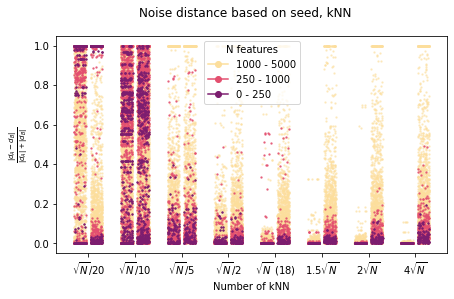

In [62]:
df_0_250 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 250, what='relative noise', by='knn')
df_250_1000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 250, 1000, what='relative noise', by='knn')
df_1000_5000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 1000, 5000, what='relative noise', by='knn')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter(
    [df_1000_5000, df_250_1000, df_0_250], 
    ['1000 - 5000', '250 - 1000', '0 - 250'], 
    lib_prep, org, dataset, by='knn', 
    title='Noise_distance_based_on_seed,_kNN', ylabel="$\\frac{|d_A-d_B|}{|d_A| + |d_B|}$")

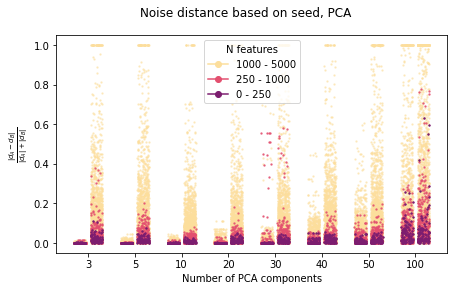

In [63]:
df_0_250 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 250, what='relative noise', by='pca')
df_250_1000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 250, 1000, what='relative noise', by='pca')
df_1000_5000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 1000, 5000, what='relative noise', by='pca')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_1000_5000, df_250_1000, df_0_250], 
                        ['1000 - 5000', '250 - 1000', '0 - 250'], 
                       lib_prep, org, dataset, by='pca',
                      title='Noise_distance_based_on_seed,_PCA', ylabel="$\\frac{|d_A-d_B|}{|d_A| + |d_B|}$")

For kNN we see that there is generally a sweet spot between $\sqrt{N}/2$ and 2$\sqrt{N}$, with smaller variation in the distances without randomization. As for PCA components, we see that, interestingly, seed noise increases with the number of PCA components. Although paradoxical, it makes sense: first components are less prone to ve variable, and thus it is more difficult to experience noise. In fact, if we consider 3 components, the noise is almost 0 in the non-randomized set of distances, which tells us that the noise in the randomized set of distances arises mainly due to dataset randomization. However, although the noise is small, it does not mean that the selected features are the correct ones! Fewer components means less information from the datasets. We'll see that when we compare festures across components, later on. 

In the next plots we will consider directly the overlapping between features. For each set of features within an overlap range, we will see the percentage of overlap between those features. That is, for example, for kNN = $\sqrt{N}$ and 100 PCA components, compare the first 250 features between seed 0 and seed 1. Instead of considering features 250 - 1000 and 1000 - 5000, we will consider features 0 - 1000 and 0 - 5000 directly.

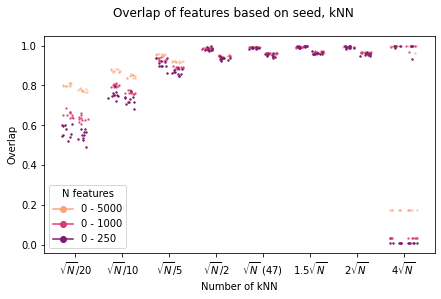

In [73]:
df_0_250 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 250, what='overlap', by='knn')
df_0_1000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='overlap', by='knn')
df_0_5000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='overlap', by='knn')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_0_5000, df_0_1000, df_0_250], 
   ['0 - 5000', '0 - 1000', '0 - 250'],
    lib_prep, org, dataset, step=1, by='knn',
        palette = 'sunsetmid3', 
        title='Overlap_of_features_based_on_seed,_kNN', ylabel="Overlap")

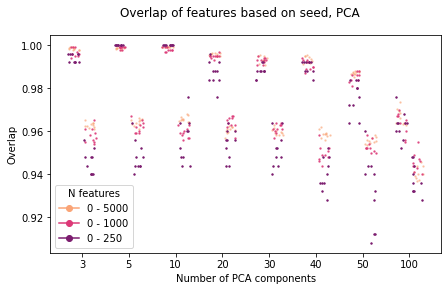

In [74]:
df_0_250 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 250, what='overlap', by='pca')
df_0_1000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='overlap', by='pca')
df_0_5000 = random_noise_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='overlap', by='pca')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_0_5000, df_0_1000, df_0_250], 
            ['0 - 5000', '0 - 1000', '0 - 250'], lib_prep, org, dataset,
            step=1, palette = 'sunsetmid3', 
            by='pca', title='Overlap_of_features_based_on_seed,_PCA', ylabel="Overlap")

We see a similar trend than in the previous case: low kNN values can be detrimental to the quality of feature selection, although the effect is resolved with a number of kNN between $\sqrt{N}/2$ and 2$\sqrt{N}$. Regarding PCA components, there is not much variation, with overlap values higher than 95% at sensible PCA component values near 20-30.

# Robustness between different parameter values
In this section we are going to compare the overlapping percentage of number of features given different parameter values. As in the previous section, we are going to fix:
* number of kNN in $\sqrt{N}$, number of windows in 100 to see changes in PCA components.
* number of PCA components in 30, number of windows in 100 to see changes in kNN values.
* additionally, we are going to fix the number of PCA components in 30 and number of kNN in $\sqrt{N}$ to see changes on number of windows for median correction. 

The strategy in this case will be the same: consider distance values for each of the parametters, and calculate the overlap between the first N features. For example, when comparing kNN values, we are going to compare the values from $\sqrt{N}$, seed 0 with $2\sqrt{N}$ seed 1, seed 2, etc. We will also compare $\sqrt{N}$ with itself, which has already been done, but which will still be useful.

We will also apply the Pearson correlation between the distances for the first N features. Pearson correlation, in contrast to overlap of features, will be more robust, but less realiable, because we are interested in the selected features.

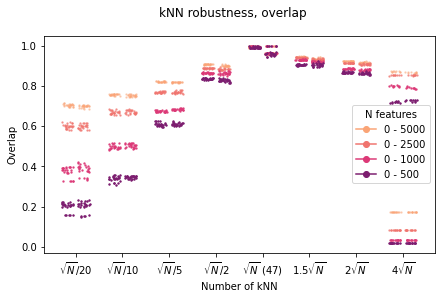

In [75]:
df_violin_0_500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 500, what='overlap', by='knn')
df_violin_0_1000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='overlap', by='knn')
df_violin_0_2500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 2500, what='overlap', by='knn')
df_violin_0_5000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='overlap', by='knn')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_violin_0_5000, df_violin_0_2500, df_violin_0_1000, df_violin_0_500], 
   ['0 - 5000',  '0 - 2500', '0 - 1000', '0 - 500'], 
    lib_prep, org, dataset, step=1, palette = 'sunsetmid4', by='knn',
        title='kNN_robustness,_overlap', ylabel="Overlap")

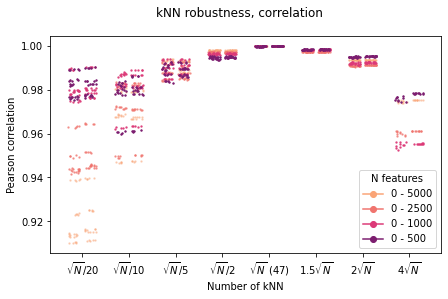

In [76]:
df_violin_0_500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 500, what='correlation', by='knn')
df_violin_0_1000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='correlation', by='knn')
df_violin_0_2500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 2500, what='correlation', by='knn')
df_violin_0_5000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='correlation', by='knn')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_violin_0_5000, df_violin_0_2500, df_violin_0_1000, df_violin_0_500], 
   ['0 - 5000',  '0 - 2500', '0 - 1000', '0 - 500'], 
    lib_prep, org, dataset, step=1, 
    palette = 'sunsetmid4', by='knn',
    title='kNN_robustness,_correlation', 
    ylabel='Pearson correlation')

There is a general trend across datasets: overlap across kNN values decreases quite rapidly, so kNN is a sensitive parameter to choose. Generally, values between $\sqrt{N}/2$ and $\sqrt{N}$ have similar overlaps (70-80% in worst case scenario). The overlaps with larger knn values, interestingly, decreases more rapidly. This might be because, since many of the features of interest have a lower expression as a whole, or more concentrated across datasets, such a high kNN value can imply a selection of cells larger than the original number of cells of interest for a interesting feature, and therefore the kNN expression for the cells of interest is mixed with noise from cells that are not that interesting. 

For example, if a population in a 10000 cell dataset has 150 cells with a characteristic expression pattern, using $5\sqrt{N} = 500$ cells will include zero or noisy counts from 350 cells. Therefore, the kNN expression will be noisier and the features will not be selected as wells as with k = $\sqrt{N} = 100$ cells.

Therefore, if you expect a small subpopulation, it might even be better to set $0.5\sqrt{N}$ as the preferable k. This value is set by default.

Generally, for datasets with higher number of detected genes the overlap is greater, around 85-90% between $\sqrt{N}/2$ and $\sqrt{N}$. 

Although it depends on the dataset, there is a general trend that overlaps are smaller for a more reduced number of features, whereas for higher number of features the overlap is greater. I do not know why this might happen. Possibly, there is a range of slected features in the 2000 to 5000 scale that will always be selected because the rest is expression noise, or much less defined genes, that is, genes with much less localized expression patterns.

We don't see a clear variation due to randomization.

Regarding correlation values, they all are much higher, above 0.9 or 0.95 for most cases. There is a more marked trend of higher corelation values up to $2\sqrt{N}$, with a sudden drop in $5\sqrt{N}$.

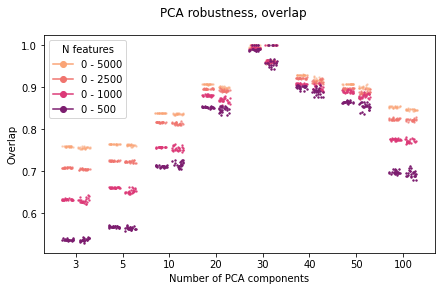

In [77]:
df_violin_0_500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 500, what='overlap', by='pca')
df_violin_0_1000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='overlap', by='pca')
df_violin_0_2500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 2500, what='overlap', by='pca')
df_violin_0_5000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='overlap', by='pca')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_violin_0_5000, df_violin_0_2500, df_violin_0_1000, df_violin_0_500], 
   ['0 - 5000',  '0 - 2500', '0 - 1000', '0 - 500'], 
    lib_prep, org, dataset, step=1, palette = 'sunsetmid4', by='pca',
                       title='PCA_robustness,_overlap', 
    ylabel='Overlap')

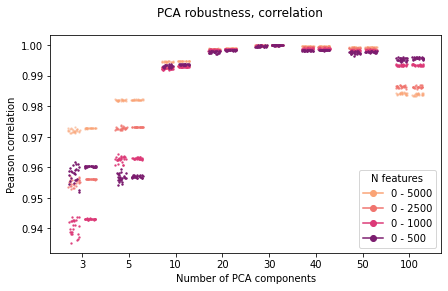

In [78]:
df_violin_0_500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 500, what='correlation', by='pca')
df_violin_0_1000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='correlation', by='pca')
df_violin_0_2500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 2500, what='correlation', by='pca')
df_violin_0_5000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='correlation', by='pca')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_violin_0_5000, df_violin_0_2500, df_violin_0_1000, df_violin_0_500], 
   ['0 - 5000',  '0 - 2500', '0 - 1000', '0 - 500'], 
    lib_prep, org, dataset, step=1, 
    palette = 'sunsetmid4', by='pca', 
    title='PCA_robustness,_correlation', 
    ylabel='Pearson correlation')

When we look at PCA component-based overlap, there is not a clear trend. Generally, overlap with cases of less than 20 components tend to be really different, and a number of components between 20 and 50 have similar overlap values.

Again, library preparation methods that yield higher number of detected genes tend to score higher, which might be expected, because the *resolution* per gene will be better.

We don't see a clear variation due to randomization.

Correlation values are above 0.95 in all cases, regardless of dataset. The trends are the same as with overlap, but much marked.

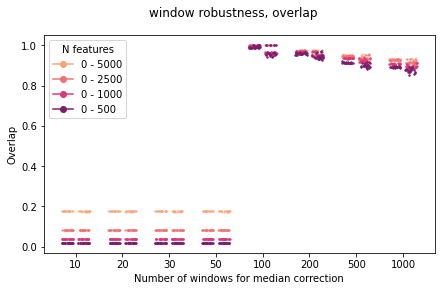

In [79]:
df_violin_0_500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 500, what='overlap', by='w')
df_violin_0_1000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='overlap', by='w')
df_violin_0_2500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 2500, what='overlap', by='w')
df_violin_0_5000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='overlap', by='w')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_violin_0_5000, df_violin_0_2500, df_violin_0_1000, df_violin_0_500], 
   ['0 - 5000',  '0 - 2500', '0 - 1000', '0 - 500'], 
    lib_prep, org, dataset, step=1, palette = 'sunsetmid4', by='w', title='window_robustness,_overlap', 
    ylabel='Overlap')

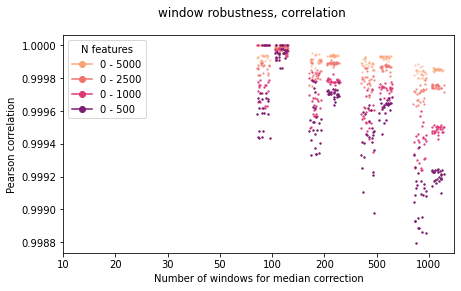

In [80]:
df_violin_0_500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 500, what='correlation', by='w')
df_violin_0_1000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 1000, what='correlation', by='w')
df_violin_0_2500 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 2500, what='correlation', by='w')
df_violin_0_5000 = compare_parameter(lib_prep, org, dataset, save_dir, 0, 5000, what='correlation', by='w')

# Remember: left = non randomized - right = randomized
plot_scatter_parameter([df_violin_0_5000, df_violin_0_2500, df_violin_0_1000, df_violin_0_500], 
   ['0 - 5000',  '0 - 2500', '0 - 1000', '0 - 500'], 
    lib_prep, org, dataset, step=1, palette = 'sunsetmid4', by='w',
    title='window_robustness,_correlation',
    ylabel="Pearson correlation")

Robustness on windows is really high. Overlap values are higher than 90%. Correlation values are much higher, above 0.99. There is a *symmetrical* decrease of over number of windows, which is expected as we saw on the `3_Why_applying_median_correction_is_a_good_option.ipynb` notebook.

# Iterate in all datasets!
Since there are many datasets to iterate on, the same code used in the notebook is within `robustness_functions.py` so that it can be run in all datasets.

human mereu SingleNuclei
human ding SingleNuclei
human mereu inDrop
human ding inDrop
human mereu 10X
human ding 10X
human mereu SMARTseq2
human ding SMARTseq2
human mereu CELseq2
human ding CELseq2
human mereu QUARTZseq
human mereu Dropseq
human ding Dropseq
human ding Seq-Well
mouse mereu SingleNuclei
mouse mereu inDrop
mouse mereu 10X
mouse ding 10X
mouse mereu SMARTseq2
mouse ding SMARTseq2
mouse mereu CELseq2
mouse mereu QUARTZseq
mouse mereu Dropseq


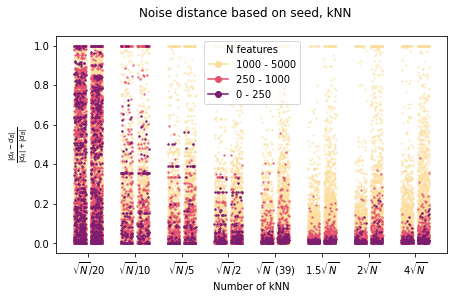

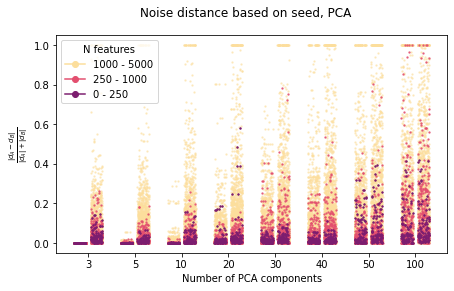

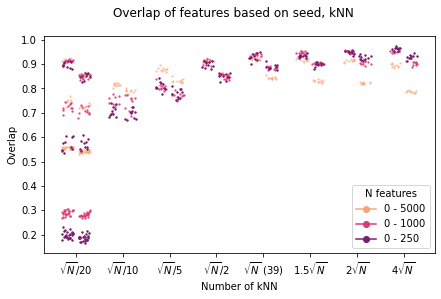

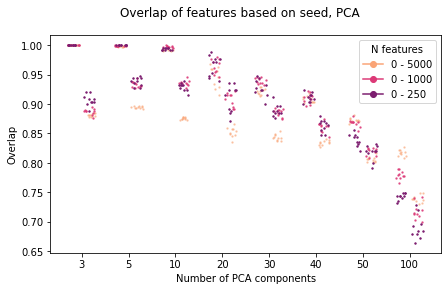

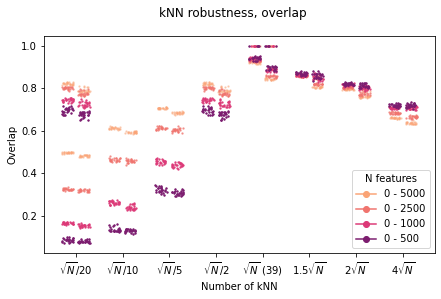

...

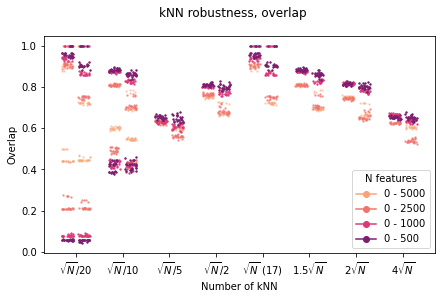

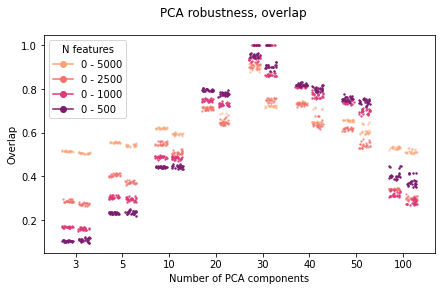

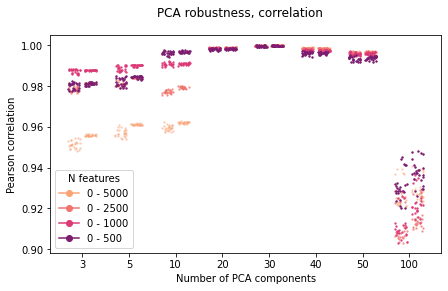

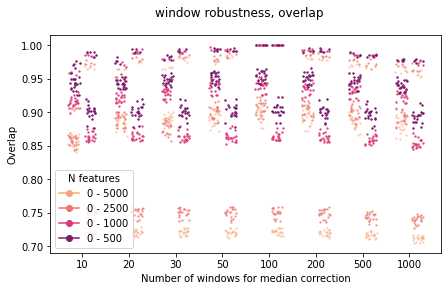

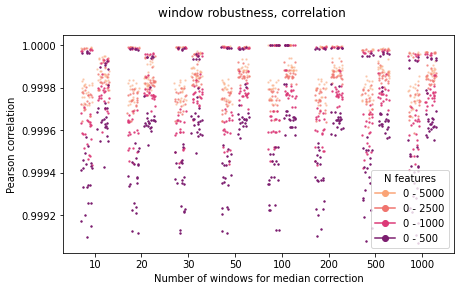

In [41]:
listdir = os.listdir(save_dir)
for org in ['human', 'mouse']:
    for lib_prep in ['SingleNuclei', 'inDrop', '10X', 'SMARTseq2', 'CELseq2', 'QUARTZseq', 'Dropseq', 'sci-RNAseq', 'Seq-Well',]:
        for dataset in ['mereu', 'ding']:
            matchfiles = [i for i in listdir if org in i and lib_prep in i and dataset in i]
            if matchfiles:
                print(org, dataset, lib_prep)
                get_all_pics_dataset(lib_prep, org, dataset, save_dir)

# Comparison of robustness across datasets
In this section we are going to compare overlap values across kNN, PCA components and windows, using different datasets. To do that we are going to use three number of feature values (0-500 / 1000 / 2500) and plot for 1000 a line plot and a between_plot between 500 and 2500. The point that will be plotted will be the mean of overlaps between the different seeds.

In [51]:
dataset, org, lib_preps = 'mereu', 'human', ['SingleNuclei', 'inDrop', '10X', 'SMARTseq2', 'CELseq2', 'QUARTZseq',]
what = 'overlap'

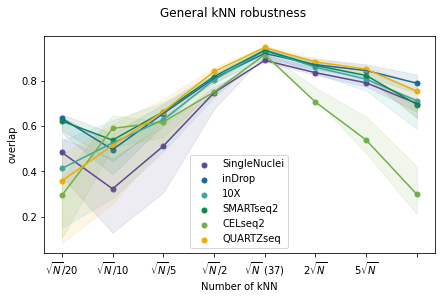

In [52]:
list_dicts_dfs = [{}, {}, {}]
low_val, mid_val, hi_val = 500, 1500, 2500

for lib_prep in lib_preps:
    list_dicts_dfs[0][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, low_val, what=what, by=by)
    list_dicts_dfs[1][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, mid_val, what=what, by=by)
    list_dicts_dfs[2][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, hi_val, what=what, by=by)
    
plot_scatter_datasets(list_dicts_dfs, org, by='knn', figsize=(7, 4),  palette='prism',
                           title=f'General_kNN_robustness', ylabel=what, save_dir='robustness_figs')

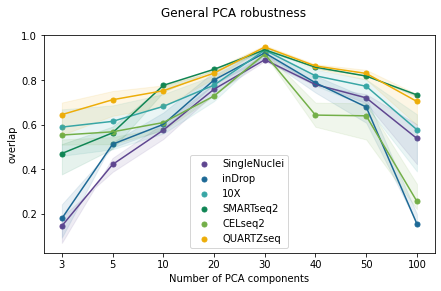

In [59]:
list_dicts_dfs = [{}, {}, {}]
low_val, mid_val, hi_val = 500, 1500, 2500

for lib_prep in lib_preps:
    list_dicts_dfs[0][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, low_val, what=what, by='pca')
    list_dicts_dfs[1][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, mid_val, what=what, by='pca')
    list_dicts_dfs[2][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, hi_val, what=what, by='pca')
    
plot_scatter_datasets(list_dicts_dfs, org, by='pca', figsize=(7, 4),  palette='prism',
                           title=f'General_PCA_robustness', ylabel=what, save_dir='robustness_figs')

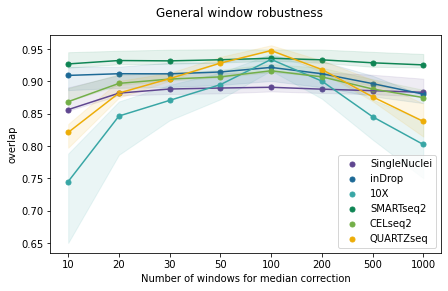

In [60]:
list_dicts_dfs = [{}, {}, {}]
low_val, mid_val, hi_val = 500, 1500, 2500

for lib_prep in lib_preps:
    list_dicts_dfs[0][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, low_val, what=what, by='w')
    list_dicts_dfs[1][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, mid_val, what=what, by='w')
    list_dicts_dfs[2][lib_prep] = compare_parameter(lib_prep, org, dataset, save_dir, 0, hi_val, what=what, by='w')
    
plot_scatter_datasets(list_dicts_dfs, org, by='w', figsize=(7, 4),  palette='prism',
                           title=f'General_window_robustness', ylabel=what, save_dir='robustness_figs')